In [45]:
import numpy as np
import pandas as pd
from pathlib import Path
import scipy as scipy
from scipy import signal
from scipy.fft import fft, fftfreq
import matplotlib.pyplot as plt
import seaborn as sns

In [39]:
# Starter code to see everything is loading fine
# Data paths
data_path_1 = Path("../datasets/1st_test")
data_path_2 = Path("../datasets/2nd_test")
data_path_3 = Path("../datasets/3rd_test")

def load_bearing_file(file_path):
    """Load single bearing data file"""
    return np.loadtxt(file_path)


first_file_1 = sorted(data_path_1.glob("*"))[0]
first_data_1 = load_bearing_file(first_file_1)

print(f"Data shape: {first_data_1.shape}")  

Data shape: (20480, 8)


In [25]:
def analyze_frequency_components(data, channel, sampling_rate=20000):
    """
    Analyze frequency components of bearing vibration data.
    
    Args:
        data: Raw vibration data array
        channel: Channel number to analyze (0-7 for Set 1, 0-3 for Sets 2&3)
        sampling_rate: Data collection rate (Hz)
    """
    # Extract single channel data
    channel_data = data[:, channel]
    
    # Calculate FFT
    n = len(channel_data)
    fft_result = fft(channel_data)
    
    # Get frequencies corresponding to FFT results
    freq = fftfreq(n, 1/sampling_rate)
    
    # Calculate magnitude spectrum (ignore negative frequencies)
    magnitude = 2.0/n * np.abs(fft_result[0:n//2])
    freq = freq[0:n//2]
    
    # Plot time domain and frequency domain
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
    
    # Time domain plot
    time = np.arange(n) / sampling_rate
    ax1.plot(time, channel_data)
    ax1.set_title(f'Time Domain Signal - Channel {channel+1}')
    ax1.set_xlabel('Time (seconds)')
    ax1.set_ylabel('Amplitude')
    
    # Frequency domain plot
    ax2.plot(freq, magnitude)
    ax2.set_title('Frequency Spectrum')
    ax2.set_xlabel('Frequency (Hz)')
    ax2.set_ylabel('Magnitude')
    ax2.set_xlim(0, 5000)  # Focus on 0-5kHz range where most bearing frequencies occur
    
    plt.tight_layout()
    return freq, magnitude



[-1937.262      -0.j           -11.11930492+10.11657374j
    -5.01229792 +7.02436418j ...     6.09064679-10.14155186j
    -5.01229792 -7.02436418j   -11.11930492-10.11657374j]
[ 0.         0.9765625  1.953125  ... -2.9296875 -1.953125  -0.9765625]
First few frequencies (Hz): [0.        0.9765625 1.953125  2.9296875 3.90625  ]
First few magnitudes: [0.18918574 0.00146804 0.00084271 0.00115527 0.00029189]

Peak frequency: 0.0 Hz
Peak magnitude: 0.18918574218750003


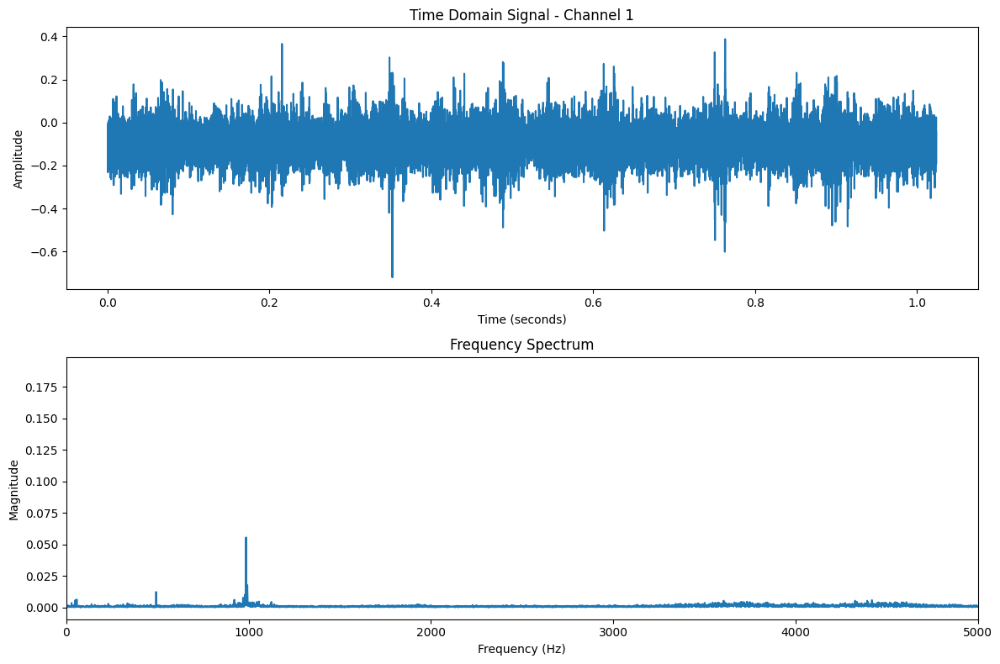

In [19]:
# Let's analyze first bearing (channels 0 and 1) from Set 1
freq, mag = analyze_frequency_components(first_data_1, 0)
print("First few frequencies (Hz):", freq[:5])
print("First few magnitudes:", mag[:5])
print("\nPeak frequency:", freq[np.argmax(mag)], "Hz")
print("Peak magnitude:", np.max(mag))

=== Healthy Bearing ===

=== Same Bearing Near Failure ===

Key Frequency Band Changes:
Low (0-1000 Hz): 114.5% increase
Mid (1000-3000 Hz): 196.0% increase
High (3000-5000 Hz): 221.1% increase


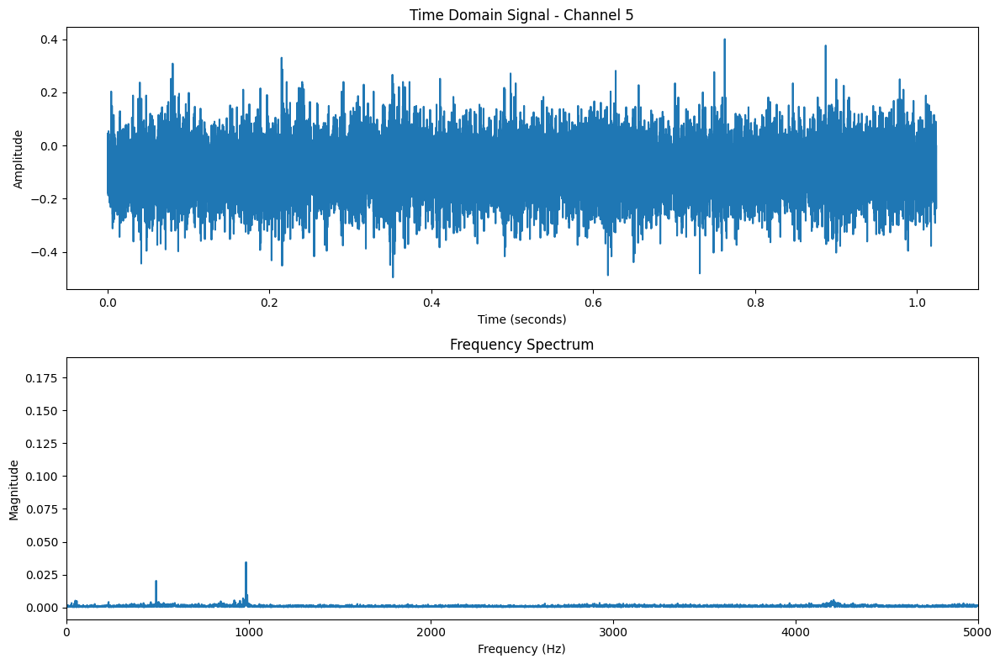

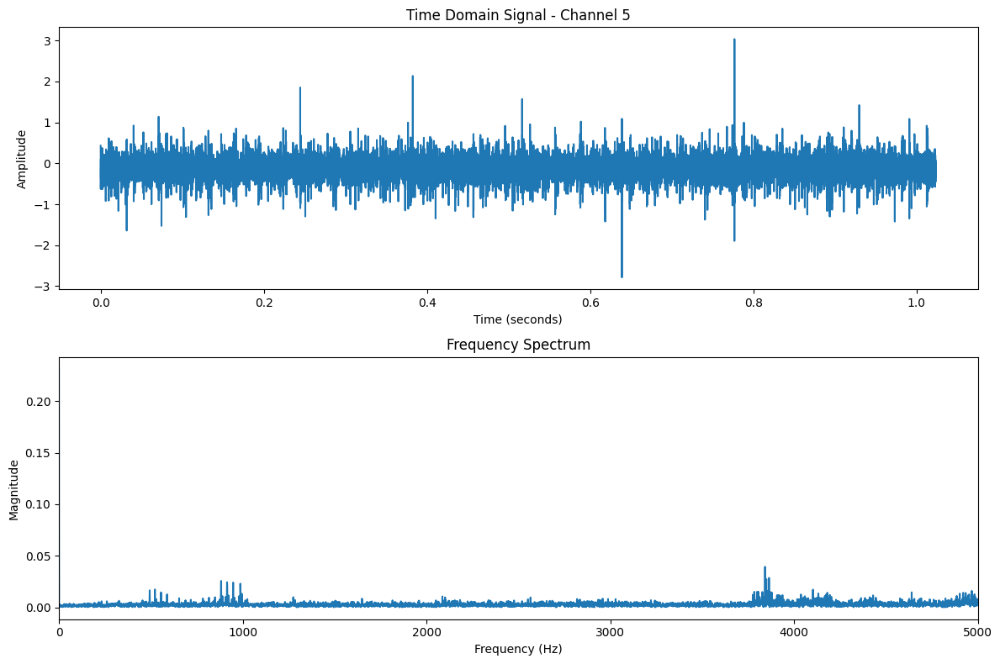

In [13]:
# Let's look at both channels for Bearing 3 (channels 4 and 5)
# First, get first file (healthy) and last file (failed)
files = sorted(data_path_1.glob("*"))
healthy_data = load_bearing_file(files[0])
failing_data = load_bearing_file(files[-5])  # Using -5 to get a clear failure signal

# Let's look at Channel 5 (index 4) first
print("=== Healthy Bearing ===")
freq_h, mag_h = analyze_frequency_components(healthy_data, 4)
print("\n=== Same Bearing Near Failure ===")
freq_f, mag_f = analyze_frequency_components(failing_data, 4)

# Print some comparisons
print("\nKey Frequency Band Changes:")
def get_band_energy(freq, mag, low, high):
    mask = (freq >= low) & (freq < high)
    return np.sum(mag[mask])

# Calculate energies in each band
bands = {
    "Low (0-1000 Hz)": (0, 1000),
    "Mid (1000-3000 Hz)": (1000, 3000),
    "High (3000-5000 Hz)": (3000, 5000)
}

for band_name, (low, high) in bands.items():
    healthy_energy = get_band_energy(freq_h, mag_h, low, high)
    failing_energy = get_band_energy(freq_f, mag_f, low, high)
    increase = ((failing_energy - healthy_energy) / healthy_energy) * 100
    print(f"{band_name}: {increase:.1f}% increase")

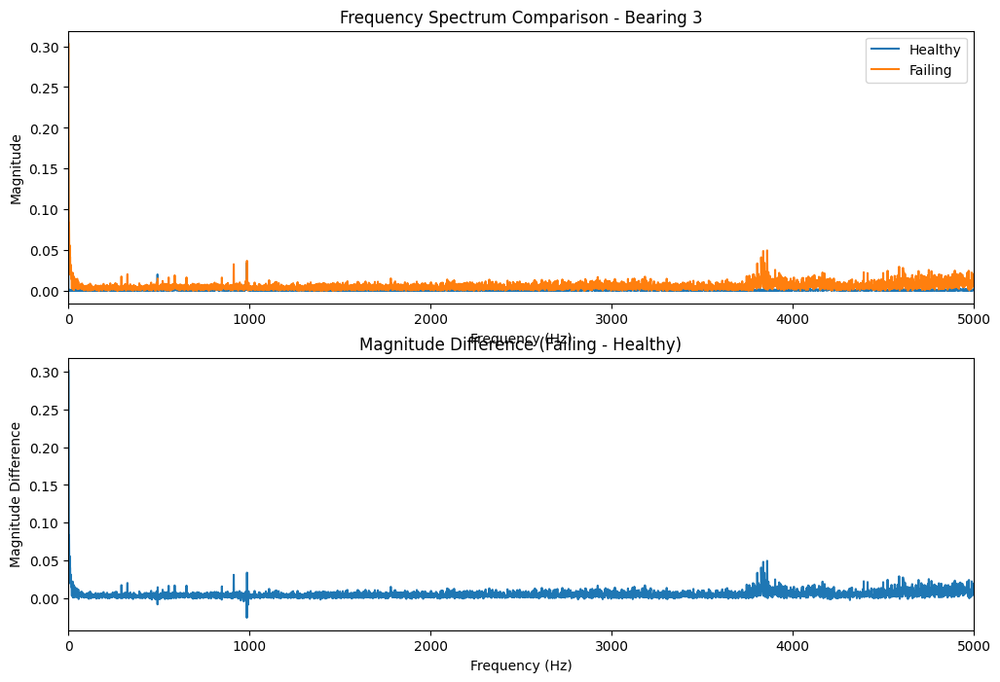

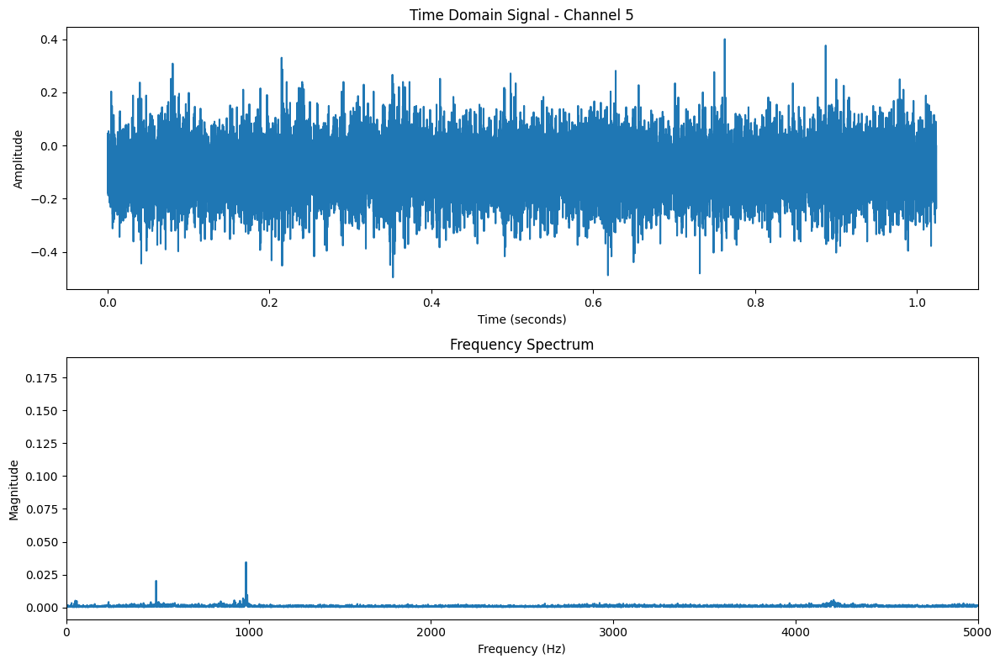

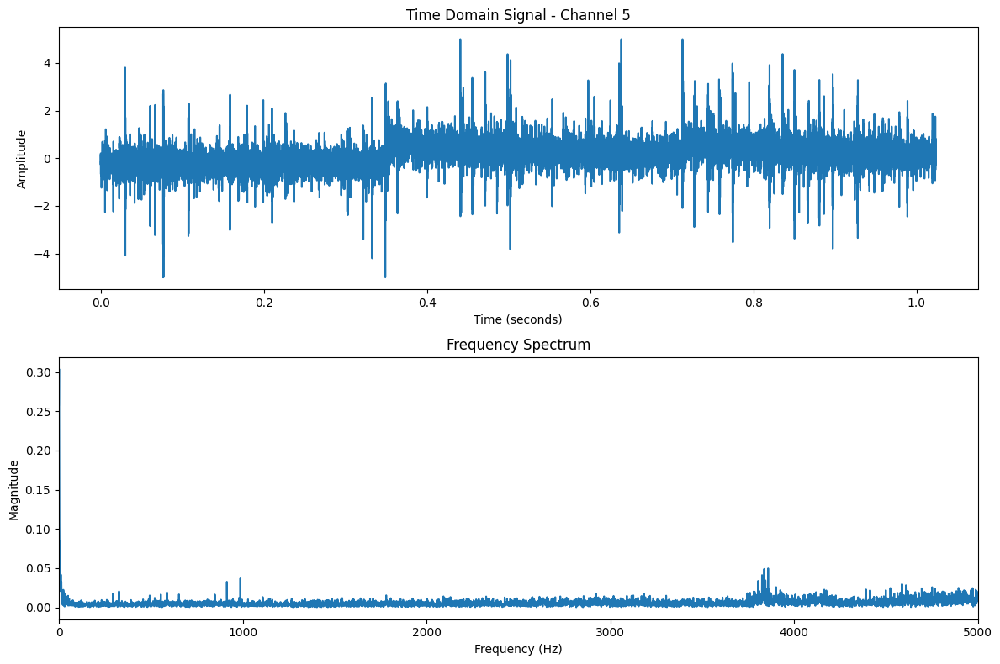

In [6]:
def compare_healthy_vs_failing(data_path, bearing_num, start_file, end_file, channel):
    """Compare frequency spectrum of a bearing at start vs end of life"""
    
    # Load files
    files = sorted(data_path.glob("*"))
    healthy_data = load_bearing_file(files[start_file])
    failing_data = load_bearing_file(files[end_file])
    
    # Create subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
    
    # Analyze both states
    freq_healthy, mag_healthy = analyze_frequency_components(healthy_data, channel)
    freq_failing, mag_failing = analyze_frequency_components(failing_data, channel)
    
    # Plot comparisons
    ax1.plot(freq_healthy, mag_healthy, label='Healthy')
    ax1.plot(freq_failing, mag_failing, label='Failing')
    ax1.set_title(f'Frequency Spectrum Comparison - Bearing {bearing_num}')
    ax1.set_xlabel('Frequency (Hz)')
    ax1.set_ylabel('Magnitude')
    ax1.set_xlim(0, 5000)
    ax1.legend()
    
    # Plot magnitude difference
    ax2.plot(freq_healthy, mag_failing - mag_healthy)
    ax2.set_title('Magnitude Difference (Failing - Healthy)')
    ax2.set_xlabel('Frequency (Hz)')
    ax2.set_ylabel('Magnitude Difference')
    ax2.set_xlim(0, 5000)
    
    plt.tight_layout()
    return freq_healthy, mag_healthy, freq_failing, mag_failing

# Let's analyze Bearing 3 from Set 1 (inner race failure)
# Channel 4 (index 4) corresponds to Bearing 3's first channel
freq_h, mag_h, freq_f, mag_f = compare_healthy_vs_failing(data_path_1, 3, 0, -1, 4)

=== Set 1 Analysis ===

Analysis for Bearing 3:
Failure detected at file 2152/2156 (99.8%)

Channel 5 Changes:
Peak Magnitude Change: 24.6%
Mean Magnitude Change: 394.8%
Total Energy Change: 394.8%

Frequency Band Changes:
low_band_change: 195.1%
mid_band_change: 379.5%
high_band_change: 561.0%

Channel 6 Changes:
Peak Magnitude Change: 23.2%
Mean Magnitude Change: 335.8%
Total Energy Change: 335.8%

Frequency Band Changes:
low_band_change: 256.3%
mid_band_change: 385.9%
high_band_change: 486.2%

Analysis for Bearing 4:
Failure detected at file 1752/2156 (81.3%)

Channel 7 Changes:
Peak Magnitude Change: 23.8%
Mean Magnitude Change: 200.8%
Total Energy Change: 200.8%

Frequency Band Changes:
low_band_change: 101.2%
mid_band_change: 349.6%
high_band_change: 211.4%

Channel 8 Changes:
Peak Magnitude Change: 20.8%
Mean Magnitude Change: 168.9%
Total Energy Change: 168.9%

Frequency Band Changes:
low_band_change: 126.6%
mid_band_change: 304.7%
high_band_change: 196.8%

=== Set 2 Analysis =

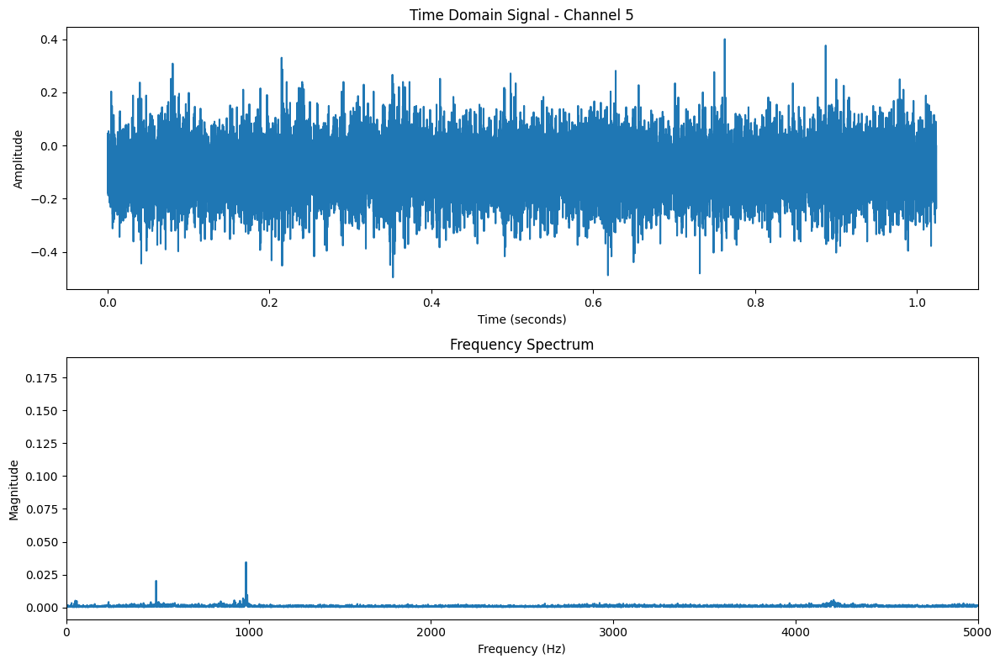

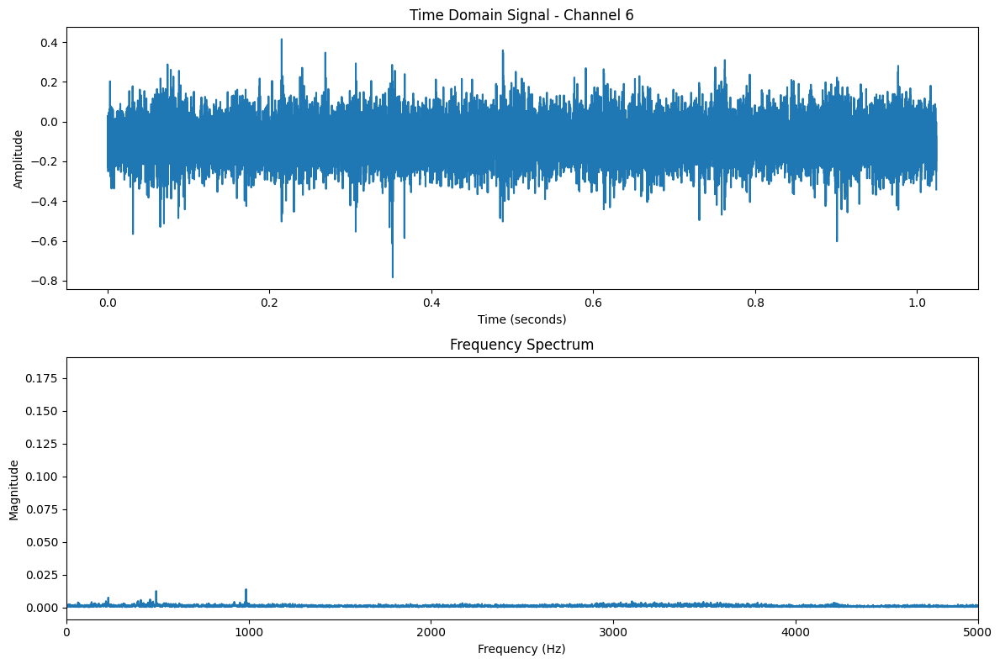

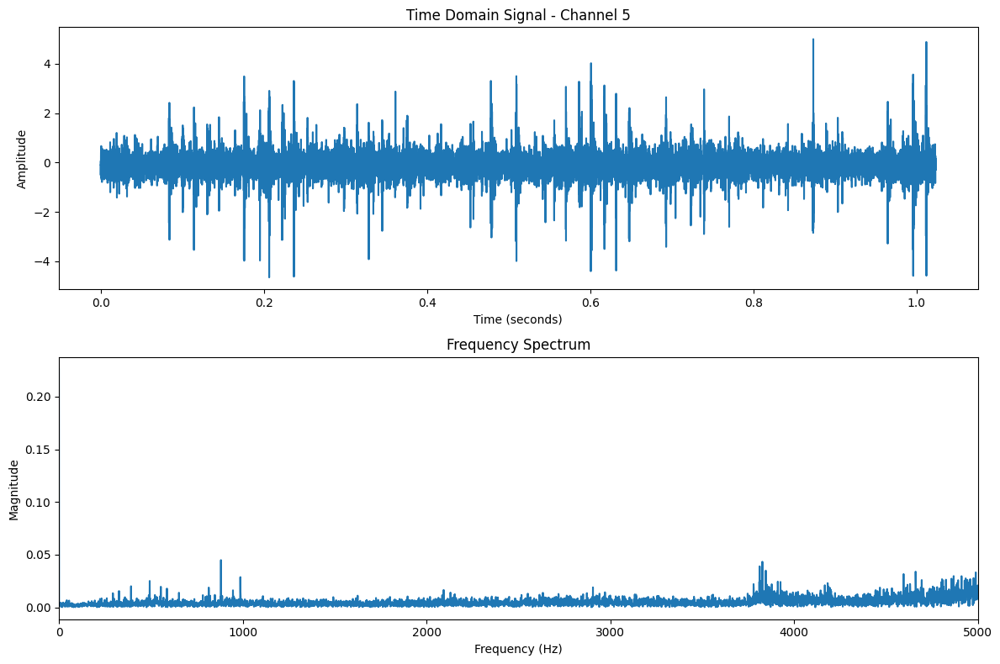

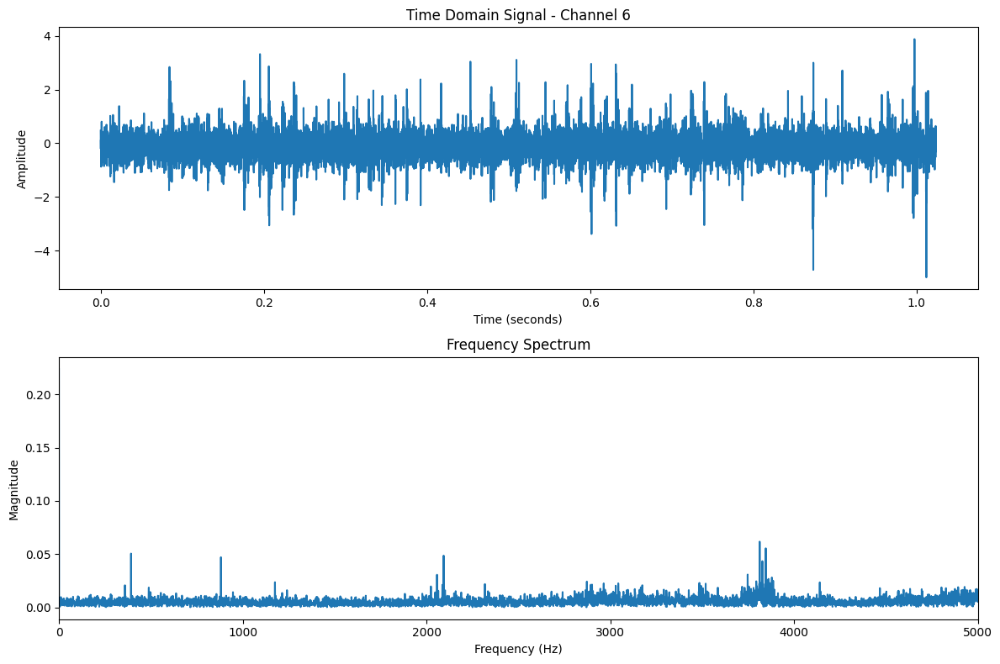

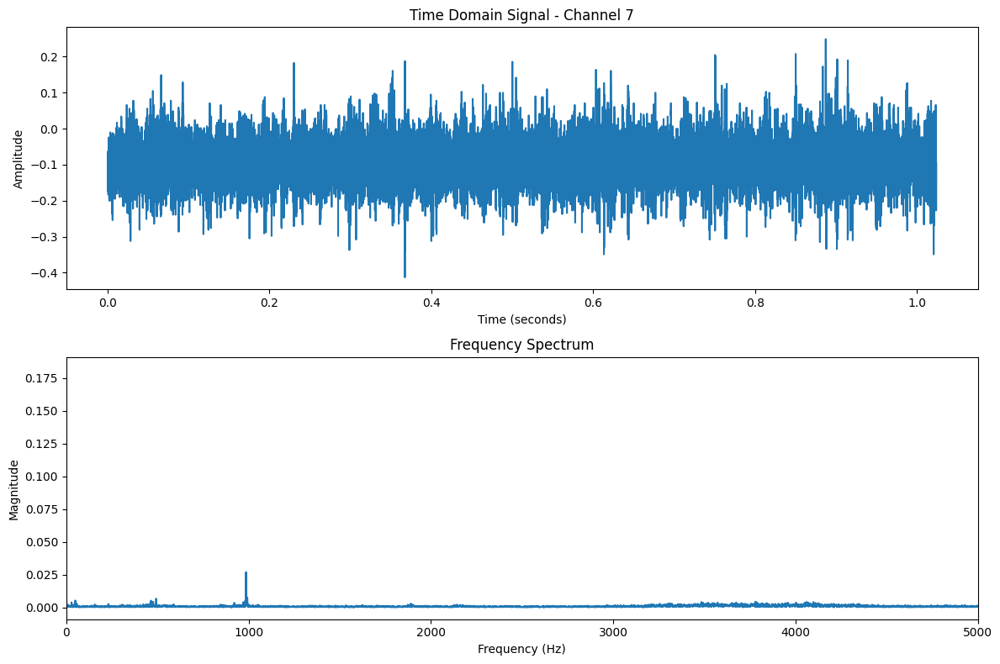

...

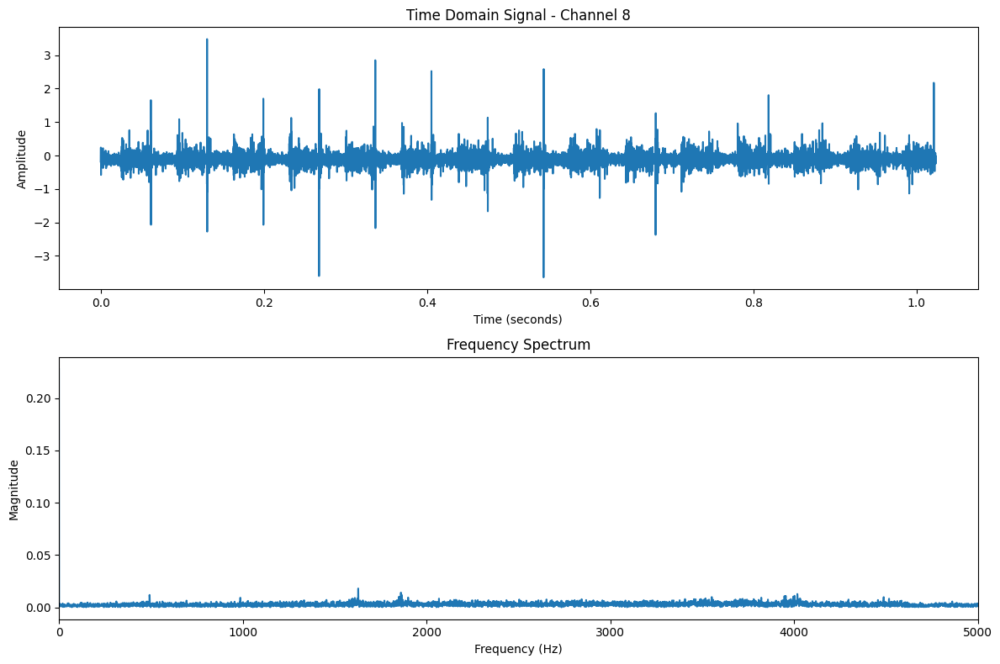

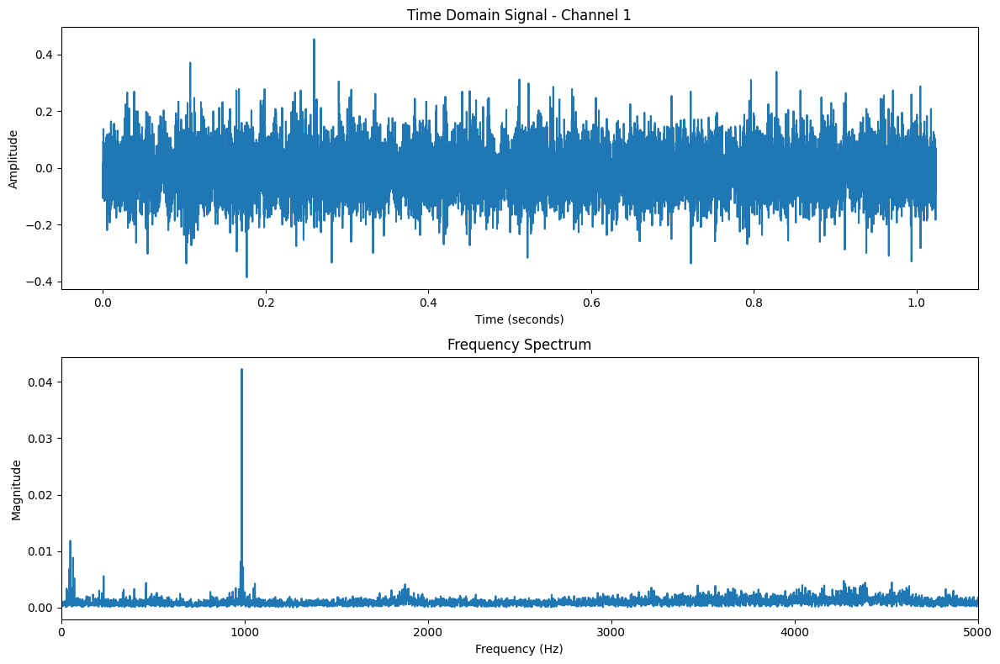

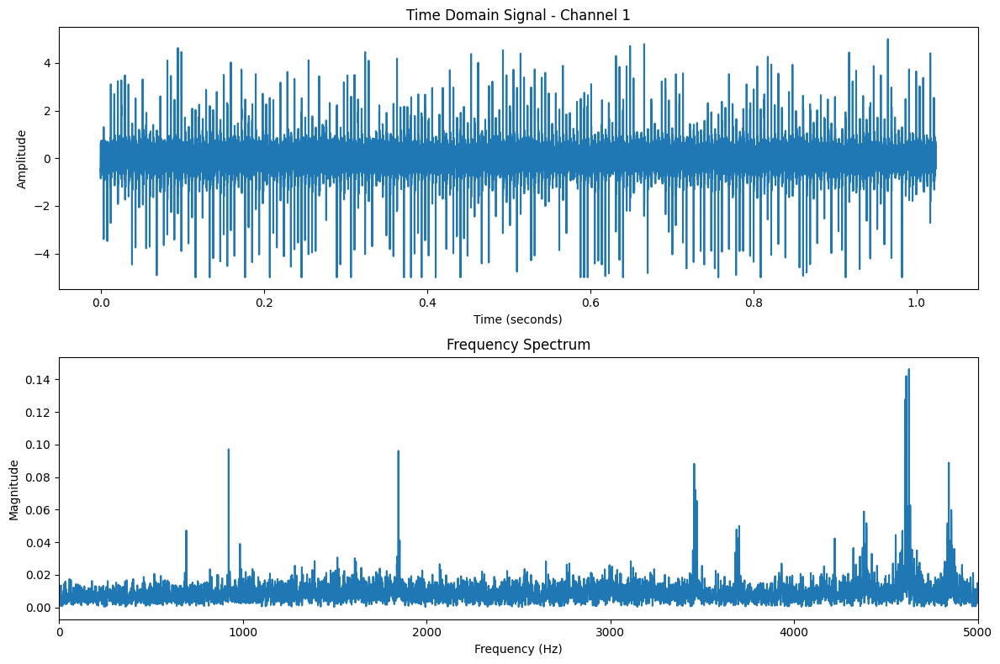

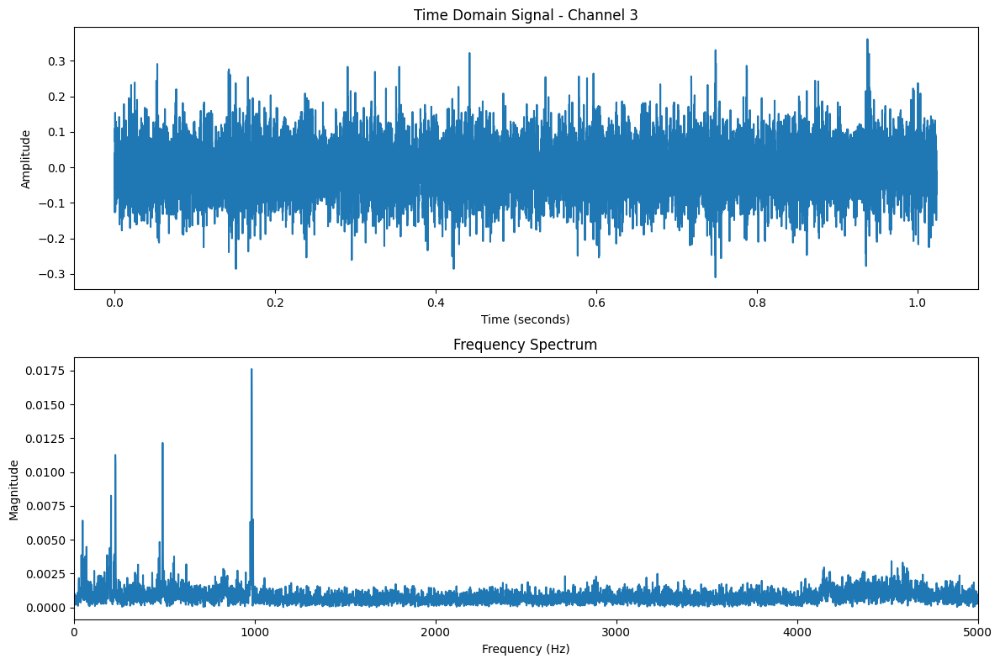

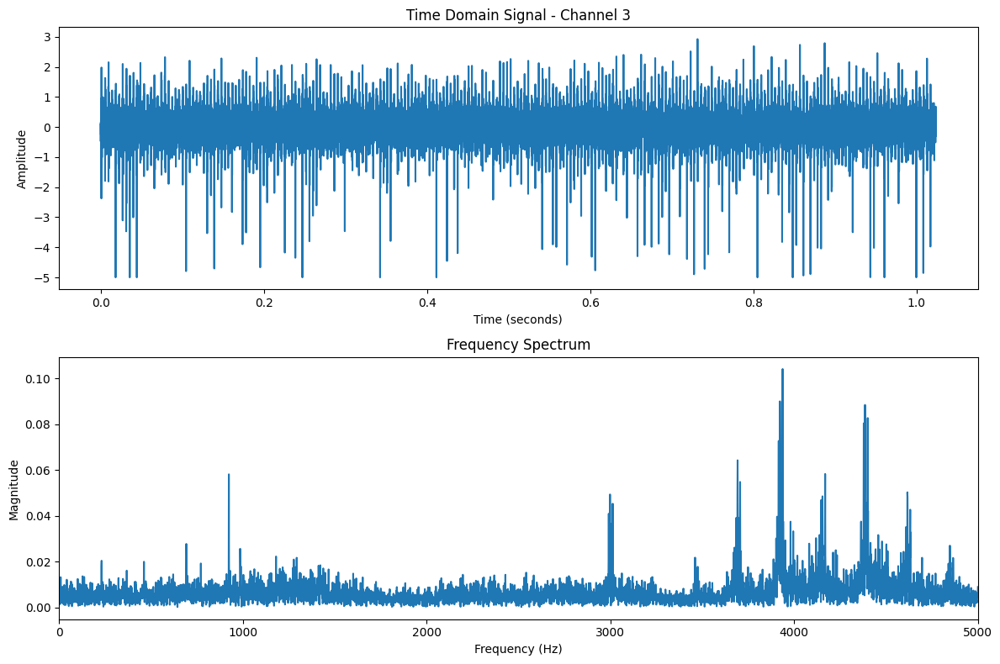

In [7]:
def analyze_bearing_frequencies(data_path, bearing_num, is_set1=True):
    """
    Analyze bearing frequencies with numerical metrics
    """
    # Load files
    files = sorted(data_path.glob("*"))
    total_files = len(files)
    
    # Set channels based on dataset
    if is_set1:
        channels = [2*bearing_num-2, 2*bearing_num-1]  # Two channels per bearing
    else:
        channels = [bearing_num-1]  # One channel per bearing
    
    # Find failing file index based on bearing
    if bearing_num == 4 and is_set1:
        # Find maximum frequency activity across both channels
        max_amp = 0
        failing_idx = 0
        
        for i in range(total_files):
            data = load_bearing_file(files[i])
            # Calculate total frequency energy for both channels
            for channel in channels:
                freq_data = fft(data[:, channel])
                energy = np.sum(np.abs(freq_data))
                if energy > max_amp:
                    max_amp = energy
                    failing_idx = i
    else:
        # Get maximum amplitude file from last 10%
        start_idx = int(total_files * 0.9)
        max_amp = 0
        failing_idx = start_idx
        
        for i in range(start_idx, total_files):
            data = load_bearing_file(files[i])
            amp = np.max(np.abs(data))
            if amp > max_amp:
                max_amp = amp
                failing_idx = i
    
    # Load healthy and failing data
    healthy_data = load_bearing_file(files[0])
    failing_data = load_bearing_file(files[failing_idx])
    
    results = {
        'bearing_number': bearing_num,
        'failure_point': None,
        'frequency_bands': {
            'low': (0, 1000),    # 0-1kHz
            'mid': (1000, 3000), # 1-3kHz
            'high': (3000, 5000) # 3-5kHz
        },
        'healthy': {},
        'failing': {},
        'changes': {}
    }
    
    # Calculate metrics for both states
    for state, data in [('healthy', healthy_data), ('failing', failing_data)]:
        for channel in channels:
            freq, mag = analyze_frequency_components(data, channel)
            
            # Calculate energy in different frequency bands
            band_energies = {}
            for band_name, (low, high) in results['frequency_bands'].items():
                mask = (freq >= low) & (freq < high)
                band_energies[band_name] = np.sum(mag[mask])
            
            # Calculate key metrics
            metrics = {
                f'channel_{channel+1}': {
                    'peak_frequency': freq[np.argmax(mag)],
                    'peak_magnitude': np.max(mag),
                    'mean_magnitude': np.mean(mag),
                    'std_magnitude': np.std(mag),
                    'total_energy': np.sum(mag),
                    'band_energies': band_energies
                }
            }
            
            results[state].update(metrics)
    
    # Calculate changes
    for channel in channels:
        ch_key = f'channel_{channel+1}'
        changes = {}
        
        # Calculate percentage changes for each metric
        healthy_metrics = results['healthy'][ch_key]
        failing_metrics = results['failing'][ch_key]
        
        for metric in ['peak_magnitude', 'mean_magnitude', 'total_energy']:
            healthy_val = healthy_metrics[metric]
            failing_val = failing_metrics[metric]
            pct_change = ((failing_val - healthy_val) / healthy_val) * 100
            changes[f'{metric}_change'] = pct_change
        
        # Calculate band energy changes
        band_changes = {}
        for band in results['frequency_bands'].keys():
            healthy_band = healthy_metrics['band_energies'][band]
            failing_band = failing_metrics['band_energies'][band]
            pct_change = ((failing_band - healthy_band) / healthy_band) * 100
            band_changes[f'{band}_band_change'] = pct_change
        
        changes['band_changes'] = band_changes
        results['changes'][ch_key] = changes
    
    # Add failure point info
    results['failure_point'] = {
        'file_index': failing_idx,
        'percentage': (failing_idx/total_files)*100
    }
    
    print(f"\nAnalysis for Bearing {bearing_num}:")
    print(f"Failure detected at file {failing_idx}/{total_files} ({(failing_idx/total_files)*100:.1f}%)")
    
    for channel in channels:
        ch_key = f'channel_{channel+1}'
        changes = results['changes'][ch_key]
        print(f"\nChannel {channel+1} Changes:")
        print(f"Peak Magnitude Change: {changes['peak_magnitude_change']:.1f}%")
        print(f"Mean Magnitude Change: {changes['mean_magnitude_change']:.1f}%")
        print(f"Total Energy Change: {changes['total_energy_change']:.1f}%")
        print("\nFrequency Band Changes:")
        for band, change in changes['band_changes'].items():
            print(f"{band}: {change:.1f}%")
    
    return results

# Run analysis
results = {}
print("=== Set 1 Analysis ===")
results['set1_b3'] = analyze_bearing_frequencies(data_path_1, 3, is_set1=True)  # Inner race
results['set1_b4'] = analyze_bearing_frequencies(data_path_1, 4, is_set1=True)  # Roller

print("\n=== Set 2 Analysis ===")
results['set2_b1'] = analyze_bearing_frequencies(data_path_2, 1, is_set1=False)  # Outer race

print("\n=== Set 3 Analysis ===")
results['set3_b3'] = analyze_bearing_frequencies(data_path_3, 3, is_set1=False)  # Outer race

Analyzing file 2152 of 2156 for failing state


(array([0.00000000e+00, 9.76562500e-01, 1.95312500e+00, ...,
        9.99707031e+03, 9.99804688e+03, 9.99902344e+03]),
 array([0.18176123, 0.00198641, 0.00188224, ..., 0.00314338, 0.00146393,
        0.00189579]),
 array([0.00000000e+00, 9.76562500e-01, 1.95312500e+00, ...,
        9.99707031e+03, 9.99804688e+03, 9.99902344e+03]),
 array([0.22391943, 0.00724665, 0.00423815, ..., 0.00056351, 0.00371342,
        0.00322393]))

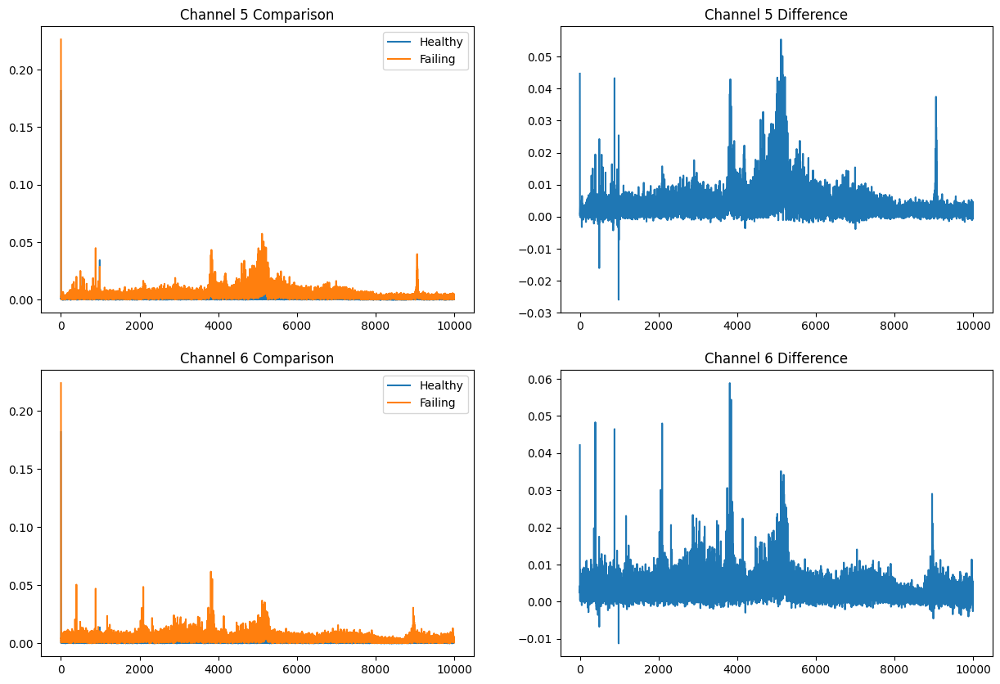

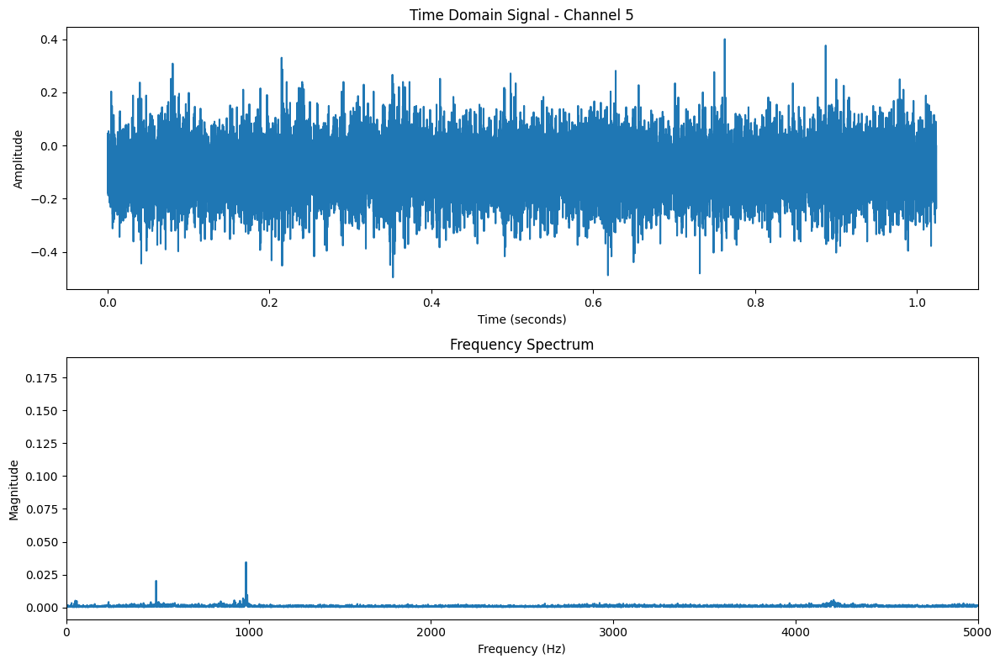

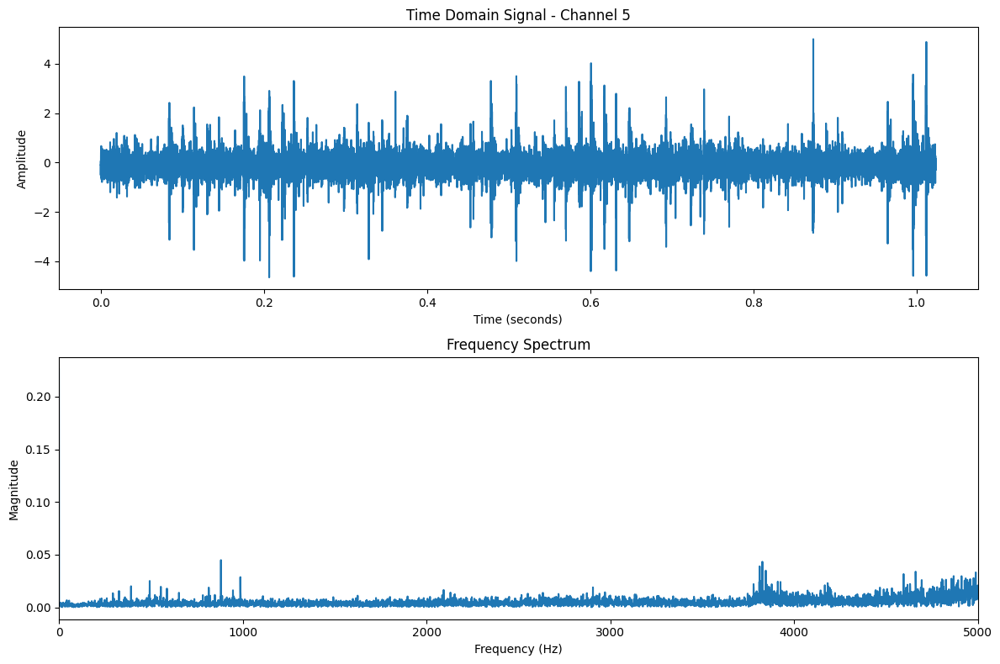

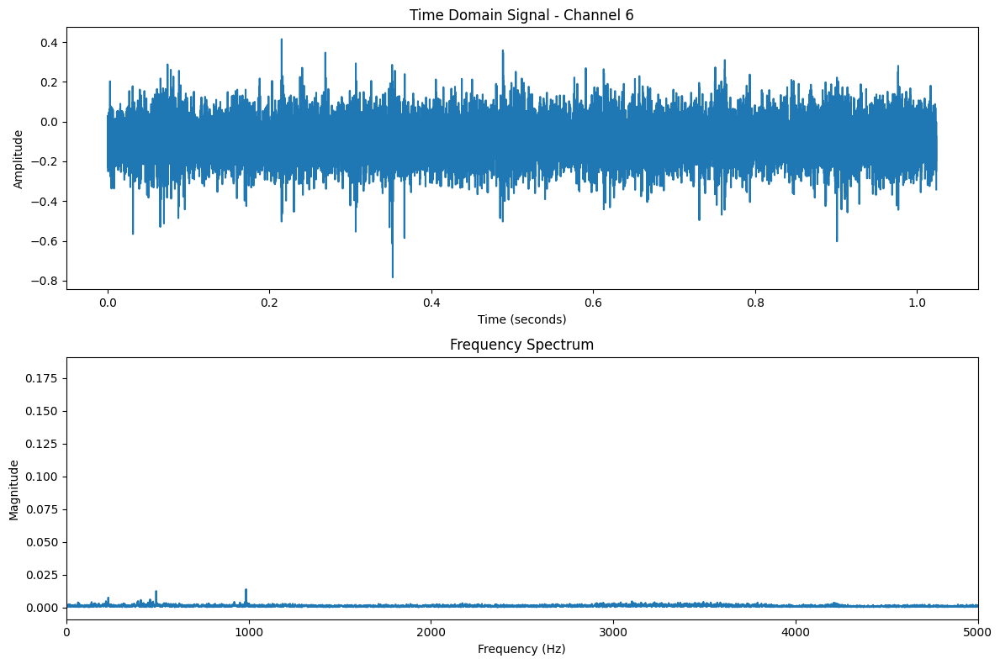

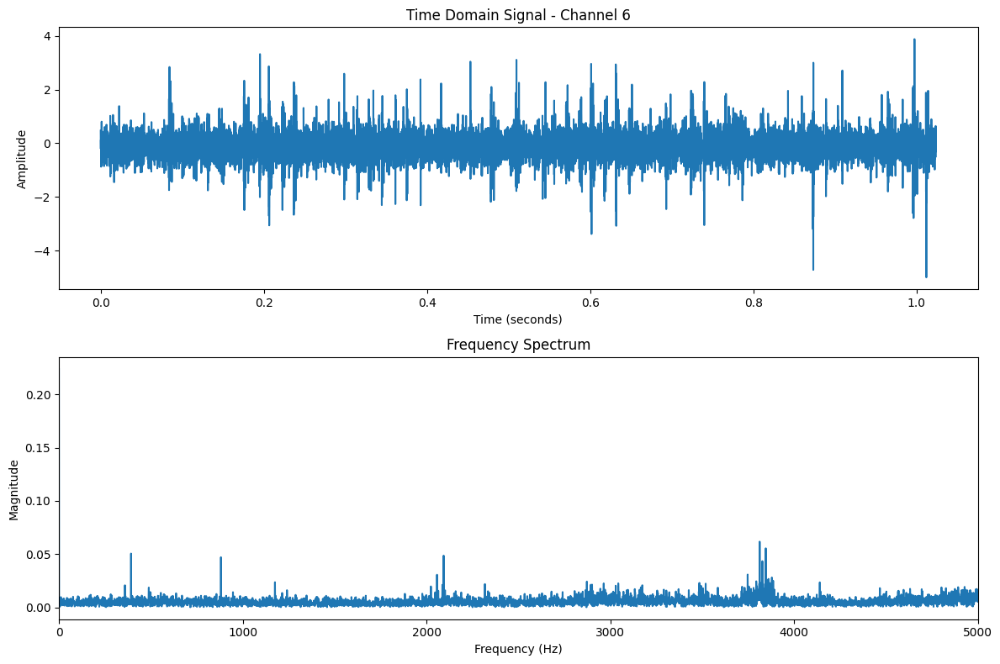

In [8]:
def analyze_bearing_frequencies(data_path, bearing_num, is_set1=True):
   """
   Analyze bearing frequencies accounting for:
   - Set 1: Two channels per bearing 
   - Sets 2&3: One channel per bearing
   - Different failure detection points for bearing 4 vs others
   """
   files = sorted(data_path.glob("*"))
   total_files = len(files)
   
   # Find failing file index based on bearing
   if bearing_num == 4 and is_set1:
       failing_idx = int(total_files * 0.81)  # Roller failure point
   else:
       # Get maximum amplitude file from last 10%
       start_idx = int(total_files * 0.9)
       max_amp = 0
       failing_idx = start_idx
       
       for i in range(start_idx, total_files):
           data = load_bearing_file(files[i])
           amp = np.max(np.abs(data))
           if amp > max_amp:
               max_amp = amp
               failing_idx = i

   # Load data
   healthy_data = load_bearing_file(files[0])
   failing_data = load_bearing_file(files[failing_idx])
   
   # Set channels based on dataset
   if is_set1:
       channels = [2*bearing_num-2, 2*bearing_num-1]  # Two channels per bearing
   else:
       channels = [bearing_num-1]  # One channel per bearing
       
   # Plot analysis
   fig, axes = plt.subplots(len(channels), 2, figsize=(15, 5*len(channels)))
   if len(channels) == 1:
       axes = axes.reshape(1, -1)
       
   for idx, channel in enumerate(channels):
       # Get frequency data
       freq_h, mag_h = analyze_frequency_components(healthy_data, channel)
       freq_f, mag_f = analyze_frequency_components(failing_data, channel)
       
       # Plot frequency comparison
       axes[idx, 0].plot(freq_h, mag_h, label='Healthy')
       axes[idx, 0].plot(freq_f, mag_f, label='Failing')
       axes[idx, 0].set_title(f'Channel {channel+1} Comparison')
       axes[idx, 0].legend()
       
       # Plot difference
       axes[idx, 1].plot(freq_h, mag_f - mag_h)
       axes[idx, 1].set_title(f'Channel {channel+1} Difference')
   
   plt.tight_layout()
   print(f"Analyzing file {failing_idx} of {total_files} for failing state")
   return freq_h, mag_h, freq_f, mag_f

# Test Set 1 Bearing 3 (inner race failure)
analyze_bearing_frequencies(data_path_1, 3, is_set1=True)

=== Set 1 Analysis ===
Analyzing file 2152 of 2156 for failing state
Analyzing file 1746 of 2156 for failing state

=== Set 2 Analysis ===
Analyzing file 975 of 984 for failing state

=== Set 3 Analysis ===
Analyzing file 6316 of 6324 for failing state


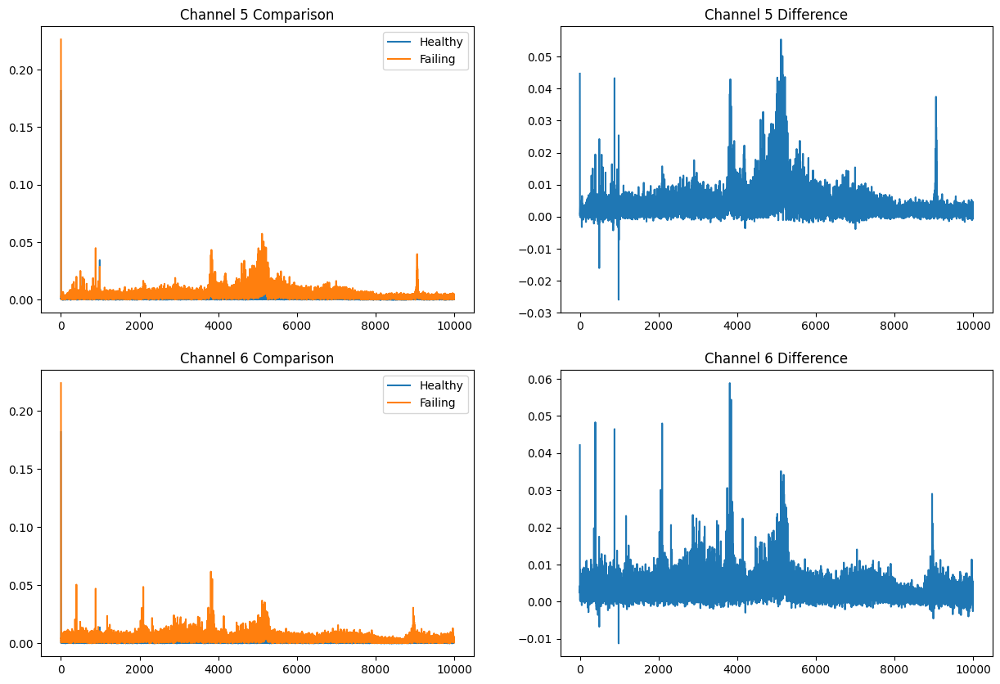

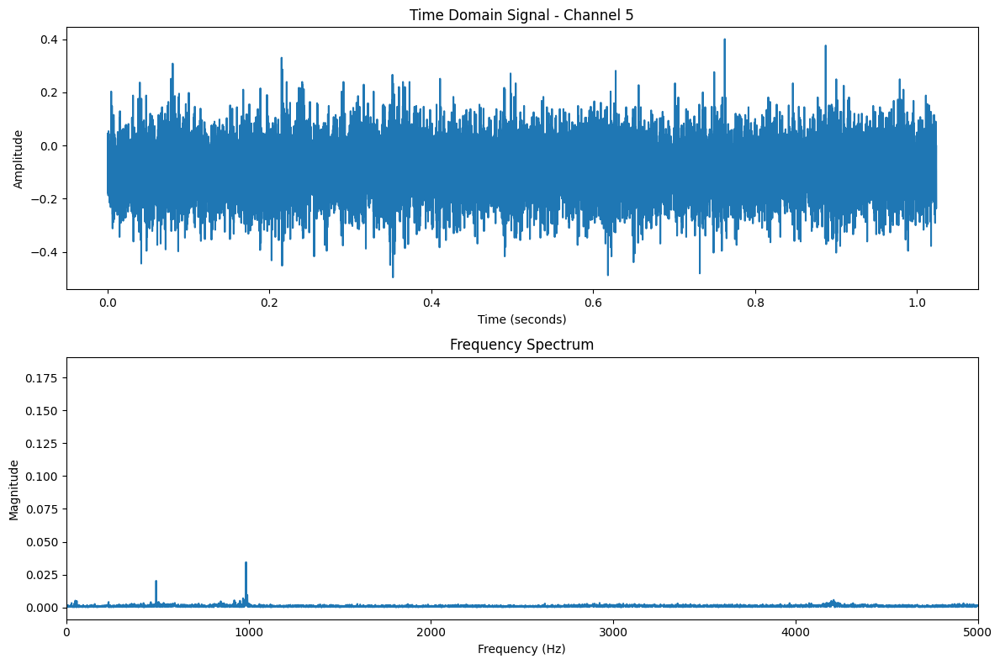

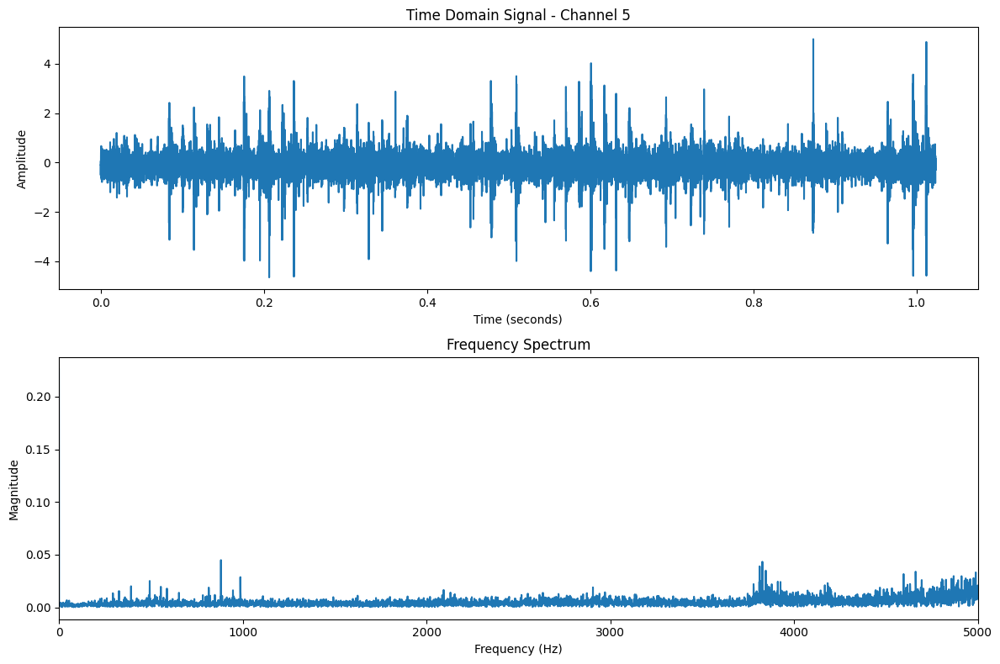

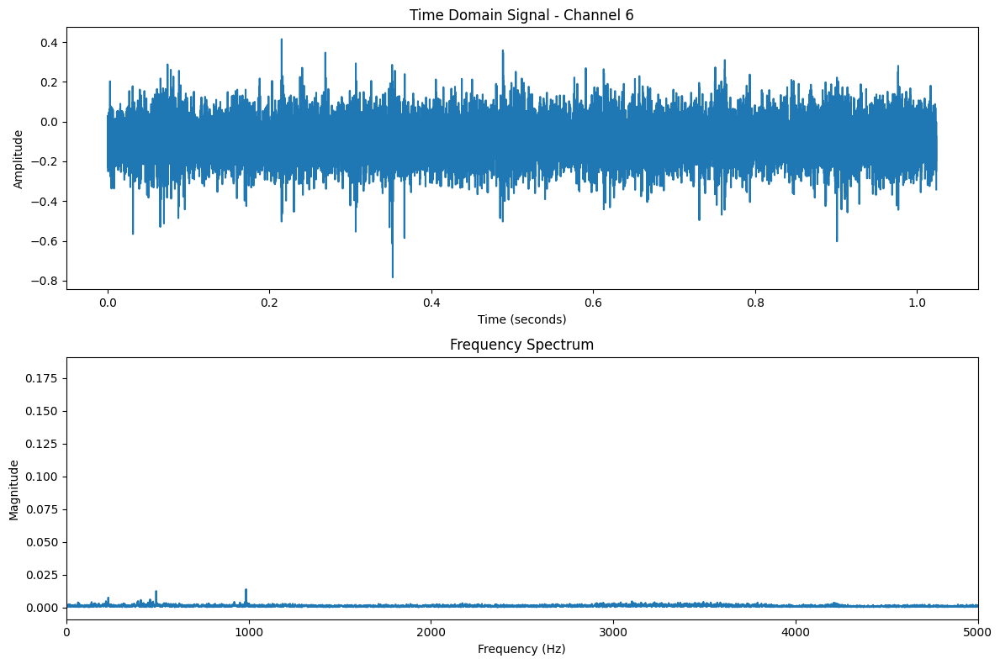

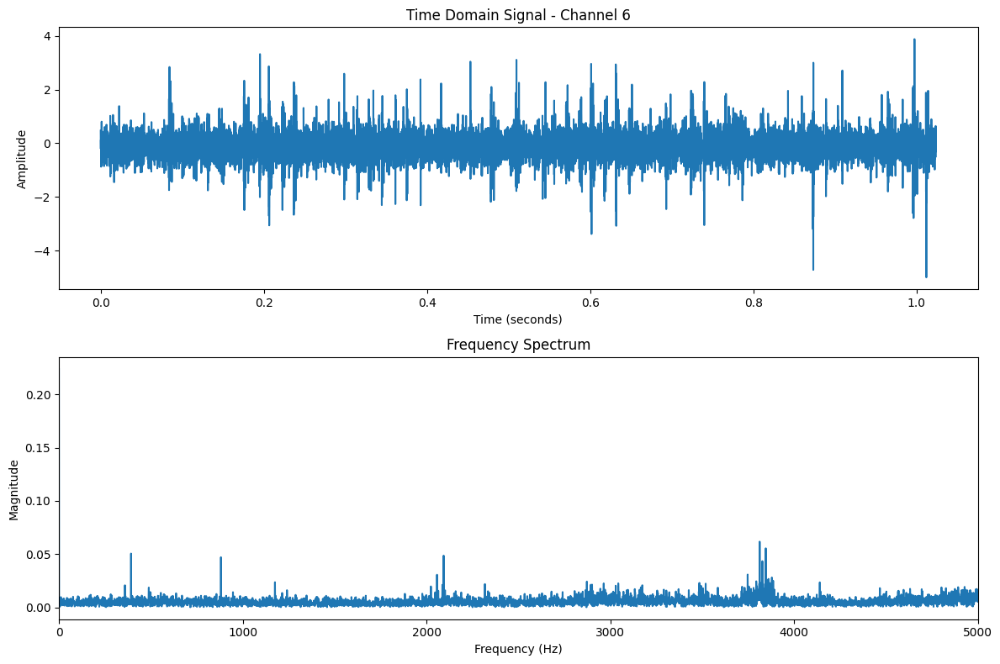

...

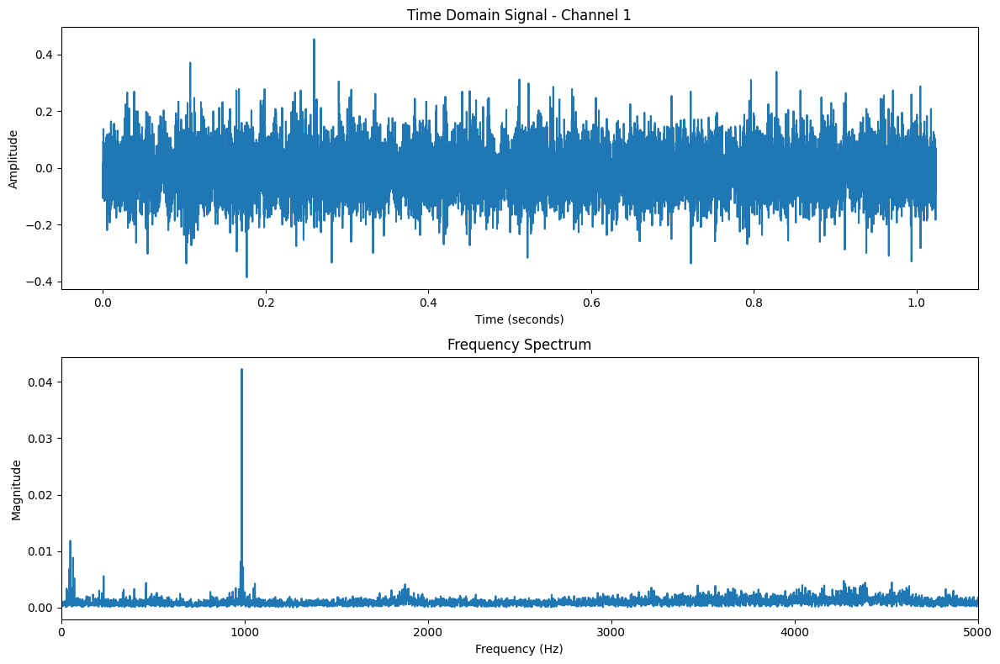

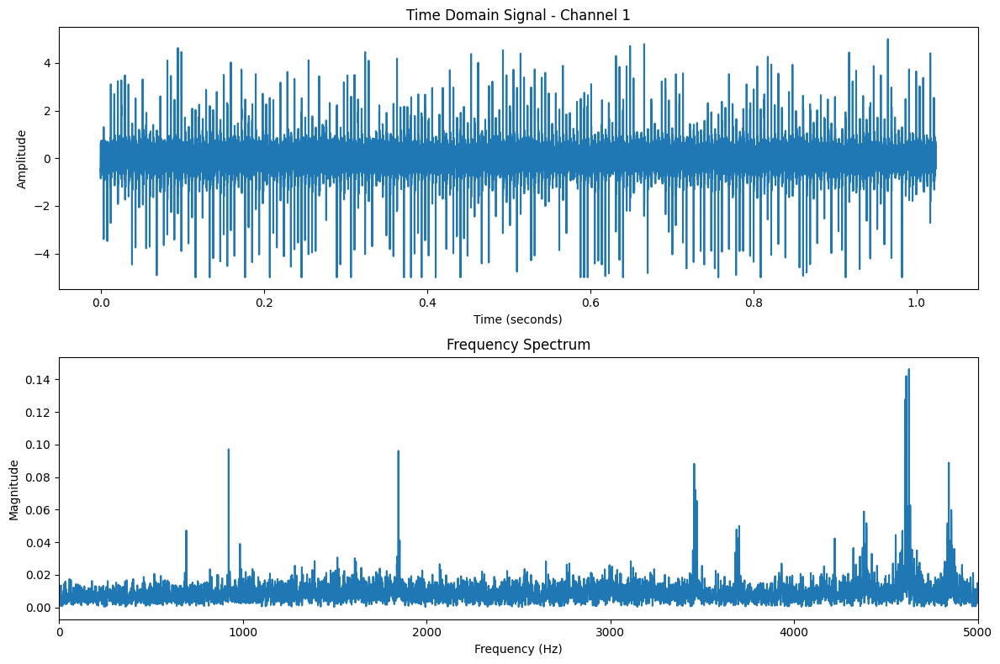

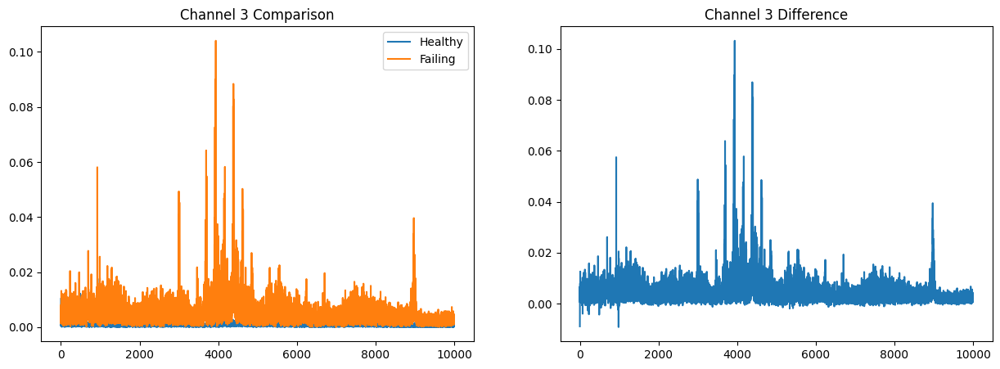

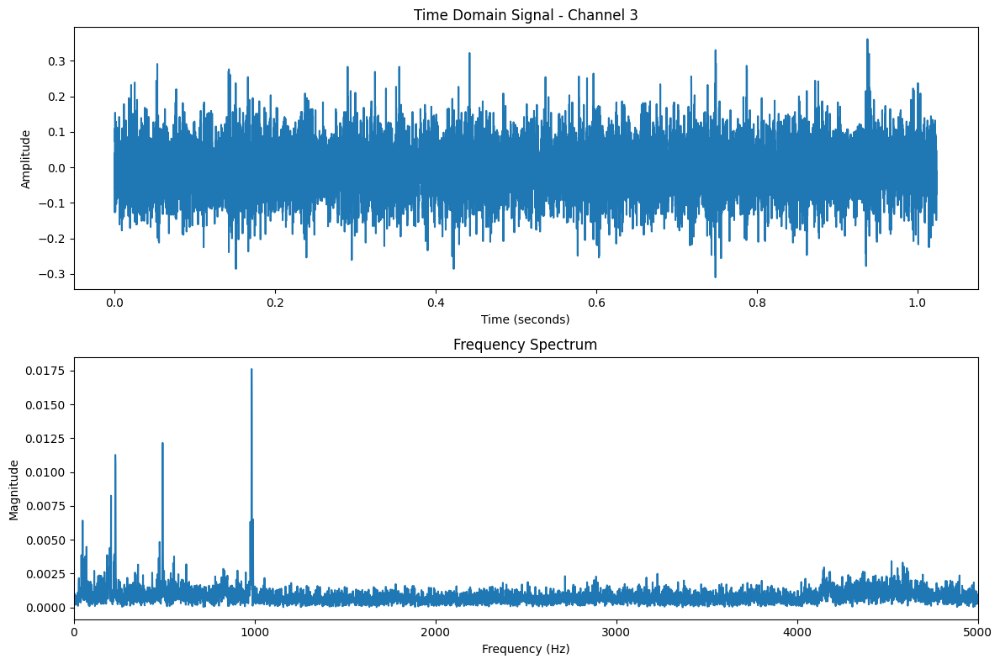

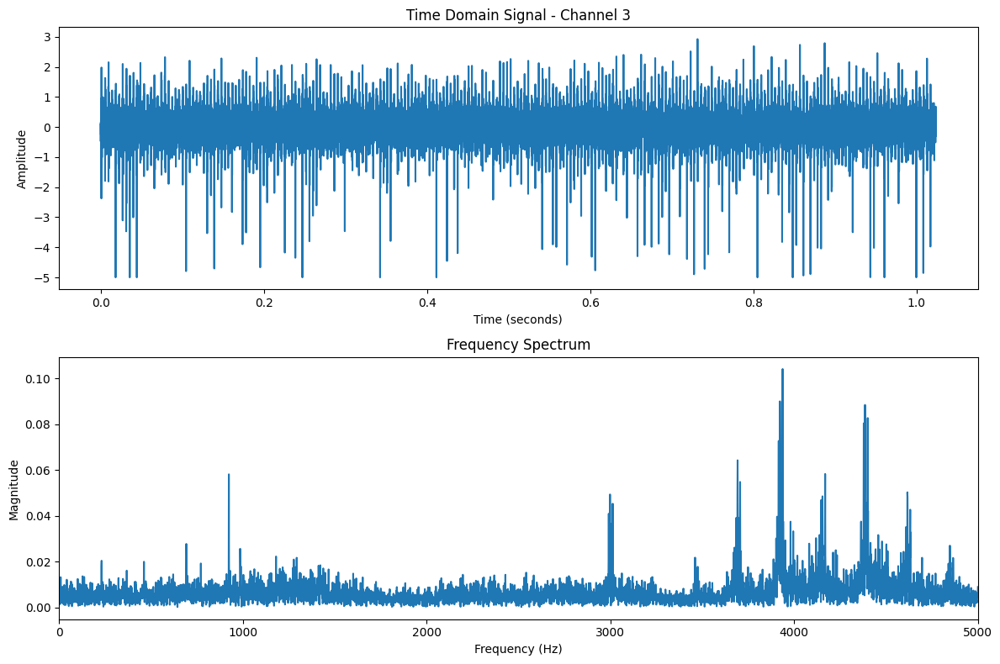

In [9]:
def analyze_all_bearings():
    # Set 1 (Bearings 3 and 4)
    print("=== Set 1 Analysis ===")
    analyze_bearing_frequencies(data_path_1, 3, is_set1=True)  # Inner race
    analyze_bearing_frequencies(data_path_1, 4, is_set1=True)  # Roller
    
    # Set 2 (Bearing 1)
    print("\n=== Set 2 Analysis ===")
    analyze_bearing_frequencies(data_path_2, 1, is_set1=False)  # Outer race
    
    # Set 3 (Bearing 3)
    print("\n=== Set 3 Analysis ===")
    analyze_bearing_frequencies(data_path_3, 3, is_set1=False)  # Outer race

analyze_all_bearings()

=== Set 1 Analysis ===
Analyzing file 2152 of 2156 for failing state (99.8%)
Analyzing file 1752 of 2156 for failing state (81.3%)

=== Set 2 Analysis ===
Analyzing file 975 of 984 for failing state (99.1%)

=== Set 3 Analysis ===
Analyzing file 6316 of 6324 for failing state (99.9%)


(array([0.00000000e+00, 9.76562500e-01, 1.95312500e+00, ...,
        9.99707031e+03, 9.99804688e+03, 9.99902344e+03]),
 array([0.0102959 , 0.0004989 , 0.00114238, ..., 0.00035544, 0.00044008,
        0.00031514]),
 array([0.00000000e+00, 9.76562500e-01, 1.95312500e+00, ...,
        9.99707031e+03, 9.99804688e+03, 9.99902344e+03]),
 array([0.00135742, 0.0052555 , 0.00784038, ..., 0.00147255, 0.00425399,
        0.00262371]))

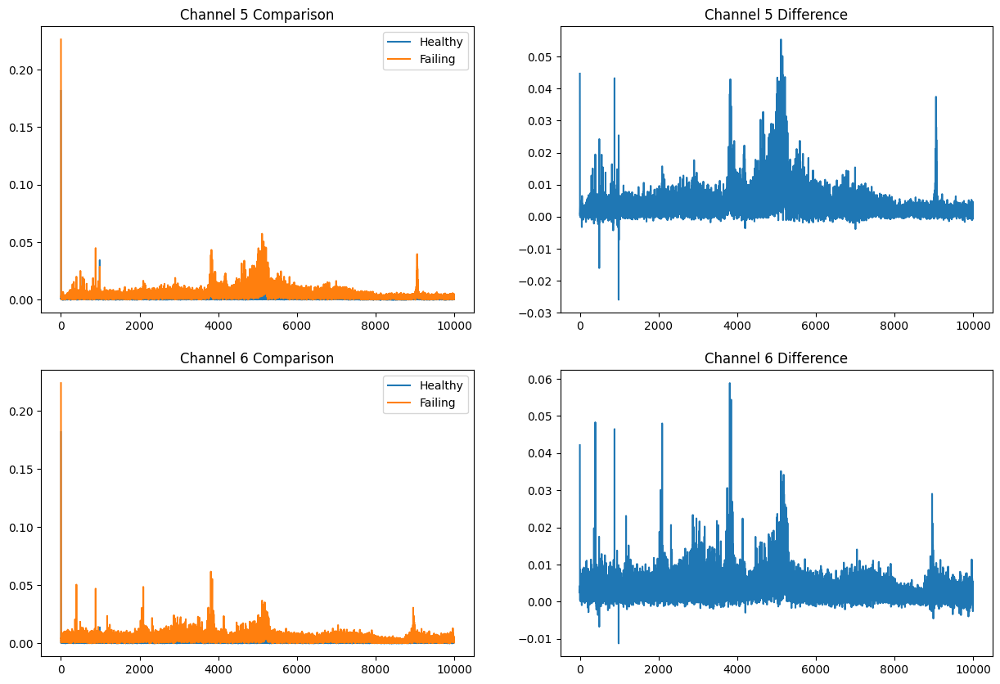

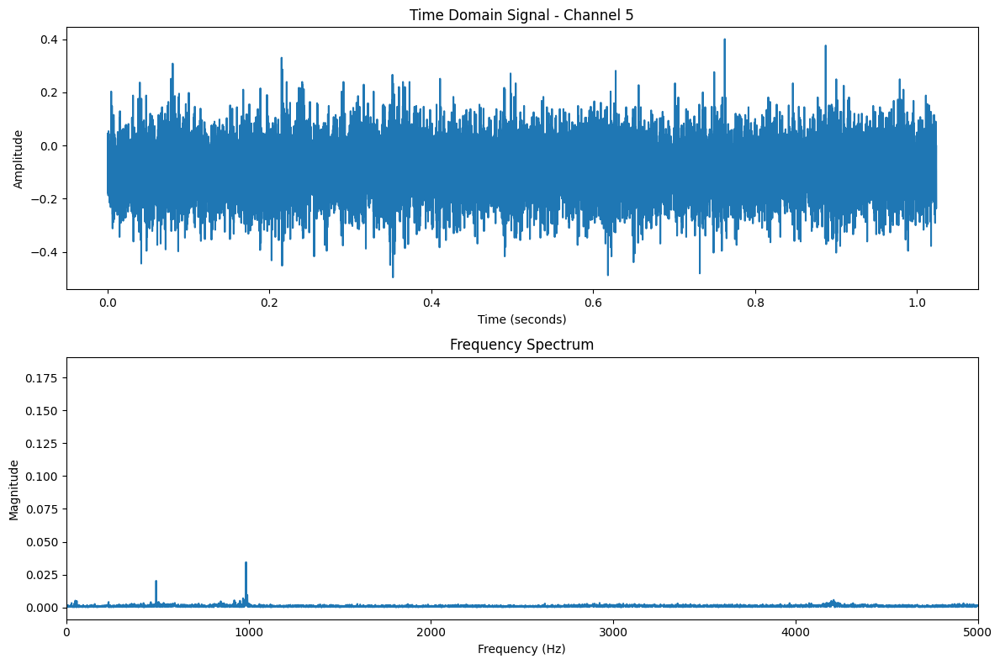

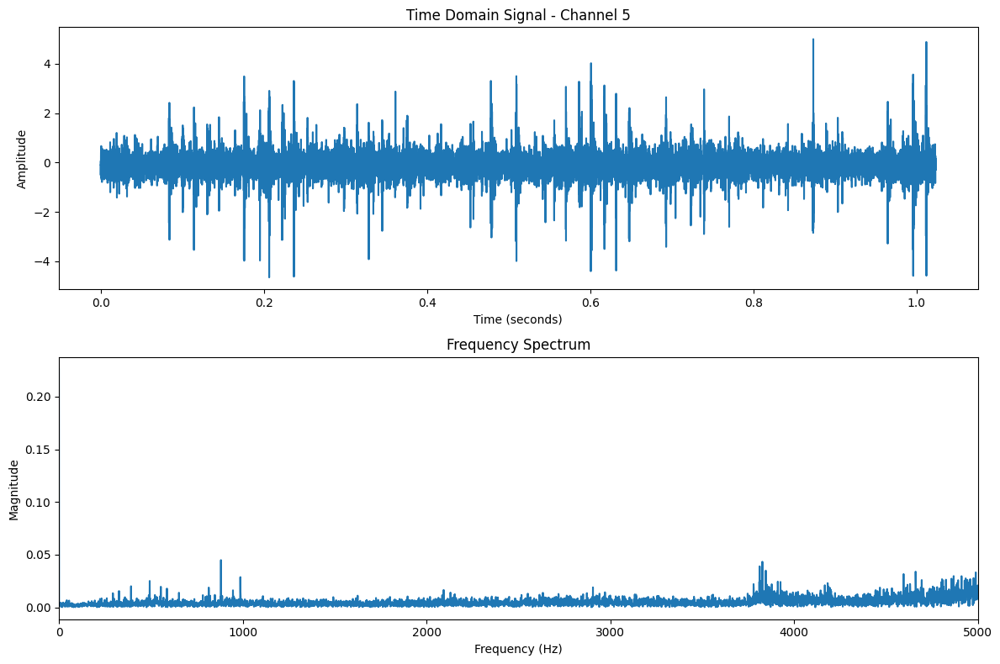

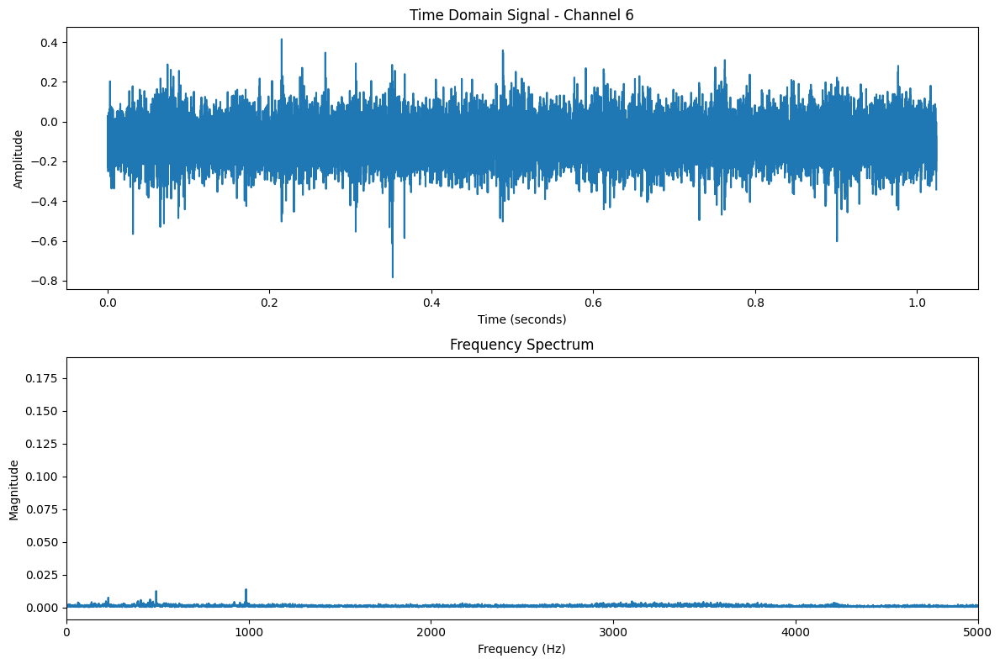

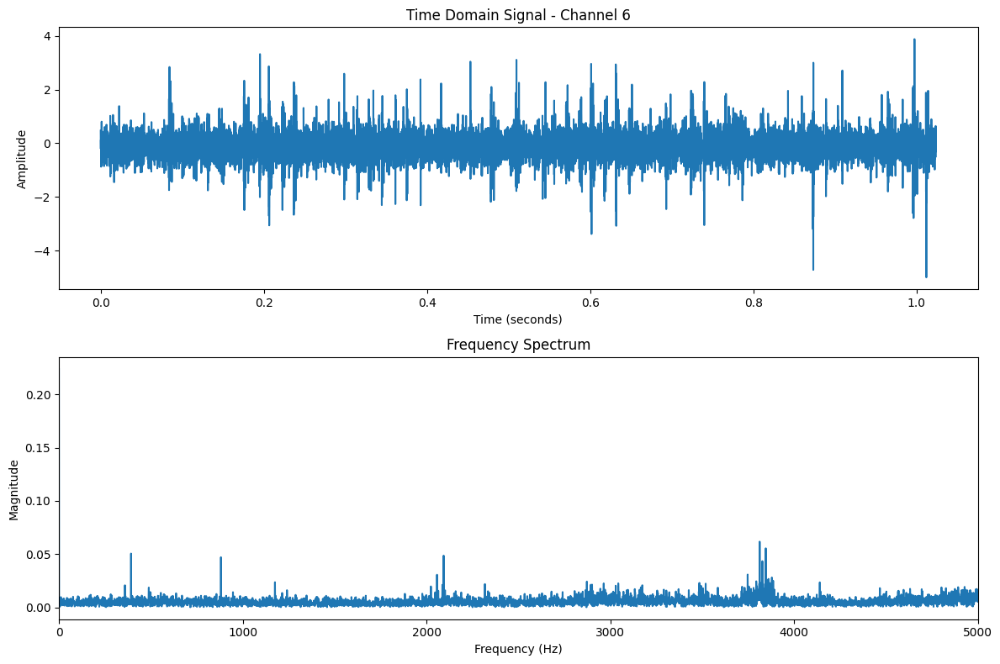

...

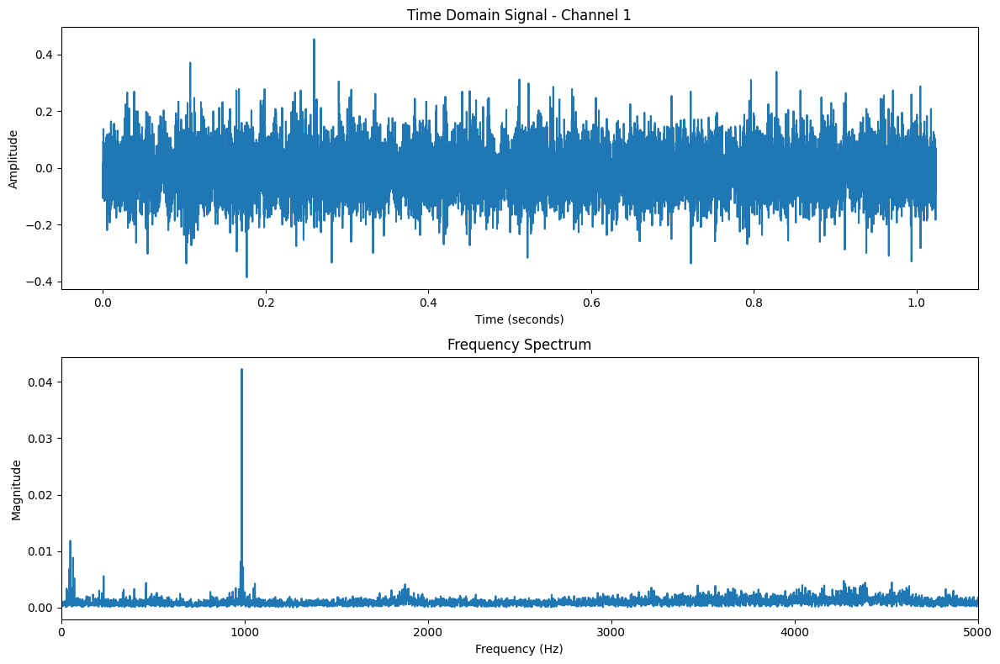

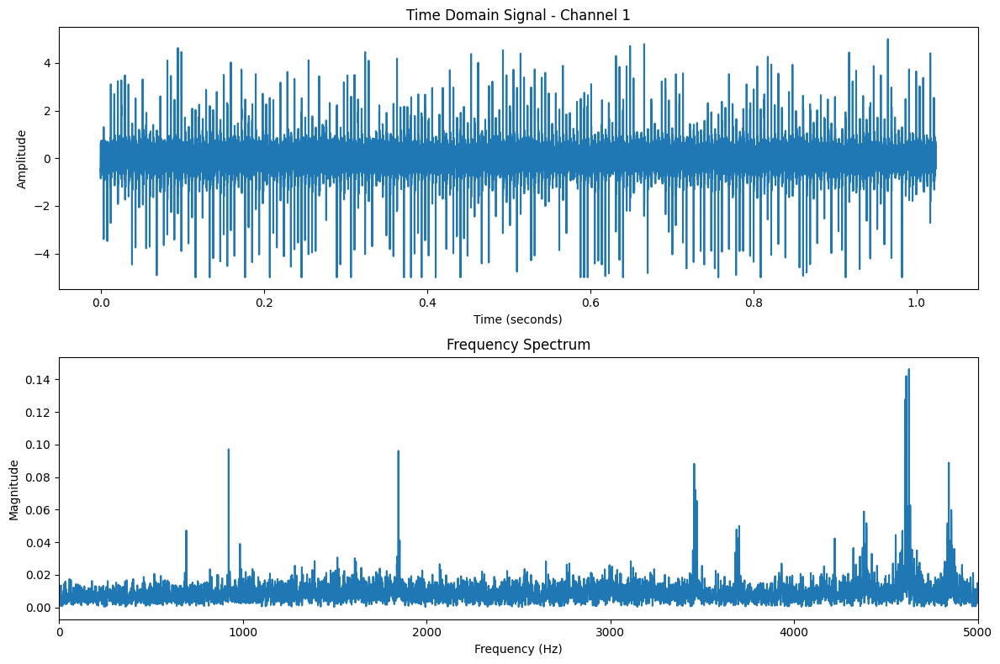

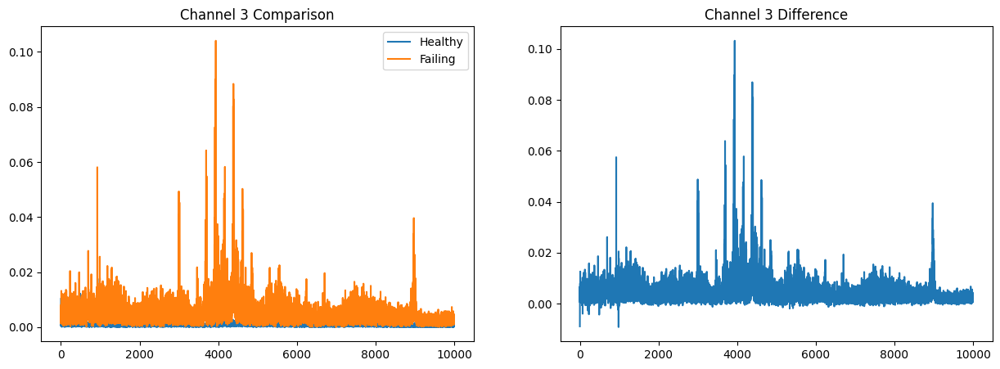

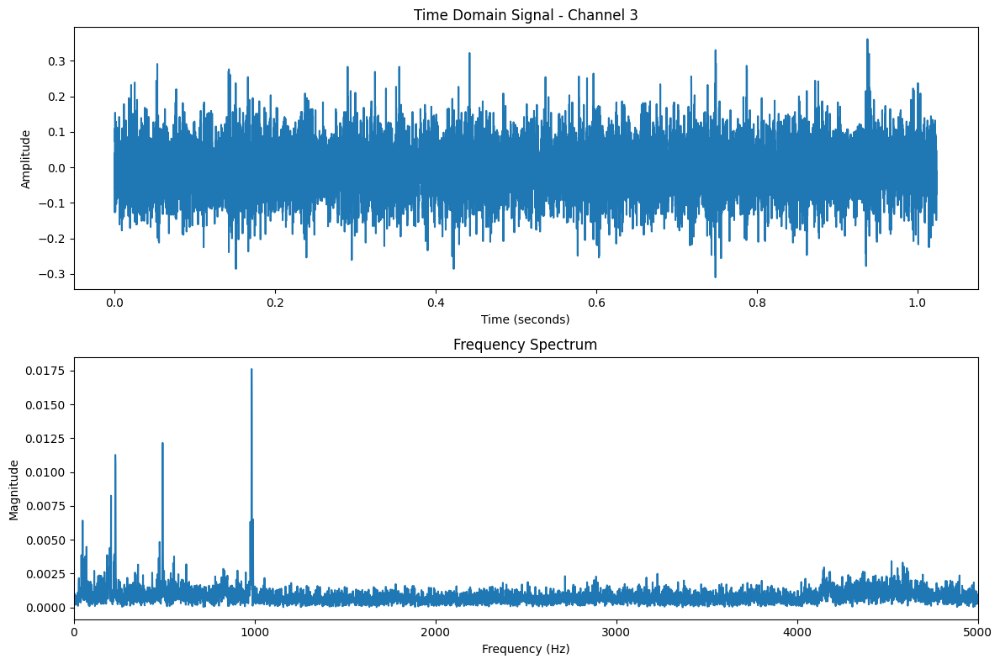

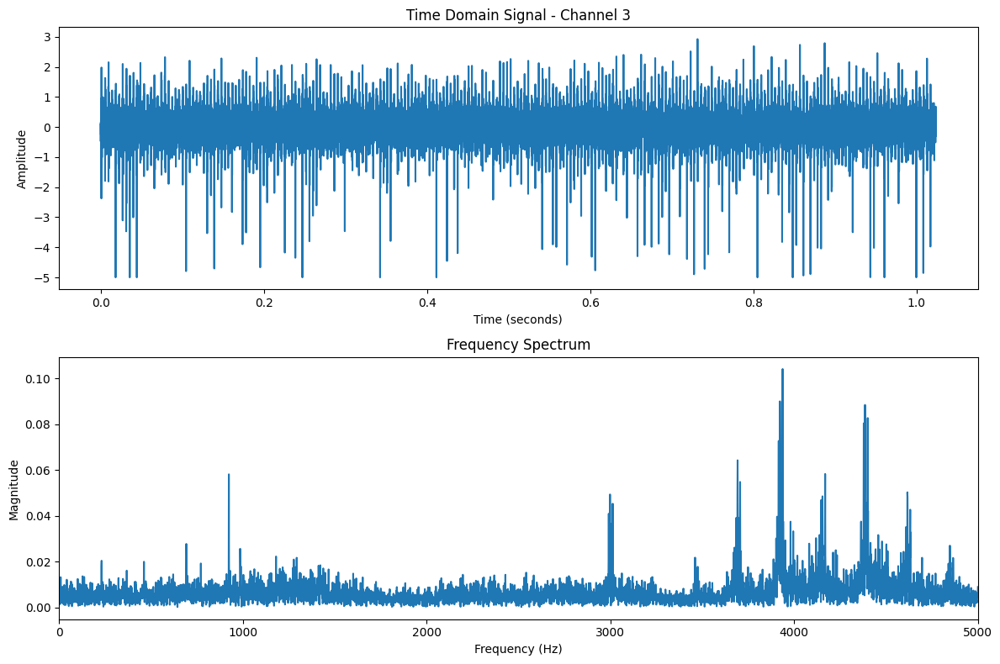

In [10]:
def analyze_bearing_frequencies(data_path, bearing_num, is_set1=True):
    """
    Analyze bearing frequencies accounting for:
    - Set 1: Two channels per bearing 
    - Sets 2&3: One channel per bearing
    - Different failure detection points for bearing 4 vs others
    """
    files = sorted(data_path.glob("*"))
    total_files = len(files)
    
    # Set channels based on dataset
    if is_set1:
        channels = [2*bearing_num-2, 2*bearing_num-1]  # Two channels per bearing
    else:
        channels = [bearing_num-1]  # One channel per bearing
    
    # Find failing file index based on bearing
    if bearing_num == 4 and is_set1:
        # Find maximum frequency activity across both channels
        max_amp = 0
        failing_idx = 0
        
        for i in range(total_files):
            data = load_bearing_file(files[i])
            # Calculate total frequency energy for both channels
            for channel in channels:
                freq_data = fft(data[:, channel])
                energy = np.sum(np.abs(freq_data))
                if energy > max_amp:
                    max_amp = energy
                    failing_idx = i
    else:
        # Get maximum amplitude file from last 10%
        start_idx = int(total_files * 0.9)
        max_amp = 0
        failing_idx = start_idx
        
        for i in range(start_idx, total_files):
            data = load_bearing_file(files[i])
            amp = np.max(np.abs(data))
            if amp > max_amp:
                max_amp = amp
                failing_idx = i

    # Rest of the function remains the same
    healthy_data = load_bearing_file(files[0])
    failing_data = load_bearing_file(files[failing_idx])
    
    # Plot analysis
    fig, axes = plt.subplots(len(channels), 2, figsize=(15, 5*len(channels)))
    if len(channels) == 1:
        axes = axes.reshape(1, -1)
        
    for idx, channel in enumerate(channels):
        freq_h, mag_h = analyze_frequency_components(healthy_data, channel)
        freq_f, mag_f = analyze_frequency_components(failing_data, channel)
        
        axes[idx, 0].plot(freq_h, mag_h, label='Healthy')
        axes[idx, 0].plot(freq_f, mag_f, label='Failing')
        axes[idx, 0].set_title(f'Channel {channel+1} Comparison')
        axes[idx, 0].legend()
        
        axes[idx, 1].plot(freq_h, mag_f - mag_h)
        axes[idx, 1].set_title(f'Channel {channel+1} Difference')
    
    plt.tight_layout()
    print(f"Analyzing file {failing_idx} of {total_files} for failing state ({(failing_idx/total_files)*100:.1f}%)")
    return freq_h, mag_h, freq_f, mag_f

# Let's analyze all bearings again with the fixed method
print("=== Set 1 Analysis ===")
analyze_bearing_frequencies(data_path_1, 3, is_set1=True)  # Inner race
analyze_bearing_frequencies(data_path_1, 4, is_set1=True)  # Roller

print("\n=== Set 2 Analysis ===")
analyze_bearing_frequencies(data_path_2, 1, is_set1=False)  # Outer race

print("\n=== Set 3 Analysis ===")
analyze_bearing_frequencies(data_path_3, 3, is_set1=False)  # Outer race

=== Set 1 Analysis ===

Analysis for Bearing 3:
Failure detected at file 2152/2156 (99.8%)

Channel 5 Changes:
Peak Magnitude Change: 24.6%
Mean Magnitude Change: 394.8%
Total Energy Change: 394.8%

Frequency Band Changes:
low_band_change: 195.1%
mid_band_change: 379.5%
high_band_change: 561.0%

Channel 6 Changes:
Peak Magnitude Change: 23.2%
Mean Magnitude Change: 335.8%
Total Energy Change: 335.8%

Frequency Band Changes:
low_band_change: 256.3%
mid_band_change: 385.9%
high_band_change: 486.2%

Analysis for Bearing 4:
Failure detected at file 1752/2156 (81.3%)

Channel 7 Changes:
Peak Magnitude Change: 23.8%
Mean Magnitude Change: 200.8%
Total Energy Change: 200.8%

Frequency Band Changes:
low_band_change: 101.2%
mid_band_change: 349.6%
high_band_change: 211.4%

Channel 8 Changes:
Peak Magnitude Change: 20.8%
Mean Magnitude Change: 168.9%
Total Energy Change: 168.9%

Frequency Band Changes:
low_band_change: 126.6%
mid_band_change: 304.7%
high_band_change: 196.8%

=== Set 2 Analysis =

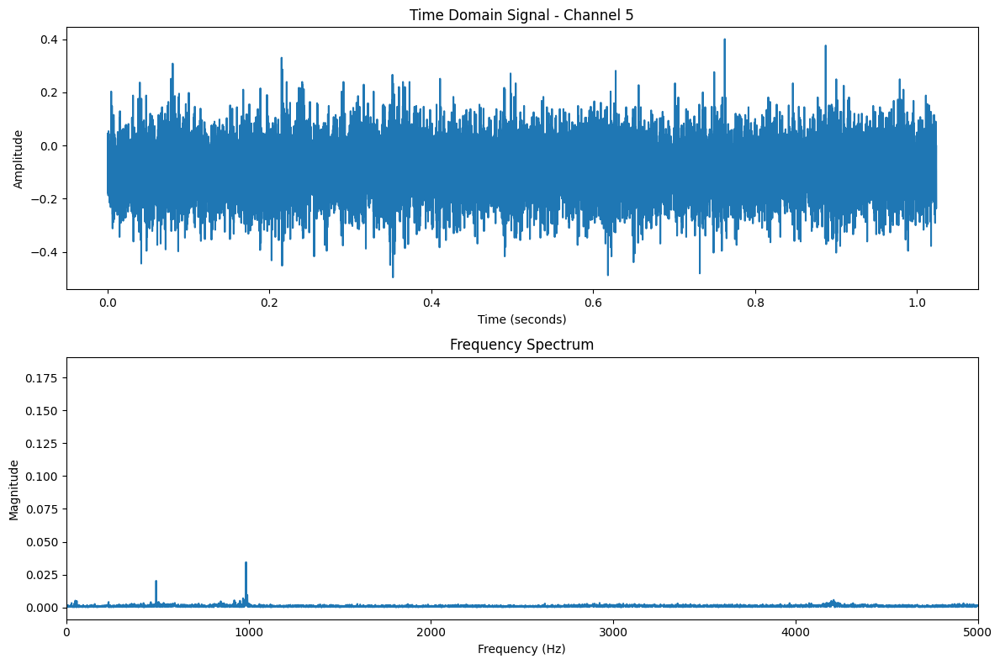

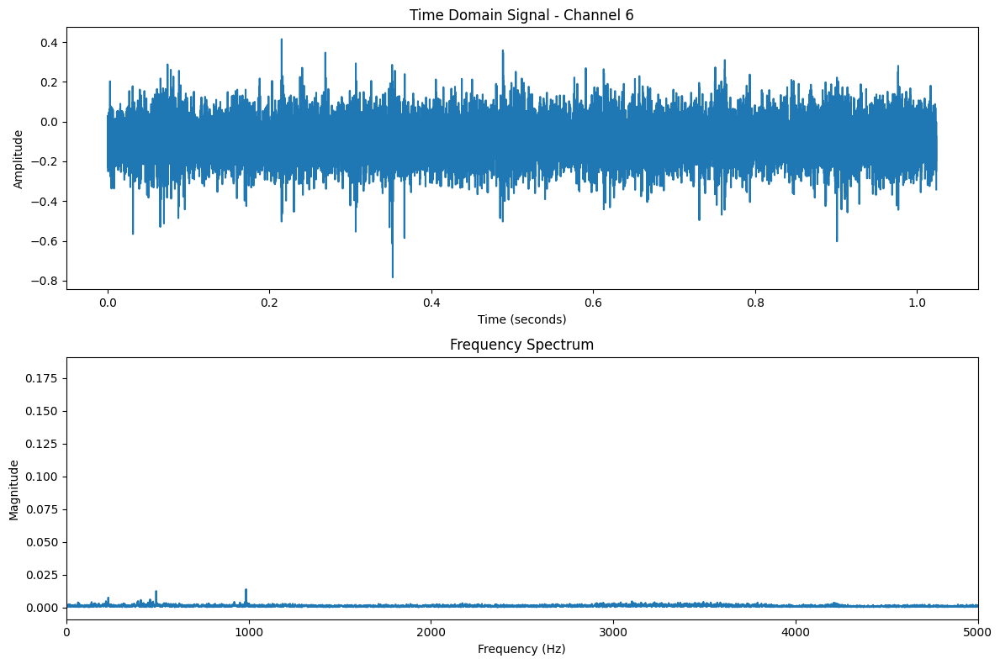

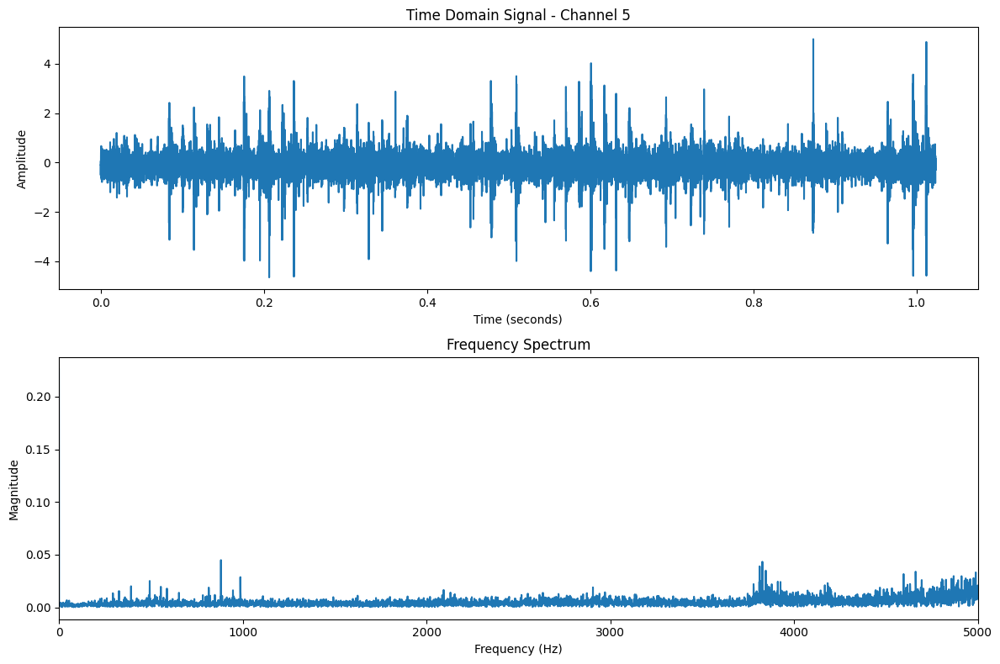

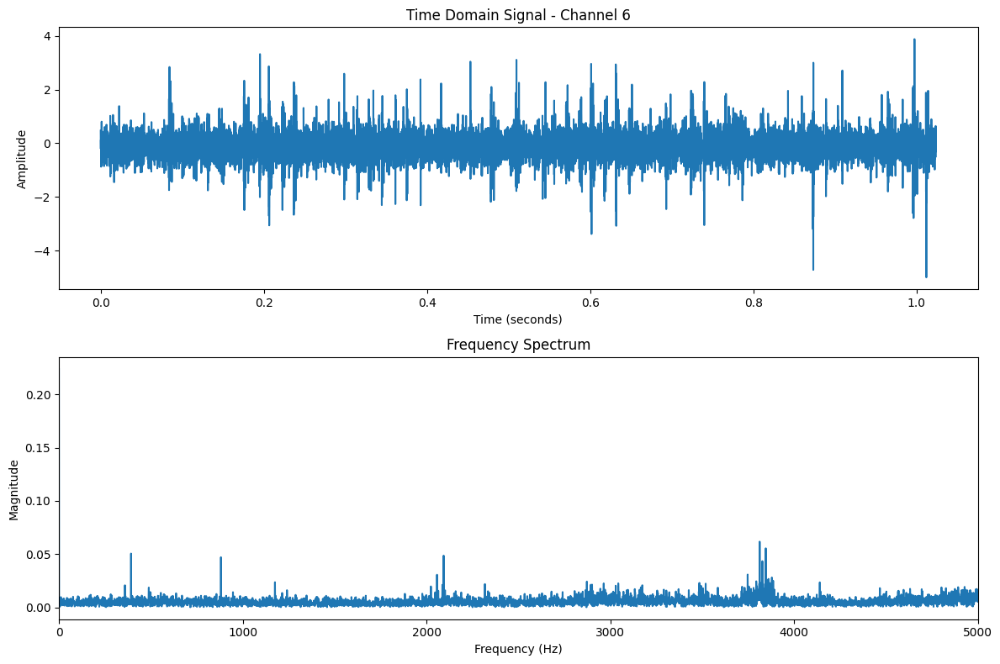

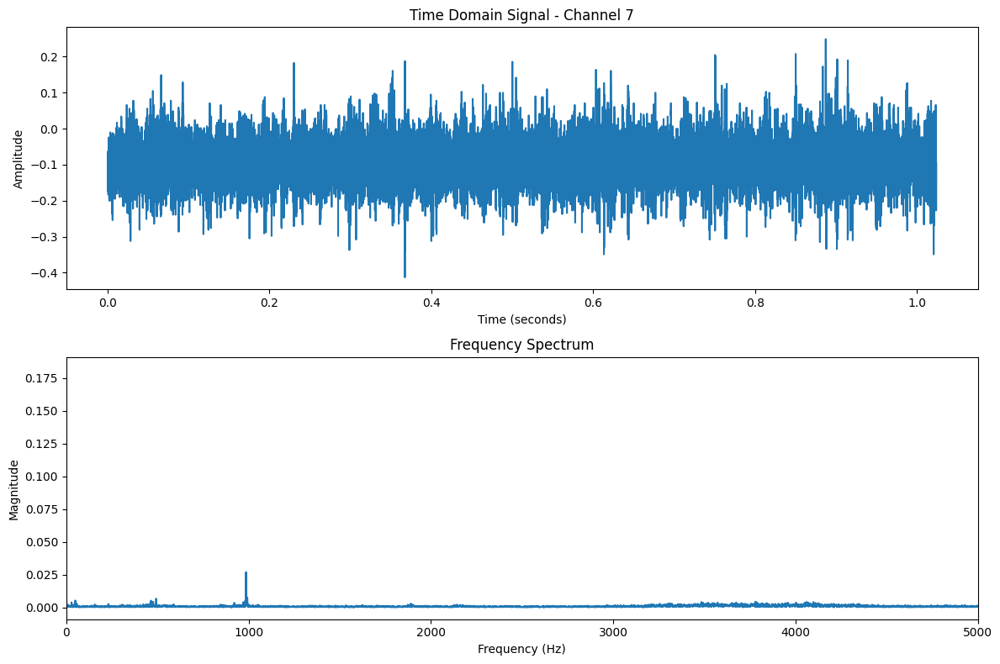

...

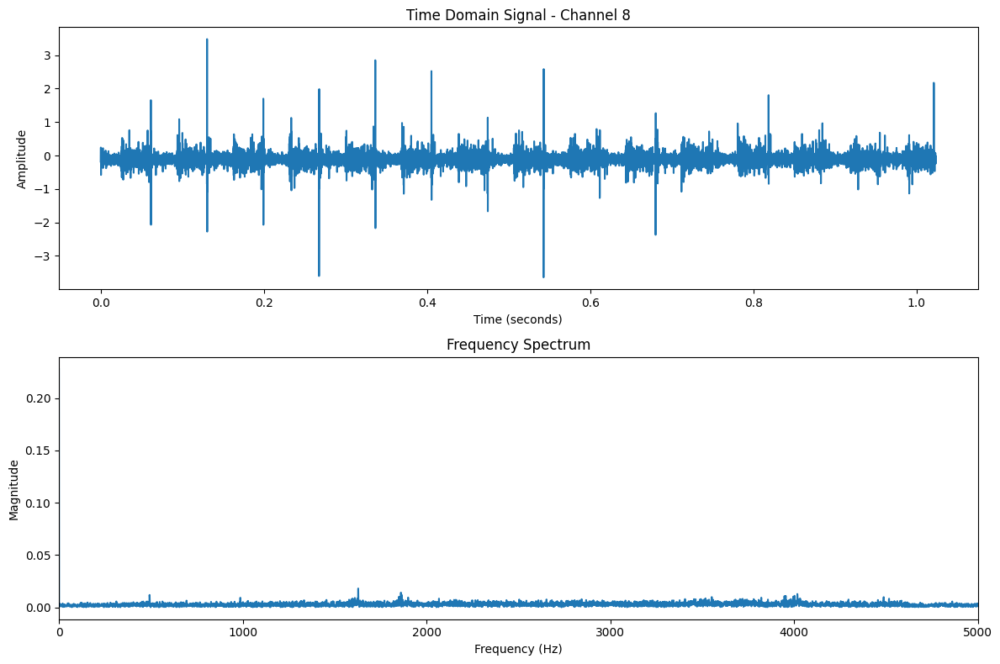

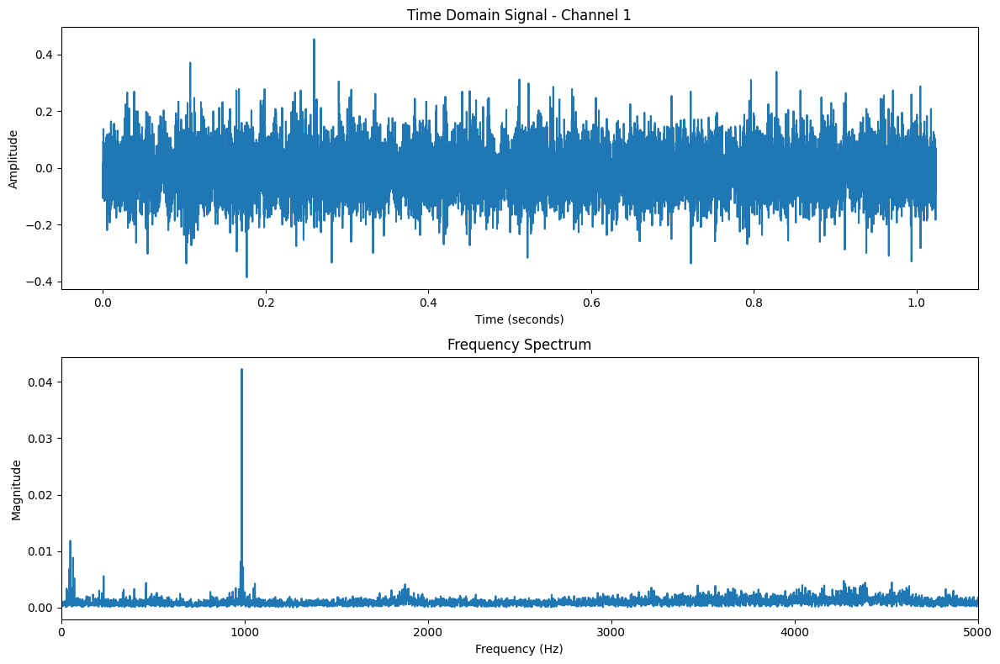

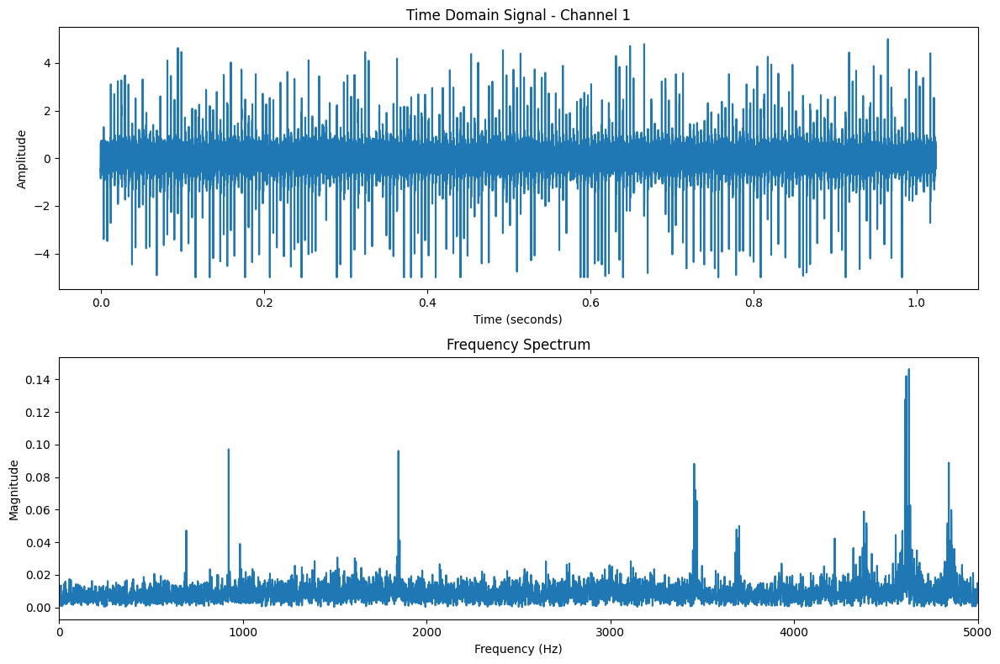

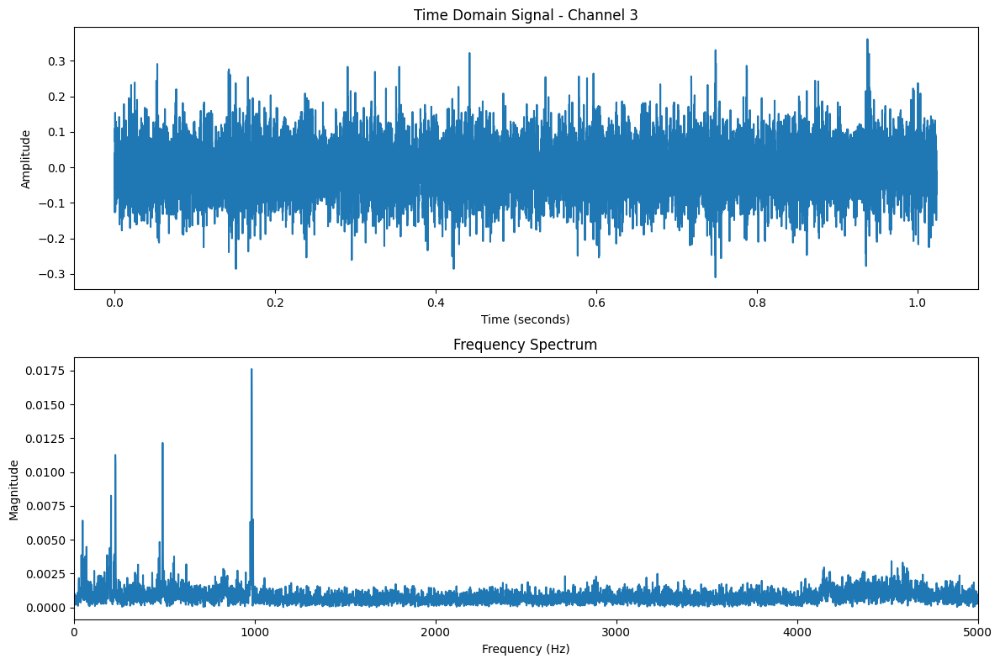

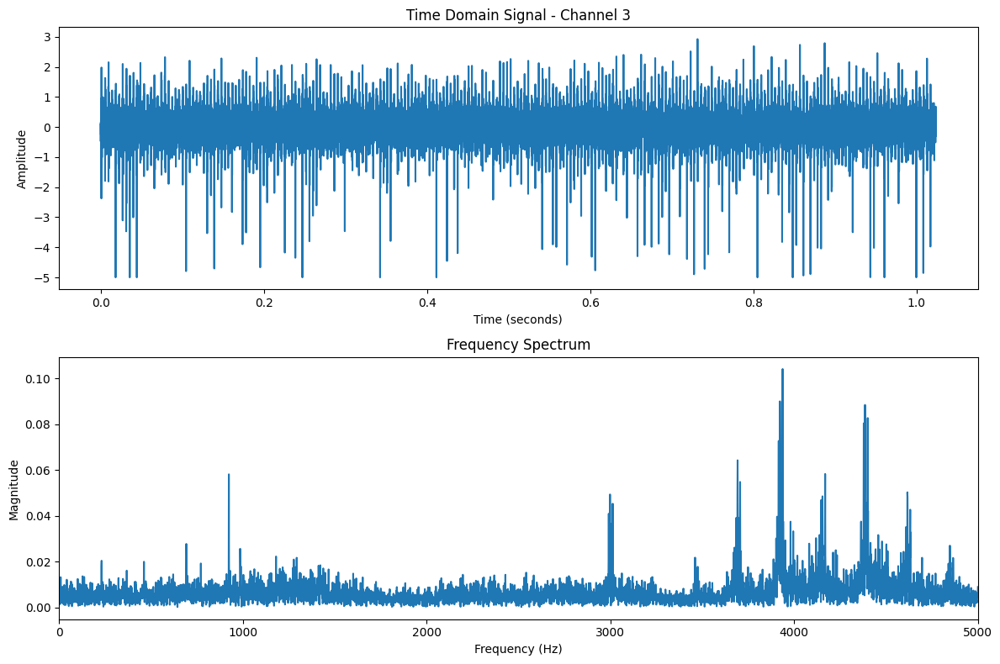

In [26]:
def analyze_bearing_frequencies(data_path, bearing_num, is_set1=True):
    """
    Analyze bearing frequencies with numerical metrics
    """
    # Load files
    files = sorted(data_path.glob("*"))
    total_files = len(files)
    
    # Set channels based on dataset
    if is_set1:
        channels = [2*bearing_num-2, 2*bearing_num-1]  # Two channels per bearing
    else:
        channels = [bearing_num-1]  # One channel per bearing
    
    # Find failing file index based on bearing
    if bearing_num == 4 and is_set1:
        # Find maximum frequency activity across both channels
        max_amp = 0
        failing_idx = 0
        
        for i in range(total_files):
            data = load_bearing_file(files[i])
            # Calculate total frequency energy for both channels
            for channel in channels:
                freq_data = fft(data[:, channel])
                energy = np.sum(np.abs(freq_data))
                if energy > max_amp:
                    max_amp = energy
                    failing_idx = i
    else:
        # Get maximum amplitude file from last 10%
        start_idx = int(total_files * 0.9)
        max_amp = 0
        failing_idx = start_idx
        
        for i in range(start_idx, total_files):
            data = load_bearing_file(files[i])
            amp = np.max(np.abs(data))
            if amp > max_amp:
                max_amp = amp
                failing_idx = i
    
    # Load healthy and failing data
    healthy_data = load_bearing_file(files[0])
    failing_data = load_bearing_file(files[failing_idx])
    
    results = {
        'bearing_number': bearing_num,
        'failure_point': None,
        'frequency_bands': {
            'low': (0, 1000),    # 0-1kHz
            'mid': (1000, 3000), # 1-3kHz
            'high': (3000, 5000) # 3-5kHz
        },
        'healthy': {},
        'failing': {},
        'changes': {}
    }
    
    # Calculate metrics for both states
    for state, data in [('healthy', healthy_data), ('failing', failing_data)]:
        for channel in channels:
            freq, mag = analyze_frequency_components(data, channel)
            
            # Calculate energy in different frequency bands
            band_energies = {}
            for band_name, (low, high) in results['frequency_bands'].items():
                mask = (freq >= low) & (freq < high)
                band_energies[band_name] = np.sum(mag[mask])
            
            # Calculate key metrics
            metrics = {
                f'channel_{channel+1}': {
                    'peak_frequency': freq[np.argmax(mag)],
                    'peak_magnitude': np.max(mag),
                    'mean_magnitude': np.mean(mag),
                    'std_magnitude': np.std(mag),
                    'total_energy': np.sum(mag),
                    'band_energies': band_energies
                }
            }
            
            results[state].update(metrics)
    
    # Calculate changes
    for channel in channels:
        ch_key = f'channel_{channel+1}'
        changes = {}
        
        # Calculate percentage changes for each metric
        healthy_metrics = results['healthy'][ch_key]
        failing_metrics = results['failing'][ch_key]
        
        for metric in ['peak_magnitude', 'mean_magnitude', 'total_energy']:
            healthy_val = healthy_metrics[metric]
            failing_val = failing_metrics[metric]
            pct_change = ((failing_val - healthy_val) / healthy_val) * 100
            changes[f'{metric}_change'] = pct_change
        
        # Calculate band energy changes
        band_changes = {}
        for band in results['frequency_bands'].keys():
            healthy_band = healthy_metrics['band_energies'][band]
            failing_band = failing_metrics['band_energies'][band]
            pct_change = ((failing_band - healthy_band) / healthy_band) * 100
            band_changes[f'{band}_band_change'] = pct_change
        
        changes['band_changes'] = band_changes
        results['changes'][ch_key] = changes
    
    # Add failure point info
    results['failure_point'] = {
        'file_index': failing_idx,
        'percentage': (failing_idx/total_files)*100
    }
    
    print(f"\nAnalysis for Bearing {bearing_num}:")
    print(f"Failure detected at file {failing_idx}/{total_files} ({(failing_idx/total_files)*100:.1f}%)")
    
    for channel in channels:
        ch_key = f'channel_{channel+1}'
        changes = results['changes'][ch_key]
        print(f"\nChannel {channel+1} Changes:")
        print(f"Peak Magnitude Change: {changes['peak_magnitude_change']:.1f}%")
        print(f"Mean Magnitude Change: {changes['mean_magnitude_change']:.1f}%")
        print(f"Total Energy Change: {changes['total_energy_change']:.1f}%")
        print("\nFrequency Band Changes:")
        for band, change in changes['band_changes'].items():
            print(f"{band}: {change:.1f}%")
    
    return results

# Run analysis
results = {}
print("=== Set 1 Analysis ===")
results['set1_b3'] = analyze_bearing_frequencies(data_path_1, 3, is_set1=True)  # Inner race
results['set1_b4'] = analyze_bearing_frequencies(data_path_1, 4, is_set1=True)  # Roller

print("\n=== Set 2 Analysis ===")
results['set2_b1'] = analyze_bearing_frequencies(data_path_2, 1, is_set1=False)  # Outer race

print("\n=== Set 3 Analysis ===")
results['set3_b3'] = analyze_bearing_frequencies(data_path_3, 3, is_set1=False)  # Outer race

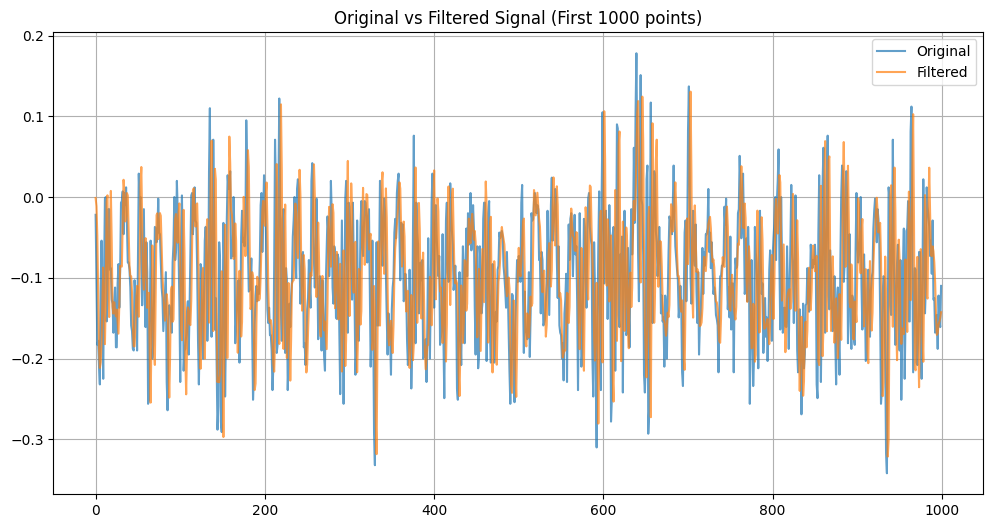

In [65]:
# Second cell - Modified filter function
def apply_basic_filter(data, channel, sampling_rate=20000):
    """
    Apply a basic noise reduction filter to bearing data.
    """
    try:
        # Get data from one channel
        channel_data = data[:, channel]
        
        # Create a basic filter
        order = 5 # Filter strength
        cutoff = 5000  # Cutoff frequency in Hz
        nyquist = sampling_rate / 2
        normalized_cutoff = cutoff / nyquist
        
        # Create and apply filter - using proper butterworth filter
        sos = signal.butter(order, normalized_cutoff, btype='low', output='sos')
        filtered_data = signal.sosfilt(sos, channel_data)
        
        return filtered_data
    
    except Exception as e:
        print(f"Error occurred: {str(e)}")
        print(f"Type of signal: {type(signal)}")
        return None

# Test cell - load and filter data
try:
    first_file = sorted(data_path_1.glob("*"))[0]
    test_data = np.loadtxt(first_file)
    
    # Apply filter to first channel and plot
    channel_to_test = 0
    raw_data = test_data[:, channel_to_test]
    filtered_data = apply_basic_filter(test_data, channel_to_test)
    
    if filtered_data is not None:
        plt.figure(figsize=(12, 6))
        plt.plot(raw_data[:1000], label='Original', alpha=0.7)
        plt.plot(filtered_data[:1000], label='Filtered', alpha=0.7)
        plt.title('Original vs Filtered Signal (First 1000 points)')
        plt.legend()
        plt.grid(True)
        plt.show()
    
except Exception as e:
    print(f"Error in test code: {str(e)}")

In [41]:
# Cell 1 (corrected) - Main frequency band analysis function
def analyze_frequency_bands(data, channel, sampling_rate=20000):
    """
    Analyze vibration data in three specific frequency bands.
    
    Think of this like having three different microscopes:
    - Low band (20-1kHz): Looking at basic rotation patterns
    - Mid band (1-3kHz): Looking for early warning signs
    - High band (3-5kHz): Looking for severe damage patterns
    """
    # Get data from one channel
    channel_data = data[:, channel]
    
    # Define our frequency bands (adjusted low band to start at 20 Hz instead of 0)
    bands = {
        'low': (20, 1000),    # 20Hz-1kHz (changed from 0 Hz)
        'mid': (1000, 3000),  # 1-3kHz
        'high': (3000, 5000)  # 3-5kHz
    }
    
    filtered_signals = {}
    
    # Process each band
    for band_name, (low_freq, high_freq) in bands.items():
        # Convert frequencies to normalized form
        nyquist = sampling_rate / 2
        low_normalized = low_freq / nyquist
        high_normalized = high_freq / nyquist
        
        # Create bandpass filter for this frequency range
        sos = signal.butter(4, [low_normalized, high_normalized], 
                          btype='bandpass', output='sos')
        
        # Apply filter
        filtered_signals[band_name] = signal.sosfilt(sos, channel_data)
    
    return filtered_signals

In [42]:
# Cell 2 - Plotting function
def plot_frequency_bands(original_data, filtered_bands, sample_points=1000):
    """
    Plot original signal and its three frequency bands.
    Shows:
    1. Original signal (full vibration)
    2. Low band (0-1kHz) - basic rotation patterns
    3. Mid band (1-3kHz) - early warning signs
    4. High band (3-5kHz) - severe damage patterns
    """
    plt.figure(figsize=(15, 10))
    
    # Plot original signal
    plt.subplot(4, 1, 1)
    plt.plot(original_data[:sample_points], label='Original', color='black')
    plt.title('Original Signal')
    plt.legend()
    plt.grid(True)
    
    # Plot each band
    colors = {'low': 'blue', 'mid': 'green', 'high': 'red'}
    titles = {
        'low': 'Low Band (0-1kHz): Base Rotation',
        'mid': 'Mid Band (1-3kHz): Early Warnings',
        'high': 'High Band (3-5kHz): Severe Damage'
    }
    
    for i, (band_name, signal_data) in enumerate(filtered_bands.items(), start=2):
        plt.subplot(4, 1, i)
        plt.plot(signal_data[:sample_points], label=f'{band_name} band', 
                color=colors[band_name])
        plt.title(titles[band_name])
        plt.legend()
        plt.grid(True)
    
    plt.tight_layout()
    plt.show()

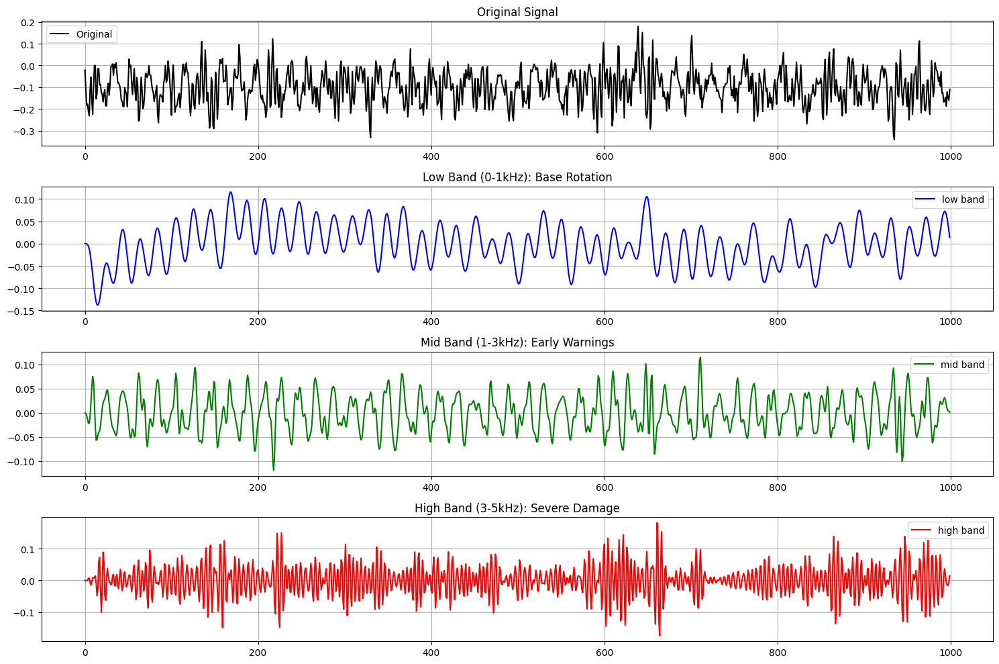

In [43]:
channel_to_test = 0
raw_data = first_data_1[:, channel_to_test]
filtered_bands = analyze_frequency_bands(first_data_1, channel_to_test)

# Plot the results
plot_frequency_bands(raw_data, filtered_bands)

In [46]:
def analyze_signal_characteristics(filtered_bands):
    """
    Analyze characteristics of each frequency band.
    Returns metrics that help identify bearing health.
    """
    analysis = {}
    
    for band_name, signal_data in filtered_bands.items():
        # Calculate key metrics for each band
        analysis[band_name] = {
            'RMS': np.sqrt(np.mean(signal_data**2)),  # Overall vibration energy
            'Peak': np.max(np.abs(signal_data)),      # Maximum amplitude
            'Crest': np.max(np.abs(signal_data)) / np.sqrt(np.mean(signal_data**2)),  # Peak/RMS ratio
            'Kurtosis': scipy.stats.kurtosis(signal_data)  # Measure of "spikiness"
        }
    
    return analysis

# Let's analyze both a healthy (first) and failing bearing
# First, let's get a healthy reading (first file)
first_file = sorted(data_path_1.glob("*"))[0]
healthy_data = np.loadtxt(first_file)

# Now get a failing bearing reading (one of the last files for bearing 3 which had inner race failure)
failing_files = sorted(data_path_1.glob("*"))
failing_data = np.loadtxt(failing_files[-10])  # Take one of the last files

# Analyze both signals (we'll look at bearing 3, which is channels 5&6)
channel = 5  # Channel 5 for bearing 3

# Get frequency bands for both
healthy_bands = analyze_frequency_bands(healthy_data, channel)
failing_bands = analyze_frequency_bands(failing_data, channel)

# Analyze characteristics
healthy_analysis = analyze_signal_characteristics(healthy_bands)
failing_analysis = analyze_signal_characteristics(failing_bands)

# Print comparison
print("\nHealthy Bearing Characteristics:")
for band, metrics in healthy_analysis.items():
    print(f"\n{band.upper()} BAND:")
    for metric, value in metrics.items():
        print(f"{metric}: {value:.4f}")

print("\nFailing Bearing Characteristics:")
for band, metrics in failing_analysis.items():
    print(f"\n{band.upper()} BAND:")
    for metric, value in metrics.items():
        print(f"{metric}: {value:.4f}")


Healthy Bearing Characteristics:

LOW BAND:
RMS: 0.0354
Peak: 0.1332
Crest: 3.7625
Kurtosis: -0.0799

MID BAND:
RMS: 0.0395
Peak: 0.1955
Crest: 4.9537
Kurtosis: 0.1253

HIGH BAND:
RMS: 0.0422
Peak: 0.2187
Crest: 5.1877
Kurtosis: 0.1941

Failing Bearing Characteristics:

LOW BAND:
RMS: 0.0855
Peak: 0.4007
Crest: 4.6860
Kurtosis: 1.1914

MID BAND:
RMS: 0.1265
Peak: 1.0711
Crest: 8.4682
Kurtosis: 2.3169

HIGH BAND:
RMS: 0.1447
Peak: 0.9961
Crest: 6.8824
Kurtosis: 2.1632


In [48]:
def clean_bearing_signal(data, channel, sampling_rate=20000):
    """
    Clean and filter bearing vibration data into relevant frequency bands.
    Each band gets noise reduction and frequency isolation.
    
    Returns: Dictionary with filtered signals for each band
    """
    # Get channel data
    channel_data = data[:, channel]
    
    # Define frequency bands important for bearing analysis
    bands = {
        'base_rotation': (20, 1000),     # Basic movement patterns
        'early_warning': (1000, 3000),   # Where problems often start
        'damage_zone': (3000, 5000)      # Where severe damage appears
    }
    
    cleaned_signals = {}
    
    # Process each frequency band
    for band_name, (low_freq, high_freq) in bands.items():
        # Convert to normalized frequencies
        nyquist = sampling_rate / 2
        low_normalized = low_freq / nyquist
        high_normalized = high_freq / nyquist
        
        # Create and apply bandpass filter with noise reduction
        sos = signal.butter(4, [low_normalized, high_normalized], 
                          btype='bandpass', output='sos')
        
        # Apply filter twice for better noise reduction
        filtered = signal.sosfilt(sos, channel_data)
        filtered = signal.sosfilt(sos, filtered)
        
        cleaned_signals[band_name] = filtered
    
    return cleaned_signals

In [69]:
# Test our filtering and analysis pipeline
def test_bearing_health(file_path, channel):
    """
    Test our filtering and analysis on a bearing signal.
    Shows if our filtering is working and meaningful.
    """
    # Load and clean data
    data = np.loadtxt(file_path)
    cleaned_signals = clean_bearing_signal(data, channel)
    
    # Analyze the cleaned signals
    signal_metrics = analyze_signal_characteristics(cleaned_signals)
    
    # Print key health indicators
    for band, metrics in signal_metrics.items():
        print(f"\n{band}:")
        print(f"RMS (vibration strength): {metrics['RMS']:.4f}")
        print(f"Peak (max amplitude): {metrics['Peak']:.4f}")
        print(f"Crest (impact factor): {metrics['Crest']:.4f}")
        print(f"Kurtosis (spikiness): {metrics['Kurtosis']:.4f}")

# Test with first file (healthy bearing)
first_file = sorted(data_path_1.glob("*"))[0]
print("Healthy Bearing Analysis:")
test_bearing_health(first_file, channel=0)

Healthy Bearing Analysis:

base_rotation:
RMS (vibration strength): 0.0322
Peak (max amplitude): 0.1275
Crest (impact factor): 3.9558
Kurtosis (spikiness): -0.3033

RMS (vibration strength): 0.0308
Peak (max amplitude): 0.1970
Crest (impact factor): 6.3851
Kurtosis (spikiness): 0.7132

damage_zone:
RMS (vibration strength): 0.0485
Peak (max amplitude): 0.4055
Crest (impact factor): 8.3636
Kurtosis (spikiness): 3.1528


In [70]:
def test_all_failure_types():
    """
    Test filtering on all known bearing failures with correct channel indexing:
    Set 1: - Bearing 3: Inner race failure (channels 5,6 = indices 4,5)
           - Bearing 4: Roller element failure (channels 7,8 = indices 6,7)
    Set 2: - Bearing 1: Outer race failure (channel 1 = index 0)
    Set 3: - Bearing 3: Outer race failure (channel 3 = index 2)
    """
    print("\n=== SET 1 ANALYSIS ===")
    files_1 = sorted(data_path_1.glob("*"))
    
    # Inner Race Failure (Bearing 3, both channels)
    print("\nBearing 3 - Inner Race Failure:")
    print("\nChannel 5 (index 4):")
    print("HEALTHY STATE:")
    test_bearing_health(files_1[0], channel=4)  # Changed from 5 to 4
    print("\nFAILING STATE:")
    test_bearing_health(files_1[-10], channel=4)
    
    print("\nChannel 6 (index 5):")
    print("HEALTHY STATE:")
    test_bearing_health(files_1[0], channel=5)  # Changed from 6 to 5
    print("\nFAILING STATE:")
    test_bearing_health(files_1[-10], channel=5)

    # Roller Element Failure (Bearing 4, both channels)
    print("\nBearing 4 - Roller Element Failure:")
    print("\nChannel 7 (index 6):")
    print("HEALTHY STATE:")
    test_bearing_health(files_1[0], channel=6)  # Changed from 7 to 6
    print("\nFAILING STATE:")
    test_bearing_health(files_1[int(len(files_1)*0.81)], channel=6)
    
    print("\nChannel 8 (index 7):")
    print("HEALTHY STATE:")
    test_bearing_health(files_1[0], channel=7)  # Changed from 8 to 7
    print("\nFAILING STATE:")
    test_bearing_health(files_1[int(len(files_1)*0.81)], channel=7)

    print("\n=== SET 2 ANALYSIS ===")
    files_2 = sorted(data_path_2.glob("*"))
    print("\nBearing 1 - Outer Race Failure:")
    print("HEALTHY STATE:")
    test_bearing_health(files_2[0], channel=0)  # Channel 1 = index 0
    print("\nFAILING STATE:")
    test_bearing_health(files_2[-10], channel=0)

    print("\n=== SET 3 ANALYSIS ===")
    files_3 = sorted(data_path_3.glob("*"))
    print("\nBearing 3 - Outer Race Failure:")
    print("HEALTHY STATE:")
    test_bearing_health(files_3[0], channel=2)  # Channel 3 = index 2
    print("\nFAILING STATE:")
    test_bearing_health(files_3[-10], channel=2)

# Run comprehensive test
test_all_failure_types()


=== SET 1 ANALYSIS ===

Bearing 3 - Inner Race Failure:

Channel 5 (index 4):
HEALTHY STATE:

base_rotation:
RMS (vibration strength): 0.0337
Peak (max amplitude): 0.1226
Crest (impact factor): 3.6406
Kurtosis (spikiness): -0.1286

RMS (vibration strength): 0.0314
Peak (max amplitude): 0.1479
Crest (impact factor): 4.7099
Kurtosis (spikiness): -0.0213

damage_zone:
RMS (vibration strength): 0.0373
Peak (max amplitude): 0.1626
Crest (impact factor): 4.3605
Kurtosis (spikiness): 0.0759

FAILING STATE:

base_rotation:
RMS (vibration strength): 0.0690
Peak (max amplitude): 0.3248
Crest (impact factor): 4.7036
Kurtosis (spikiness): 0.3795

RMS (vibration strength): 0.0869
Peak (max amplitude): 0.5628
Crest (impact factor): 6.4803
Kurtosis (spikiness): 2.2140

damage_zone:
RMS (vibration strength): 0.1228
Peak (max amplitude): 0.7178
Crest (impact factor): 5.8462
Kurtosis (spikiness): 1.5025

Channel 6 (index 5):
HEALTHY STATE:

base_rotation:
RMS (vibration strength): 0.0335
Peak (max ampl

In [57]:
def plot_filtered_comparison(data, channel, title, sample_points=1000):
    """
    Plot original signal vs all filtered bands
    """
    # Get filtered signals
    filtered_signals = clean_bearing_signal(data, channel)
    
    # Create subplot for each signal
    fig, axes = plt.subplots(4, 1, figsize=(15, 12))
    fig.suptitle(title, fontsize=16)
    
    # Plot original signal
    original_data = data[:sample_points, channel]
    axes[0].plot(original_data, 'k', label='Original')
    axes[0].set_title('Original Signal')
    axes[0].grid(True)
    axes[0].legend()
    
    # Plot each filtered band
    colors = {'base_rotation': 'b', 'early_warning': 'g', 'damage_zone': 'r'}
    titles = {
        'base_rotation': 'Base Rotation Band (20-1000 Hz)',
        'early_warning': 'Early Warning Band (1-3 kHz)',
        'damage_zone': 'Damage Zone Band (3-5 kHz)'
    }
    
    for i, (band_name, signal) in enumerate(filtered_signals.items(), start=1):
        axes[i].plot(signal[:sample_points], color=colors[band_name], label=band_name)
        axes[i].set_title(titles[band_name])
        axes[i].grid(True)
        axes[i].legend()
    
    plt.tight_layout()
    plt.show()

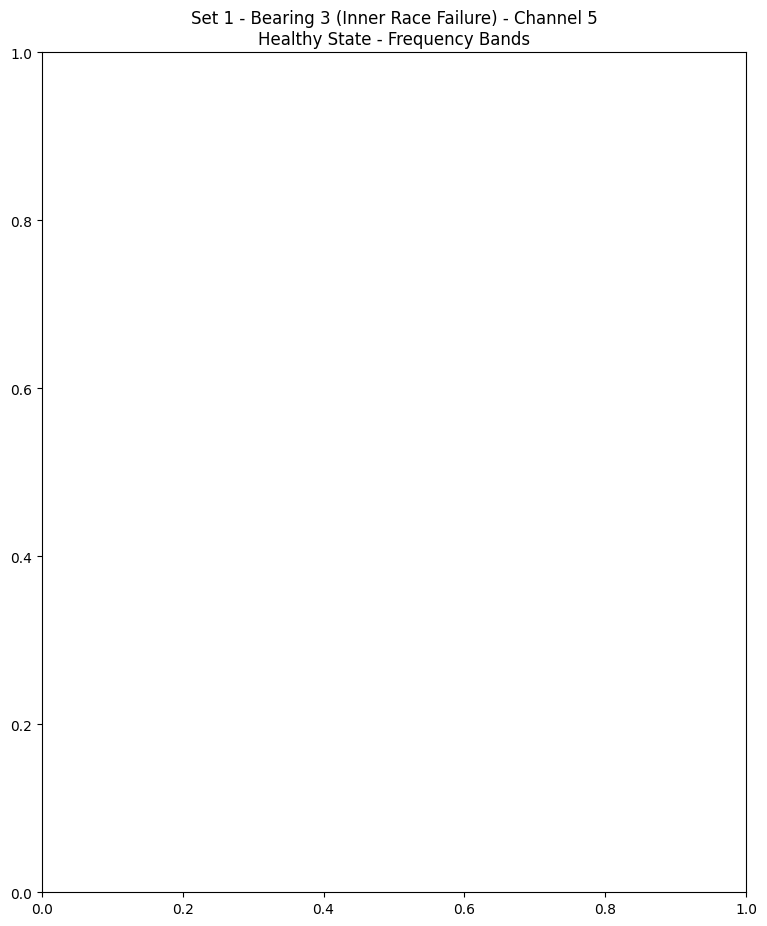

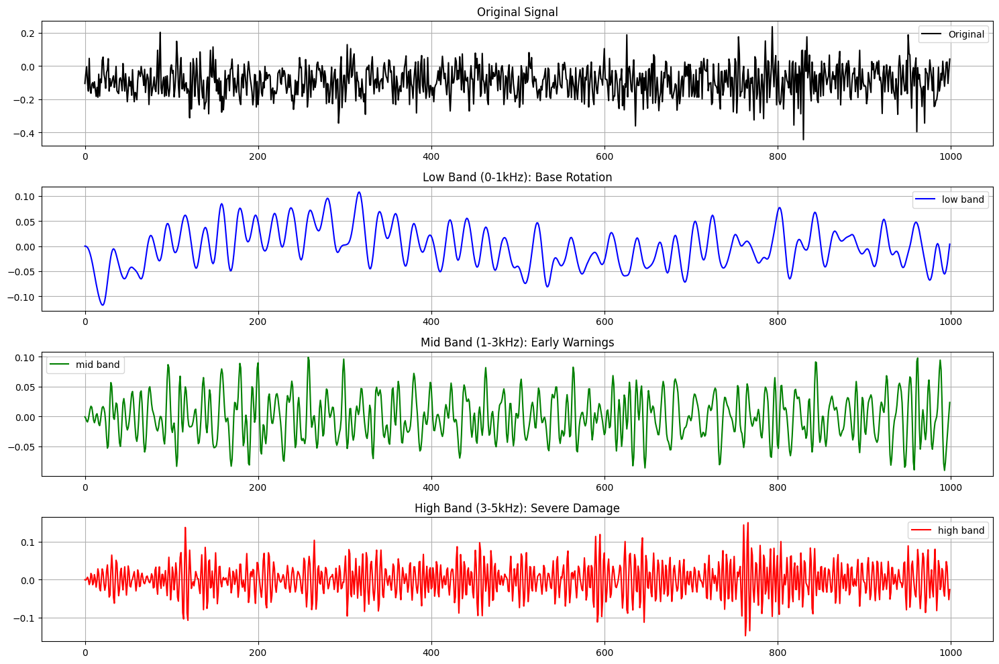

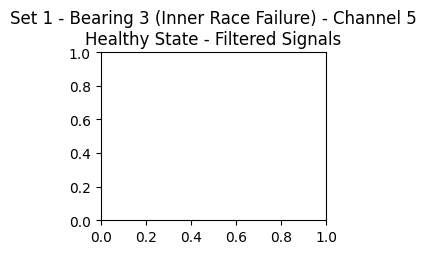

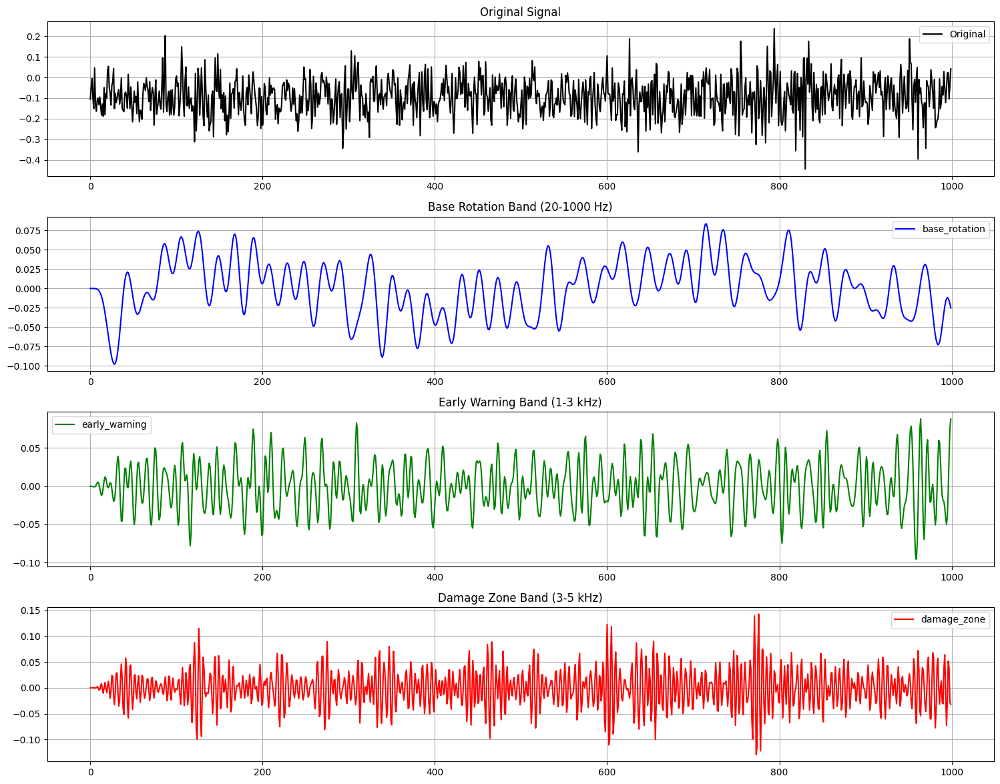

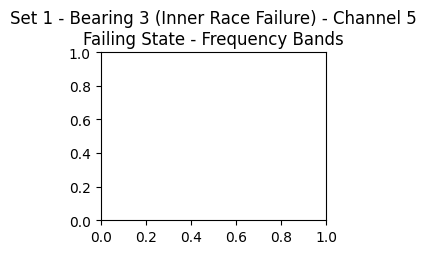

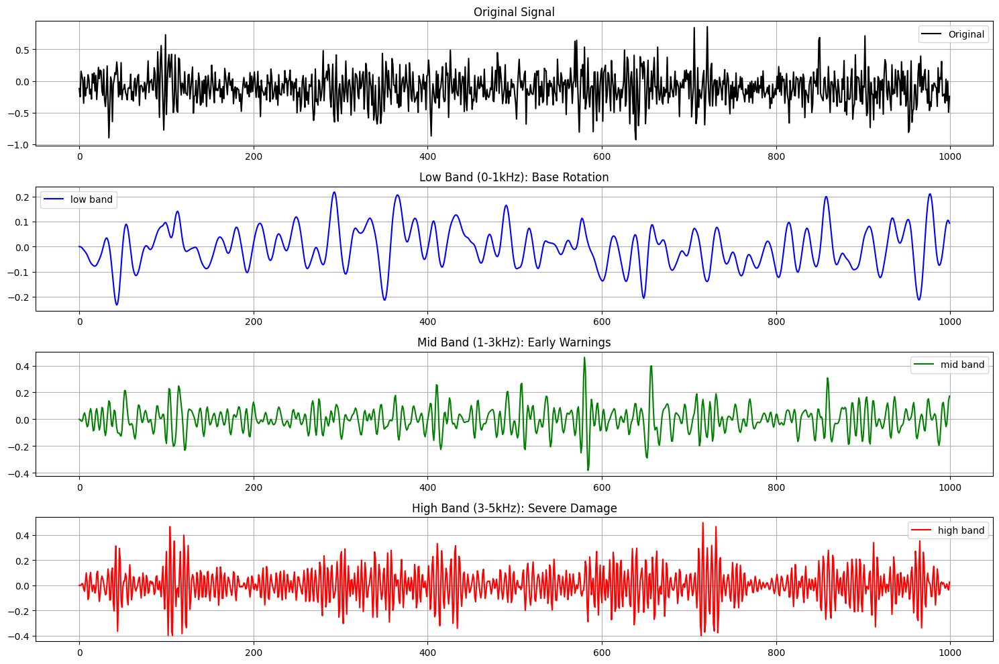

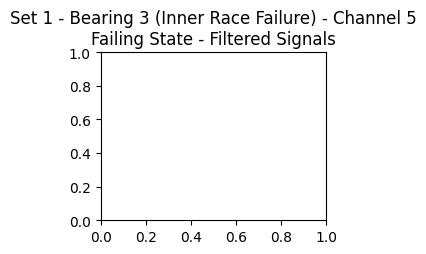

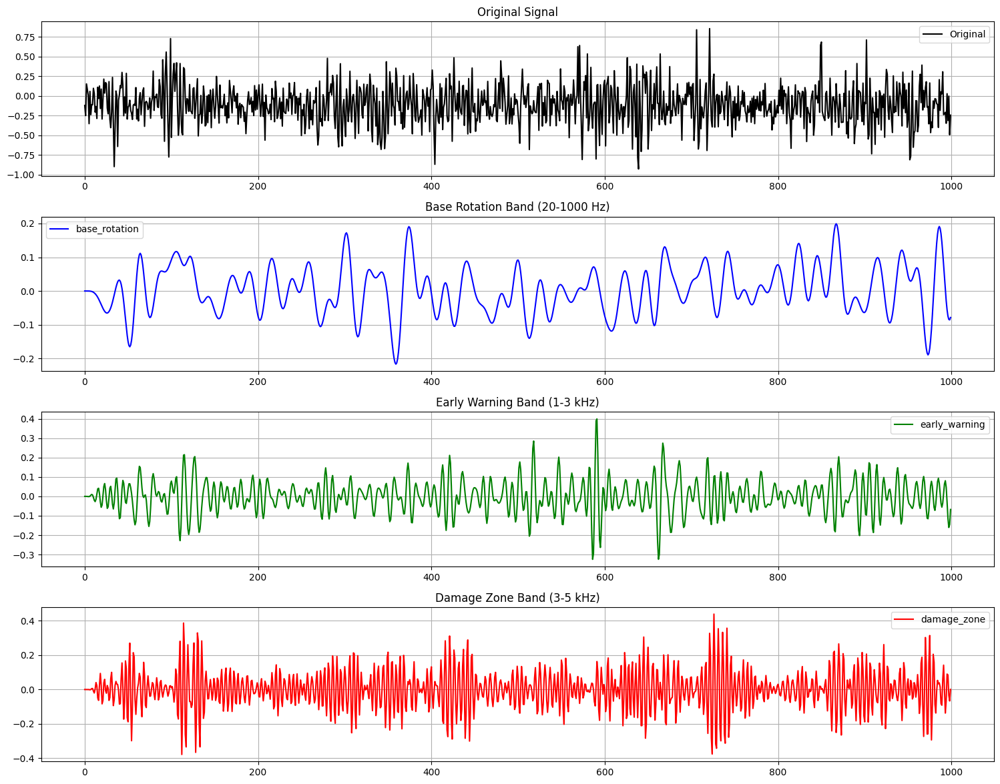

<Figure size 640x480 with 0 Axes>

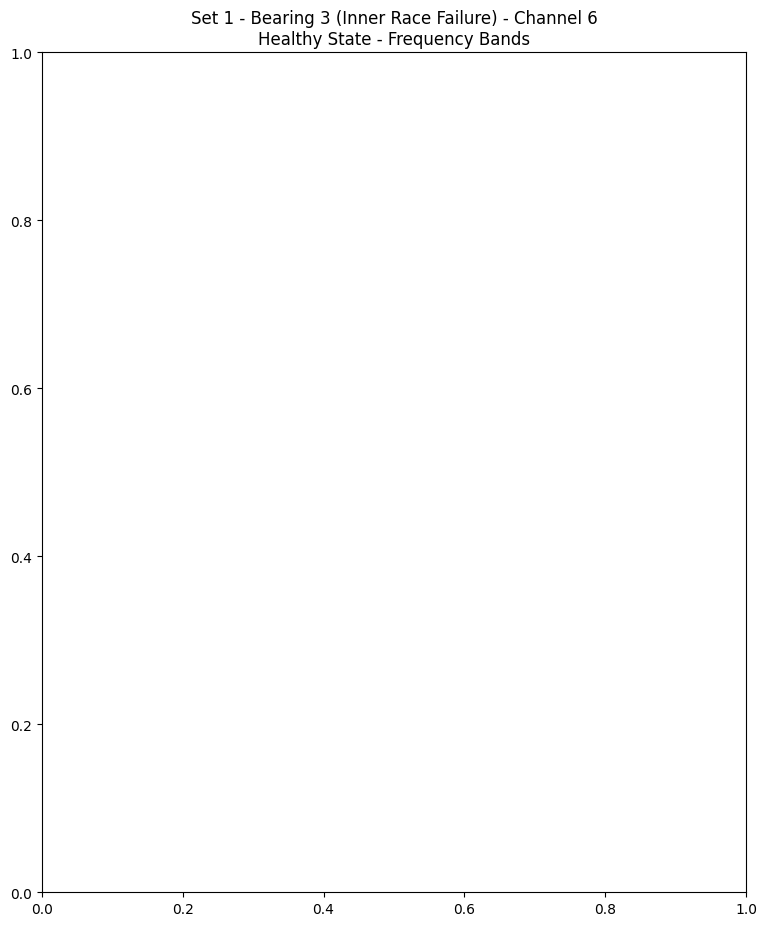

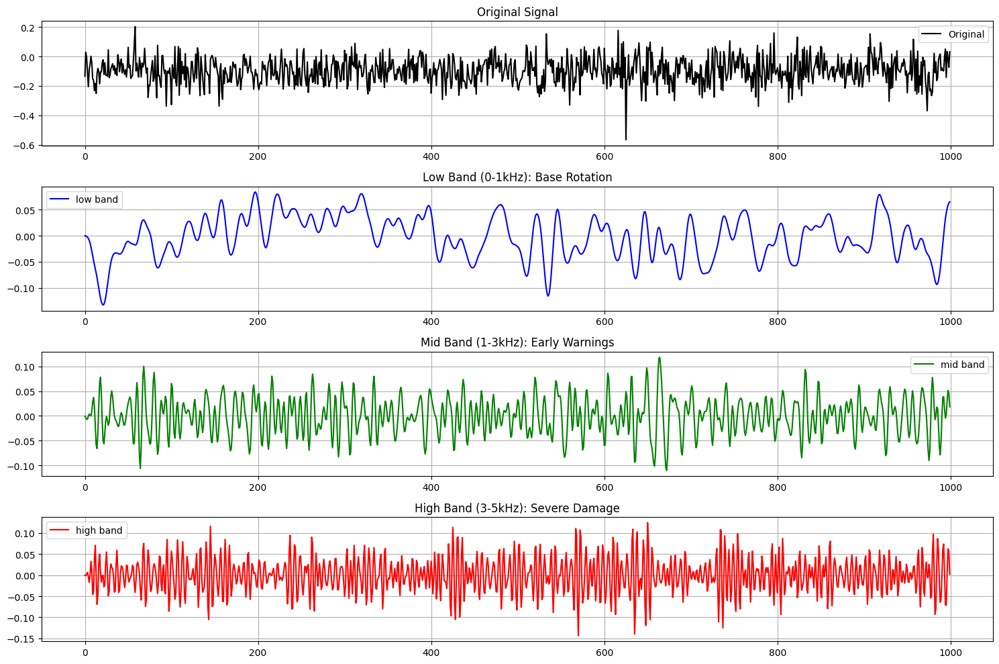

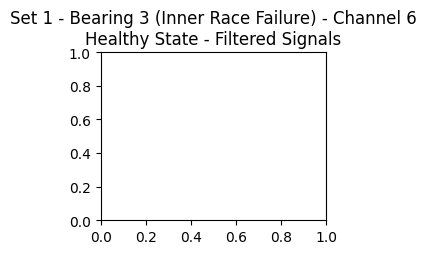

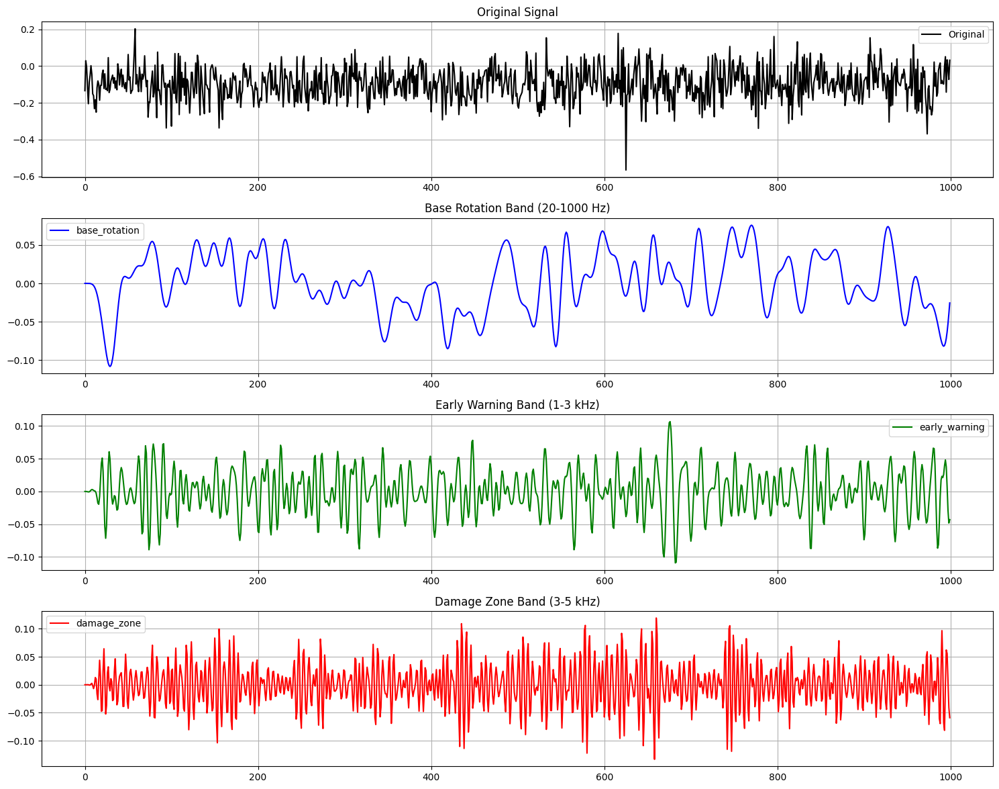

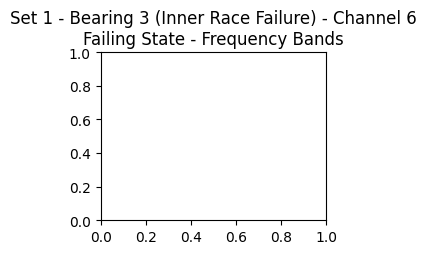

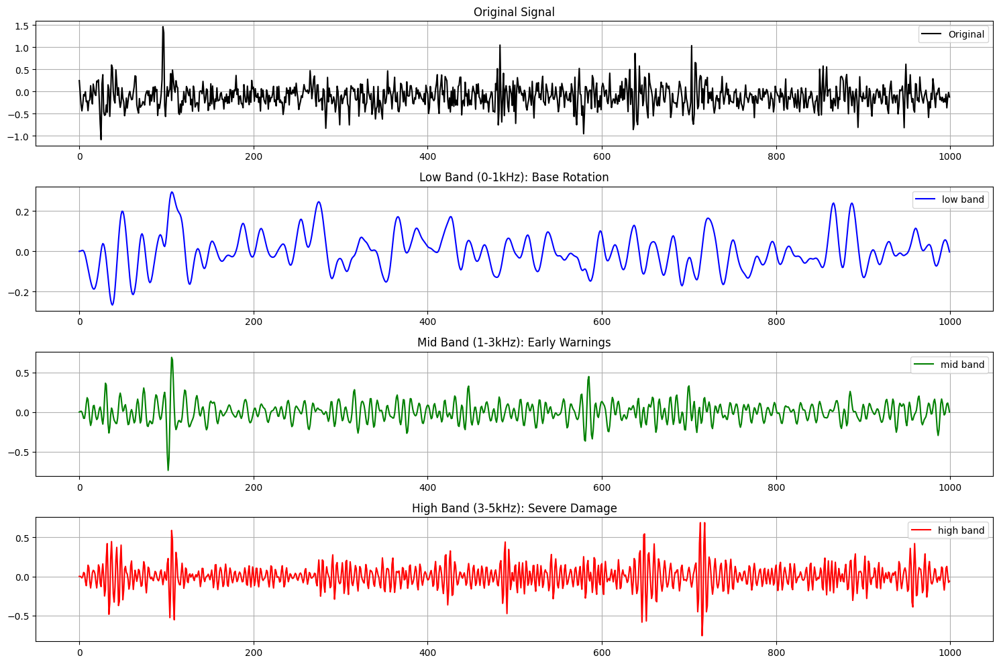

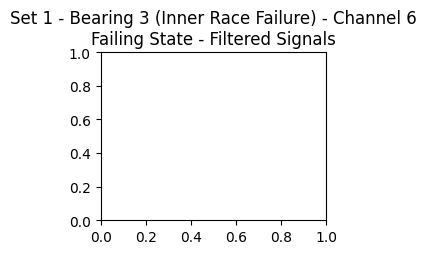

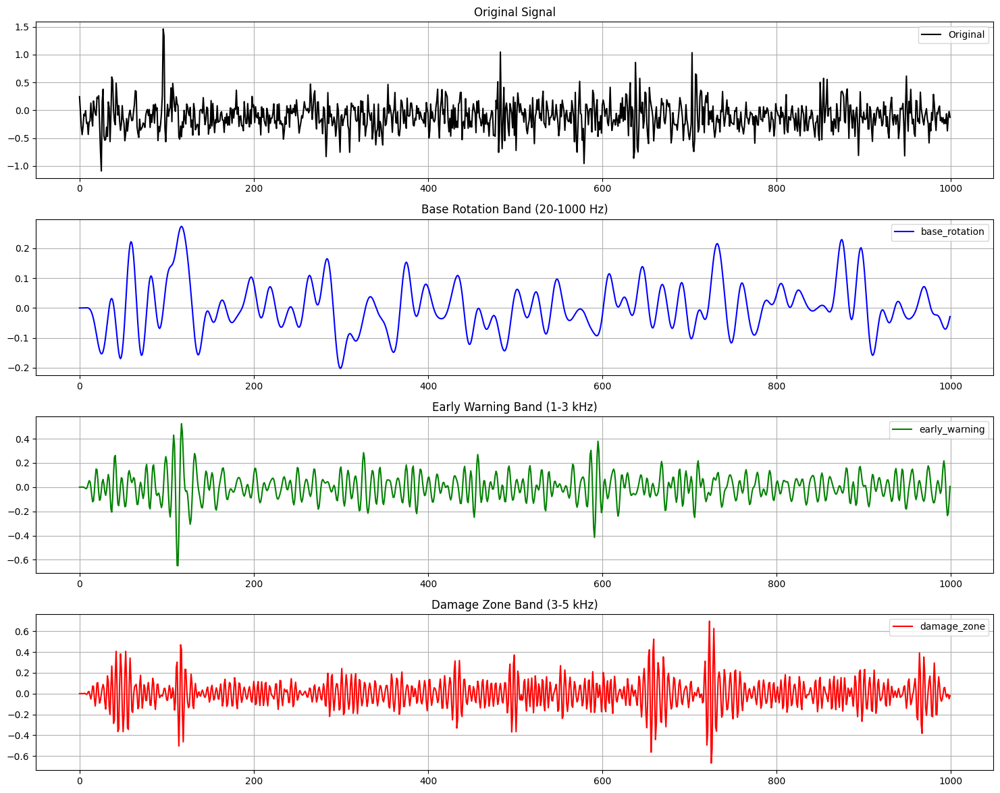

<Figure size 640x480 with 0 Axes>

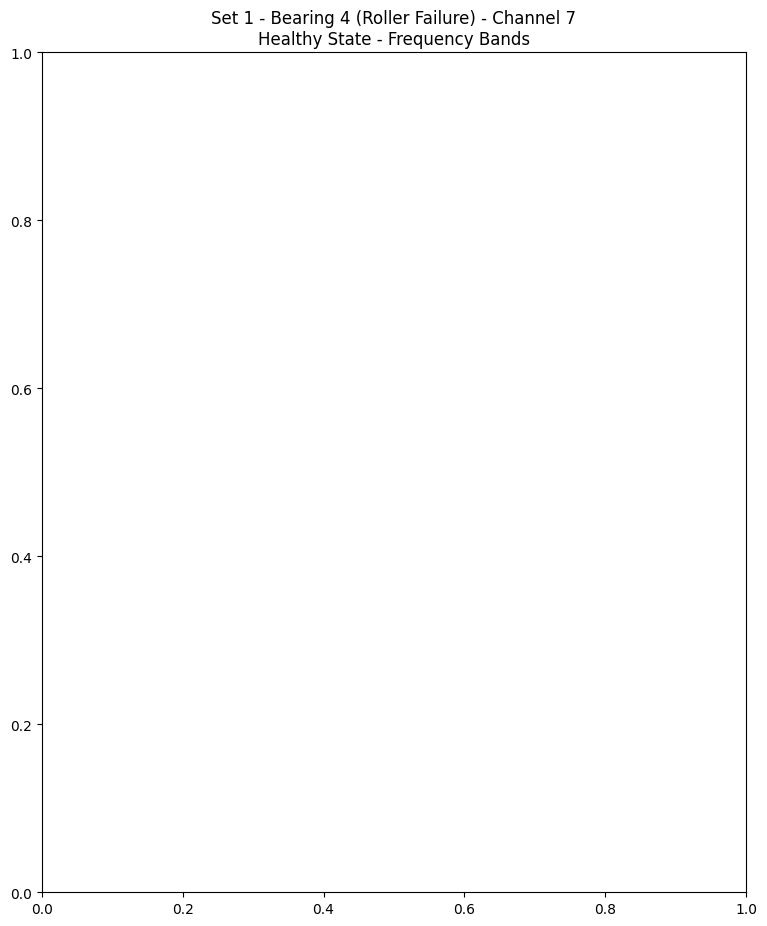

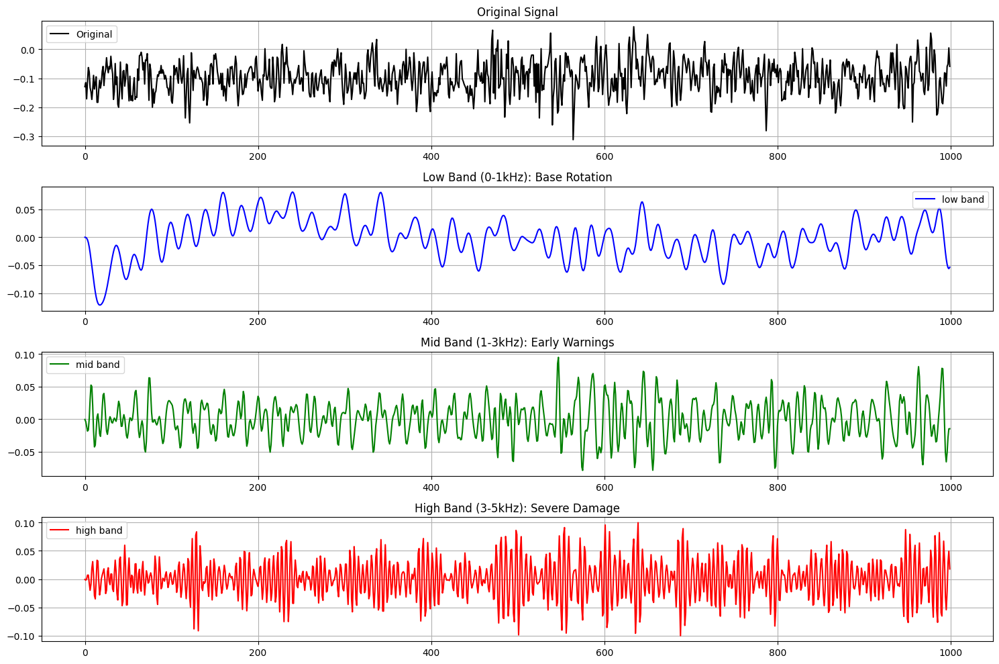

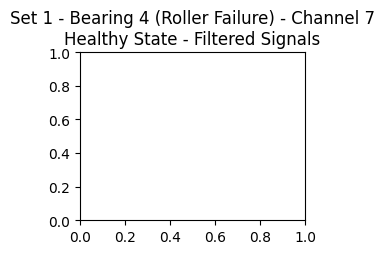

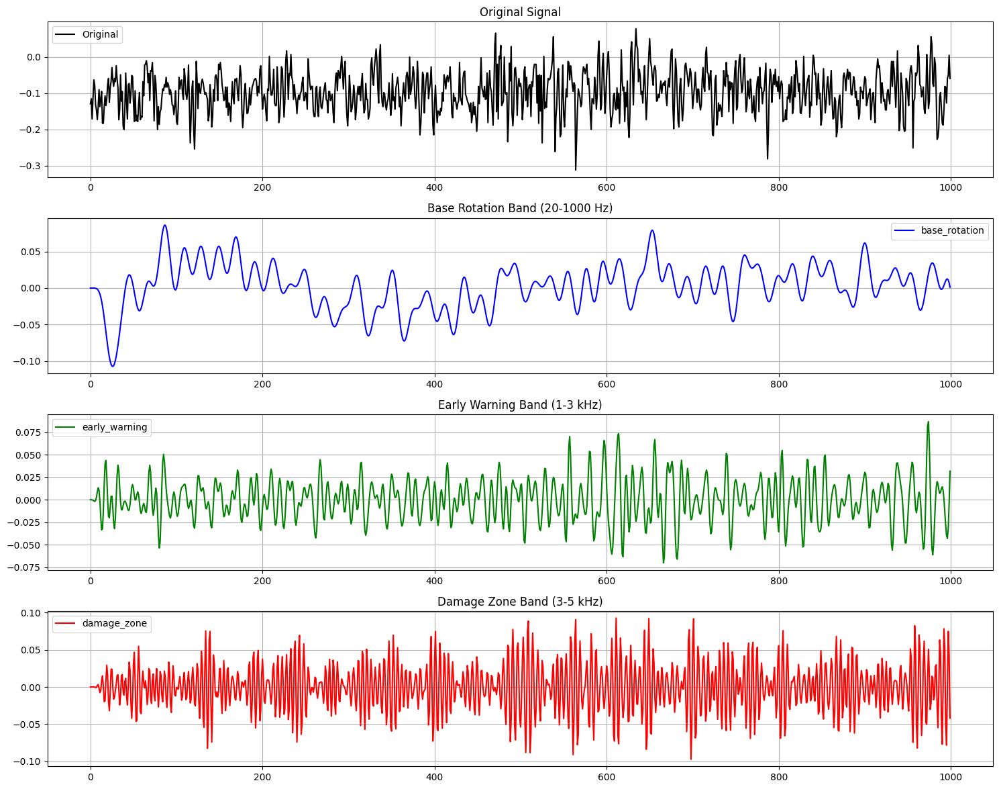

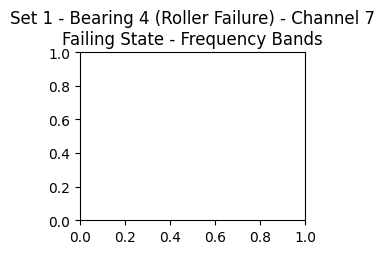

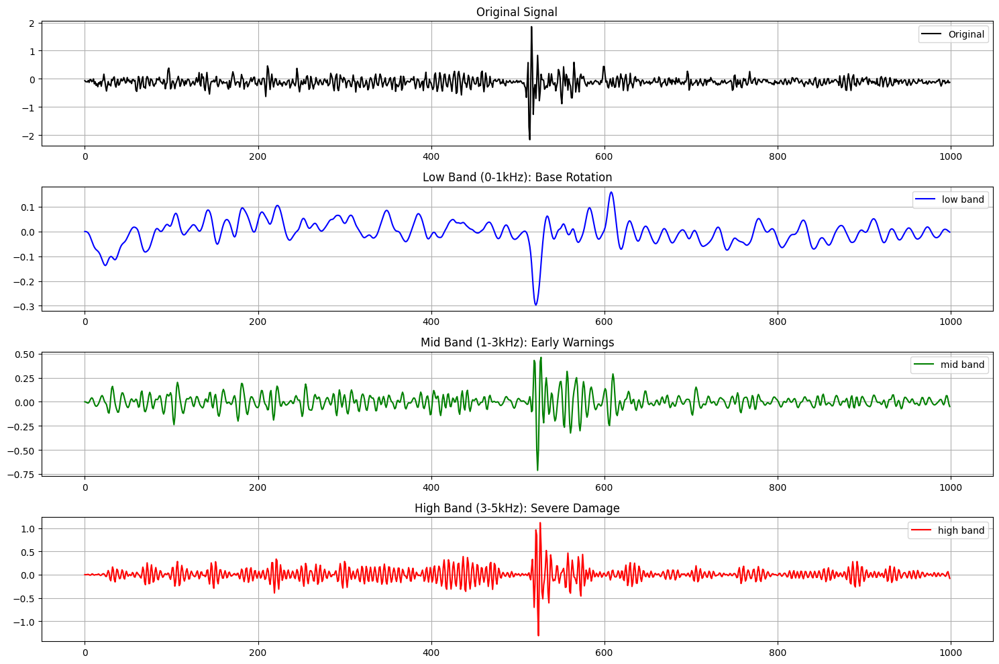

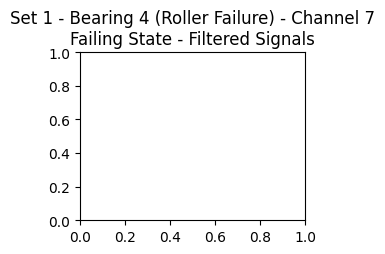

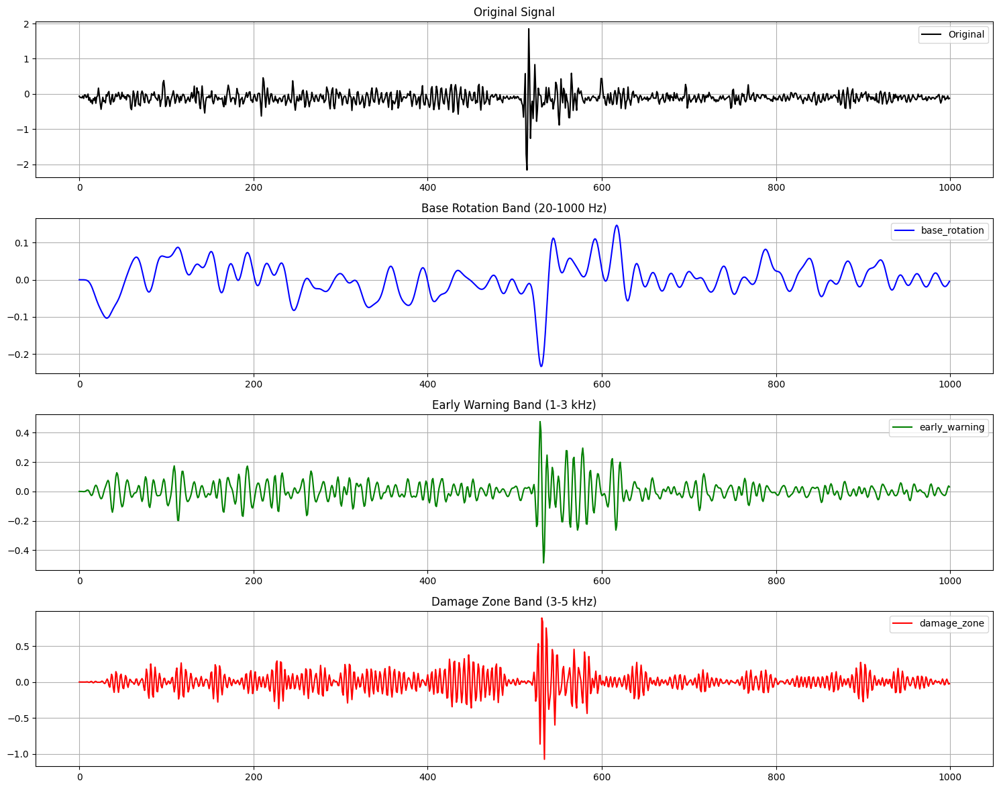

<Figure size 640x480 with 0 Axes>

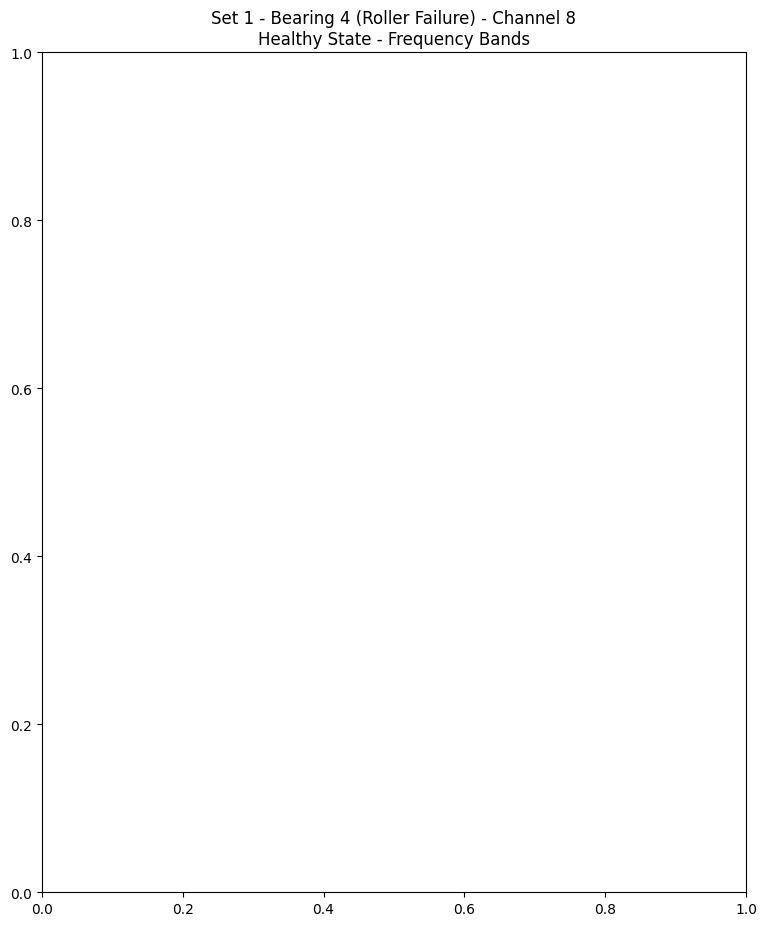

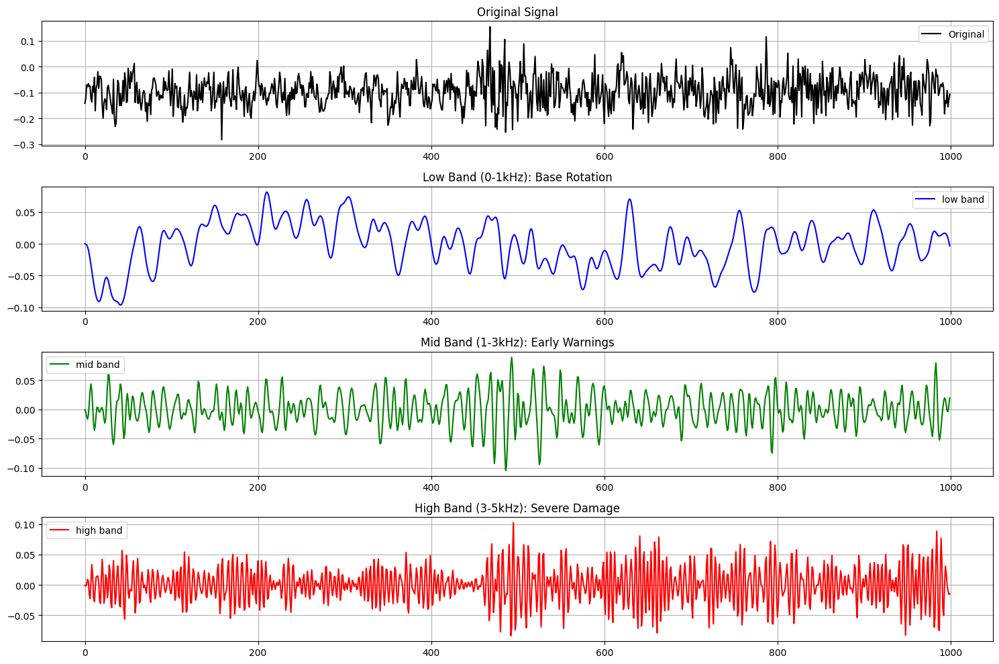

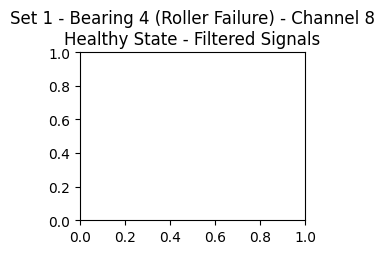

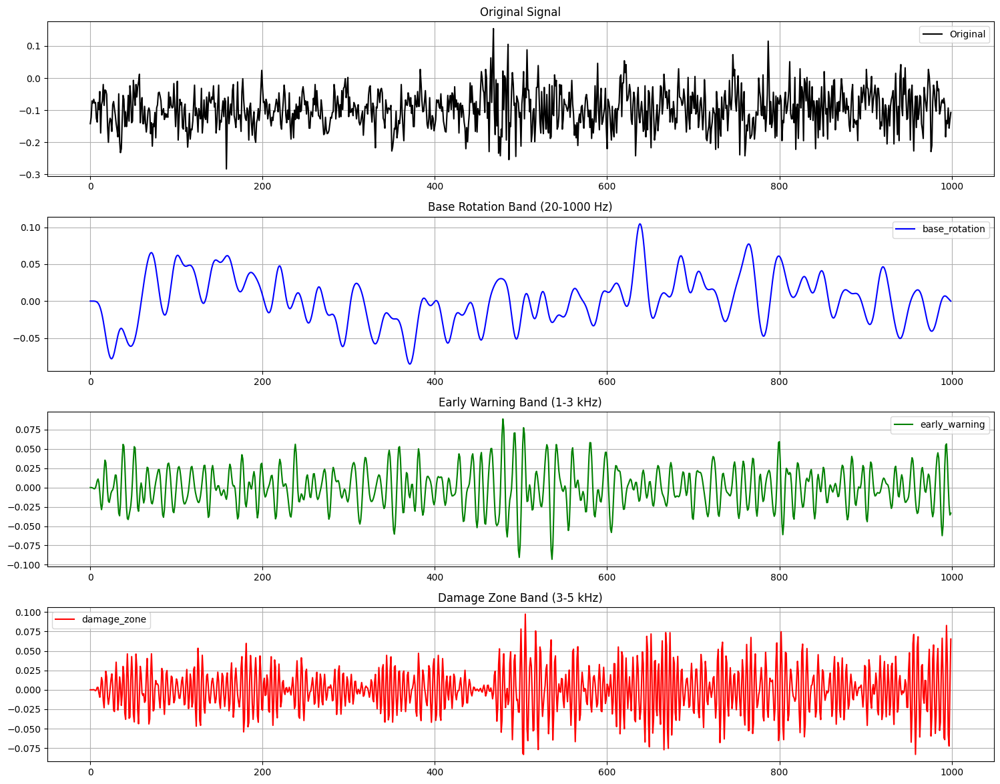

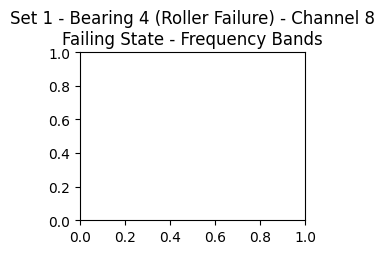

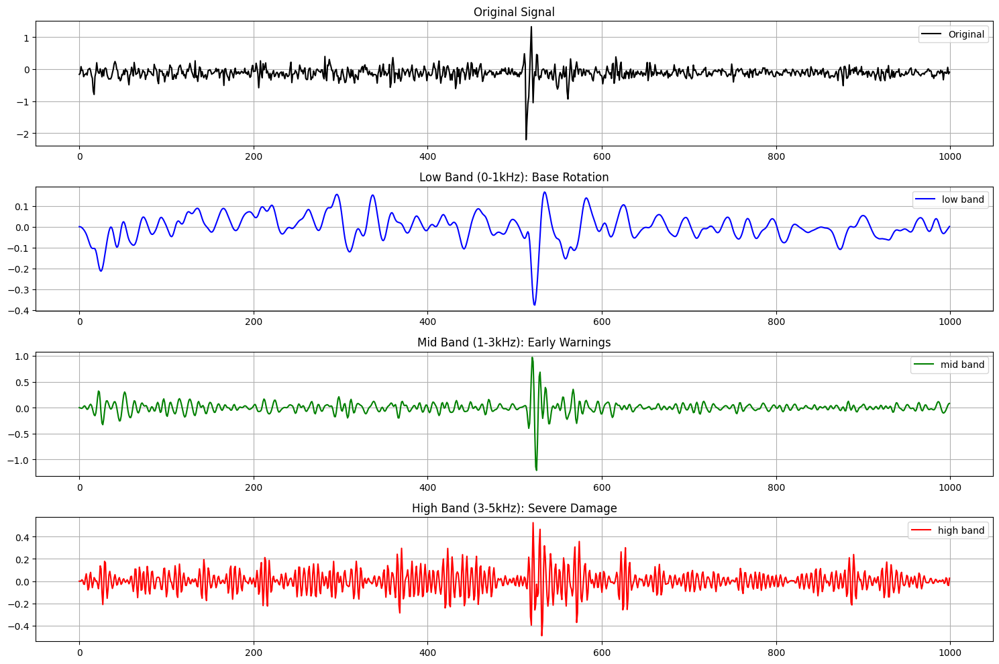

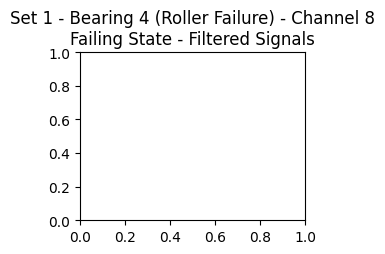

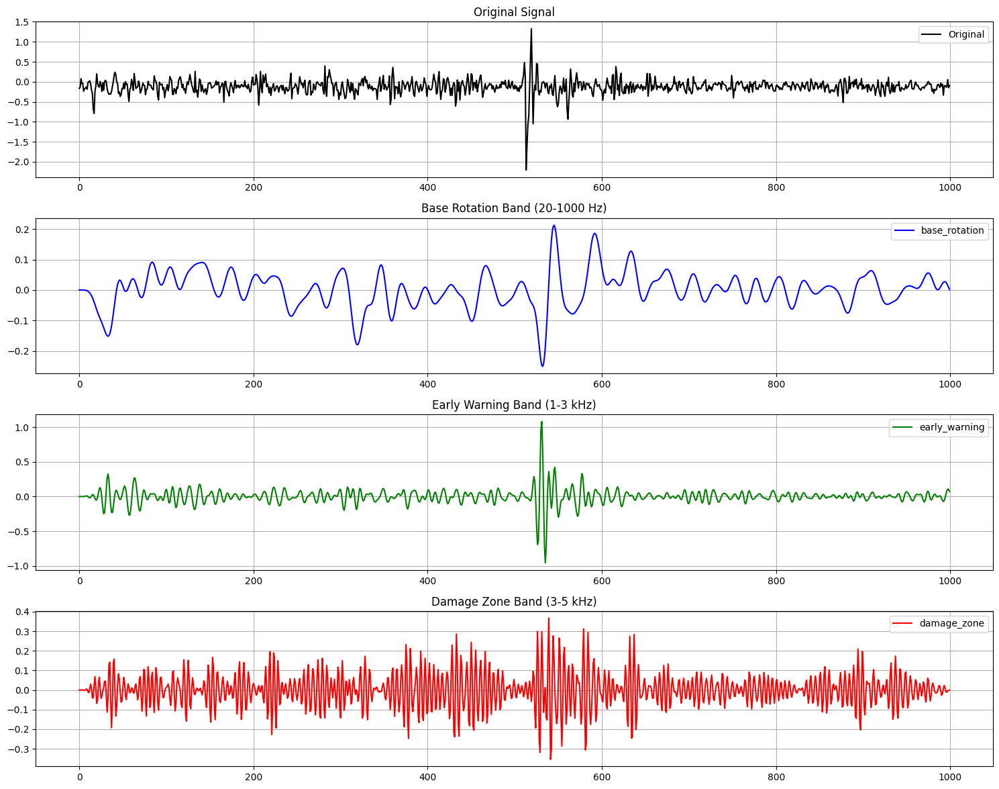

<Figure size 640x480 with 0 Axes>

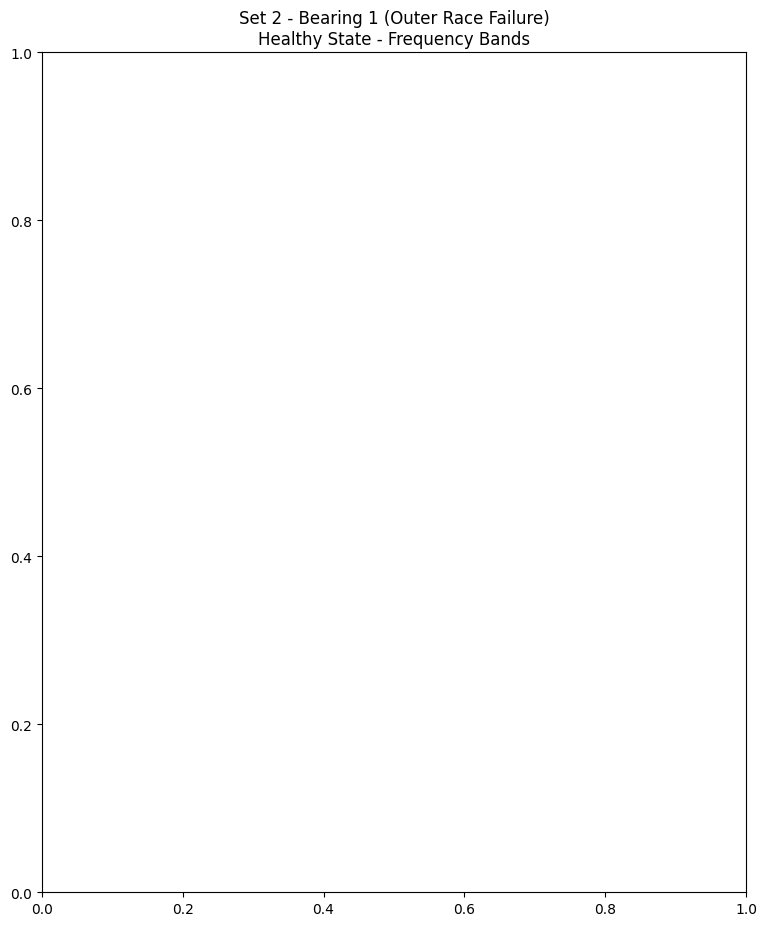

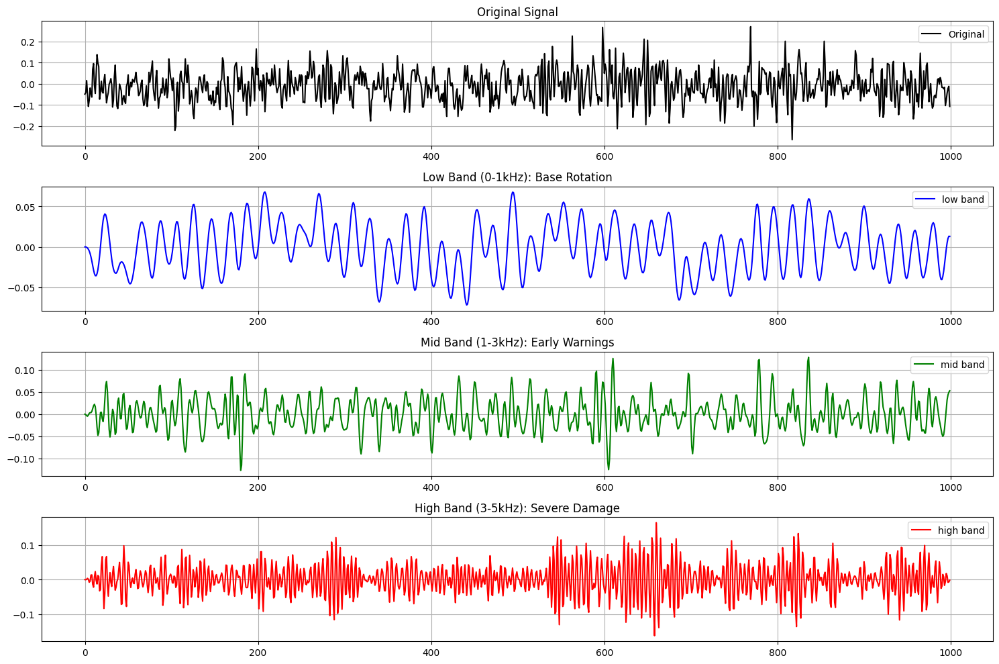

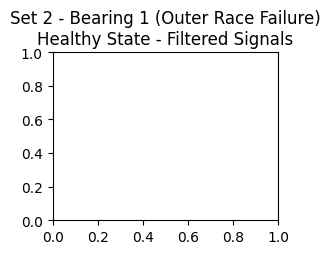

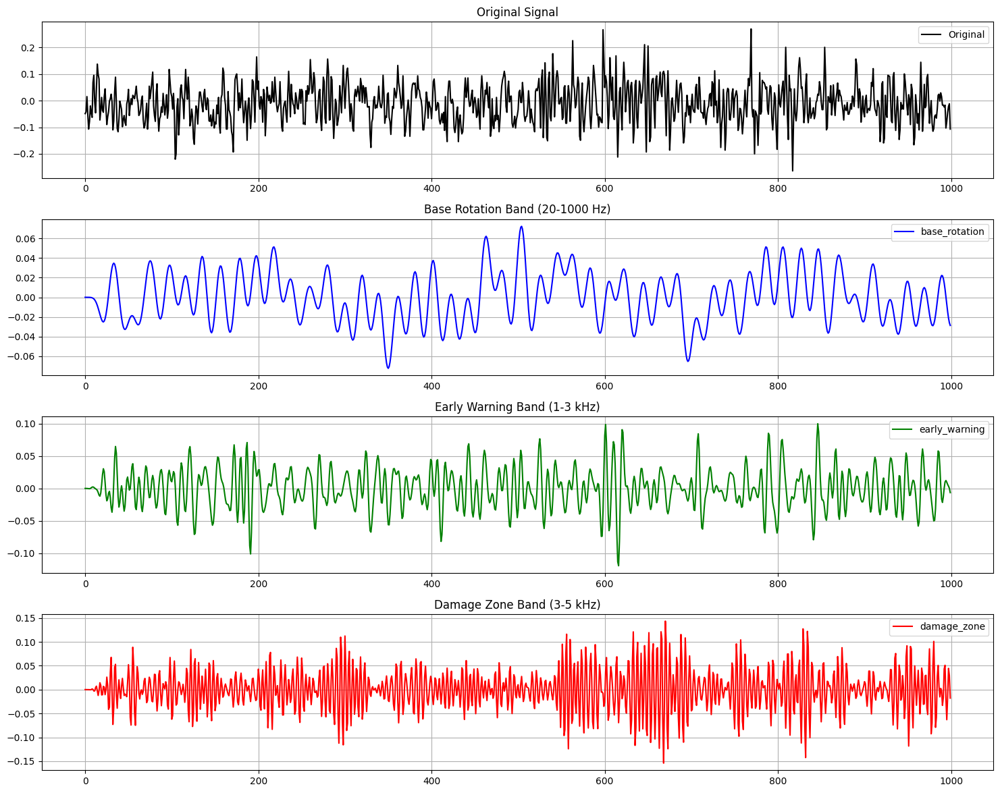

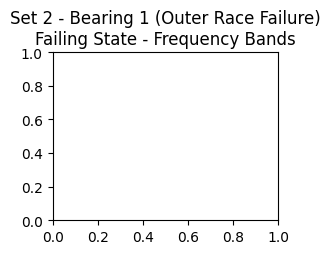

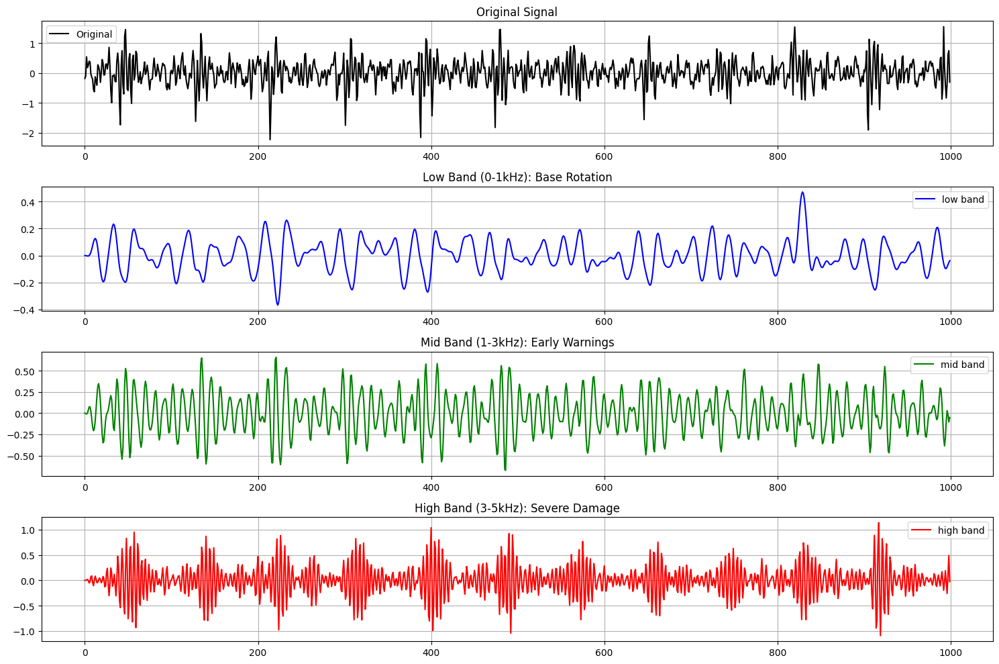

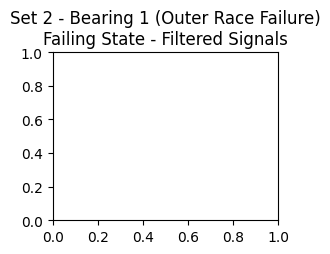

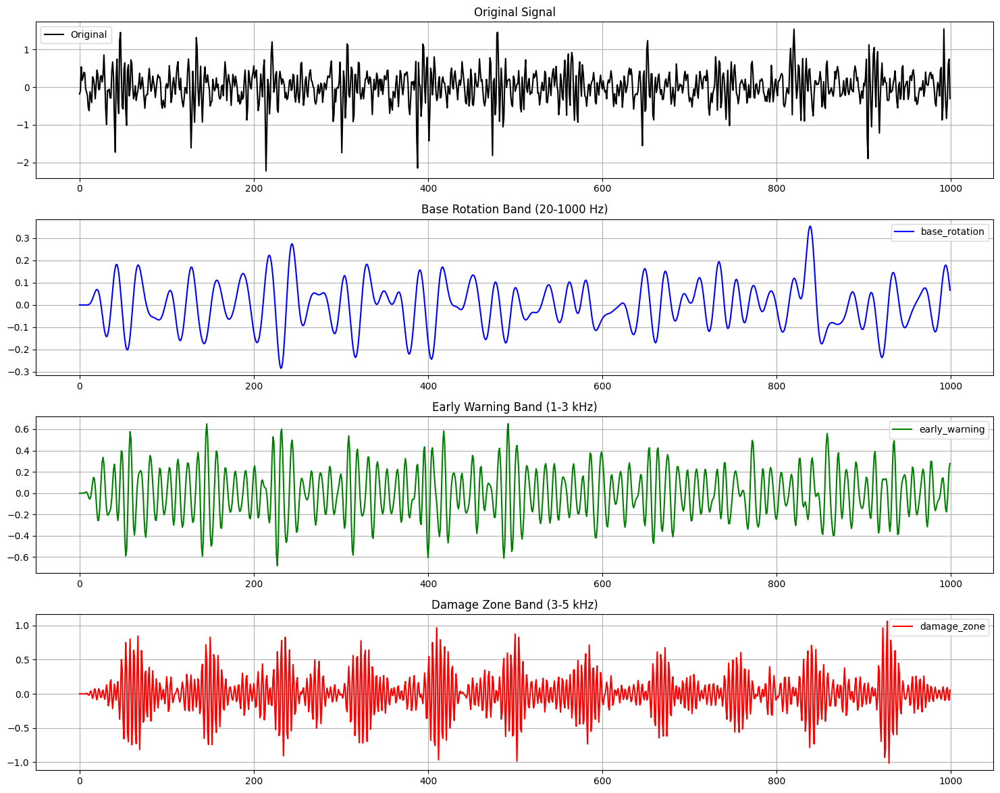

<Figure size 640x480 with 0 Axes>

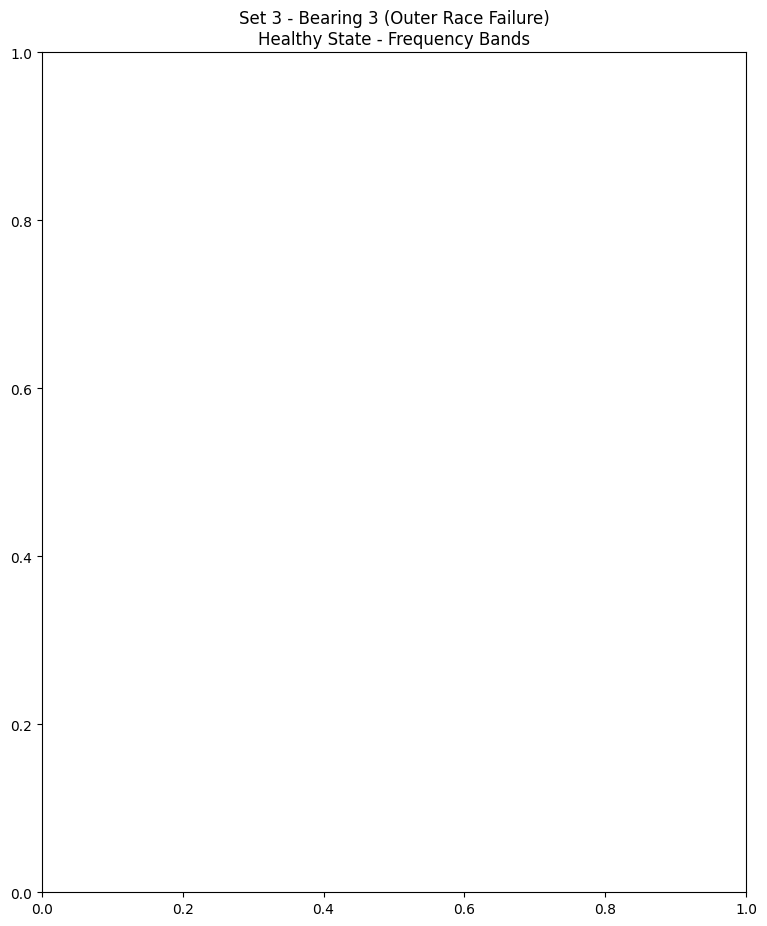

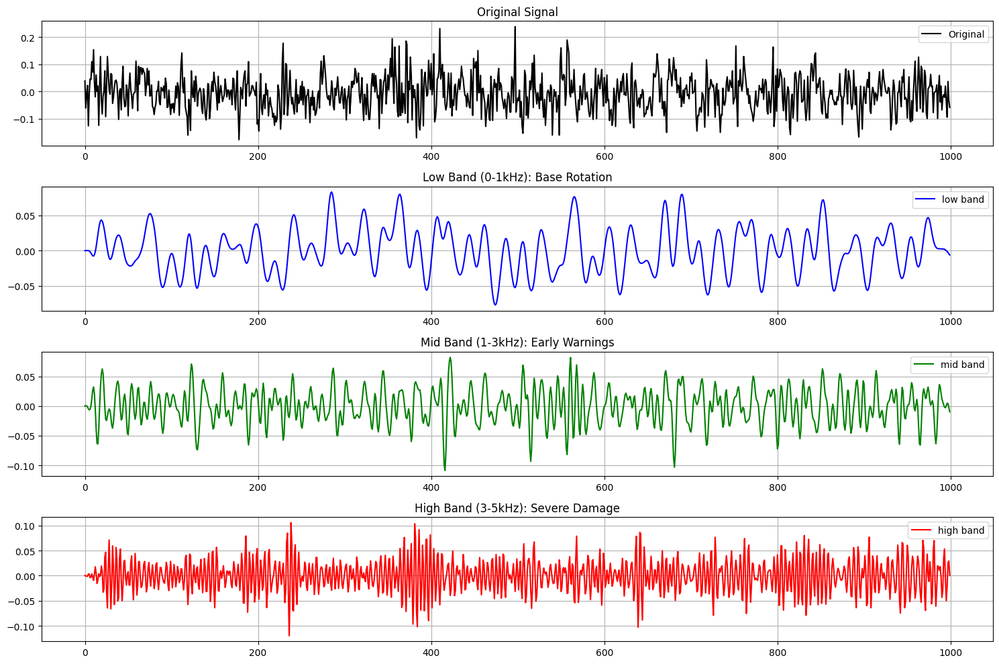

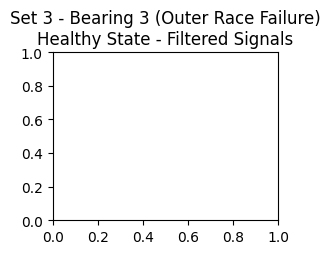

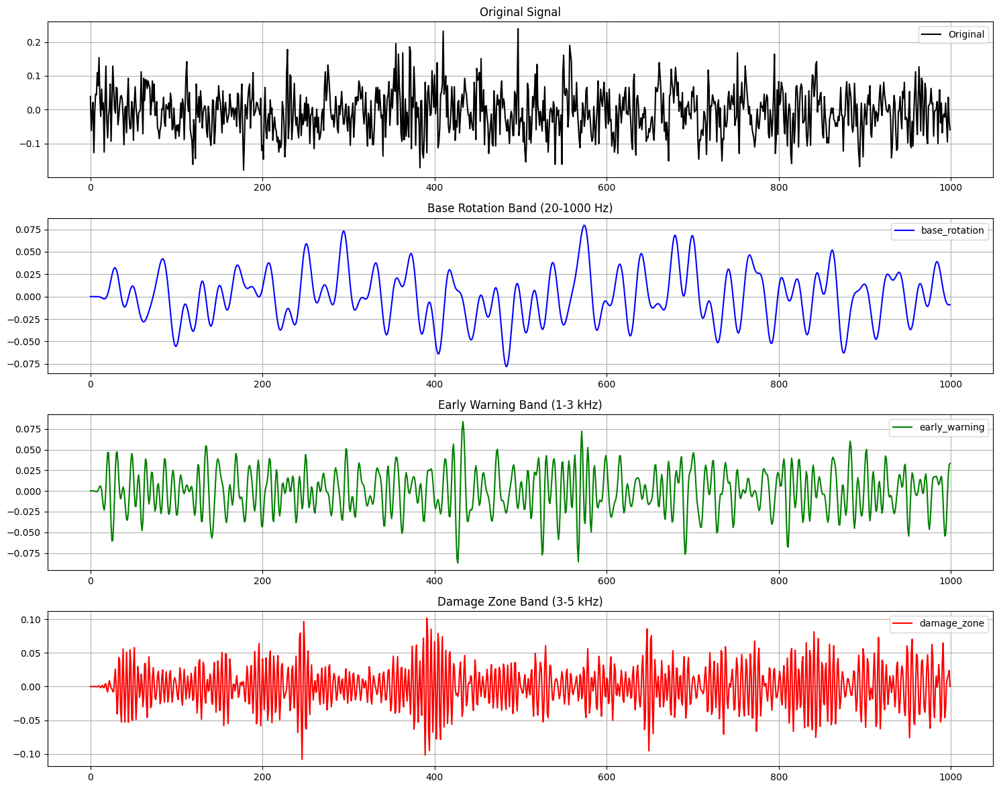

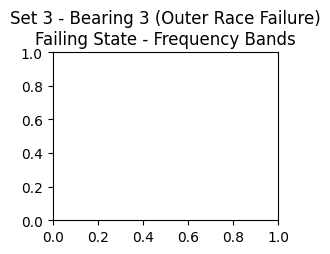

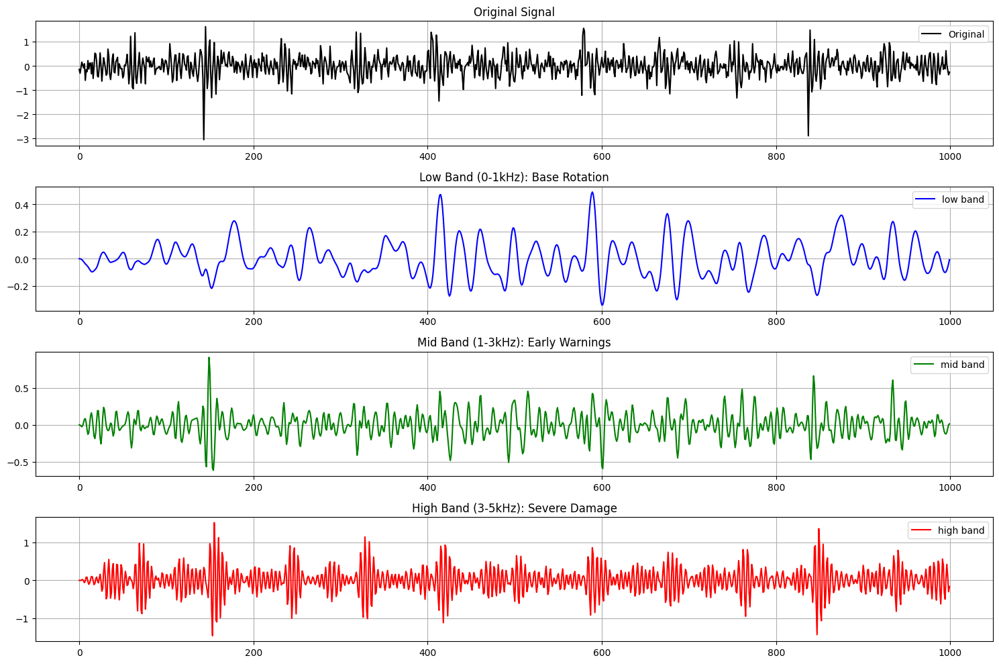

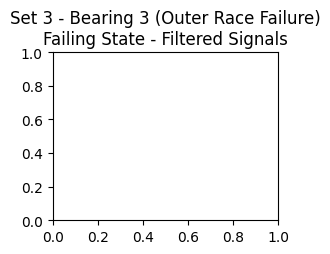

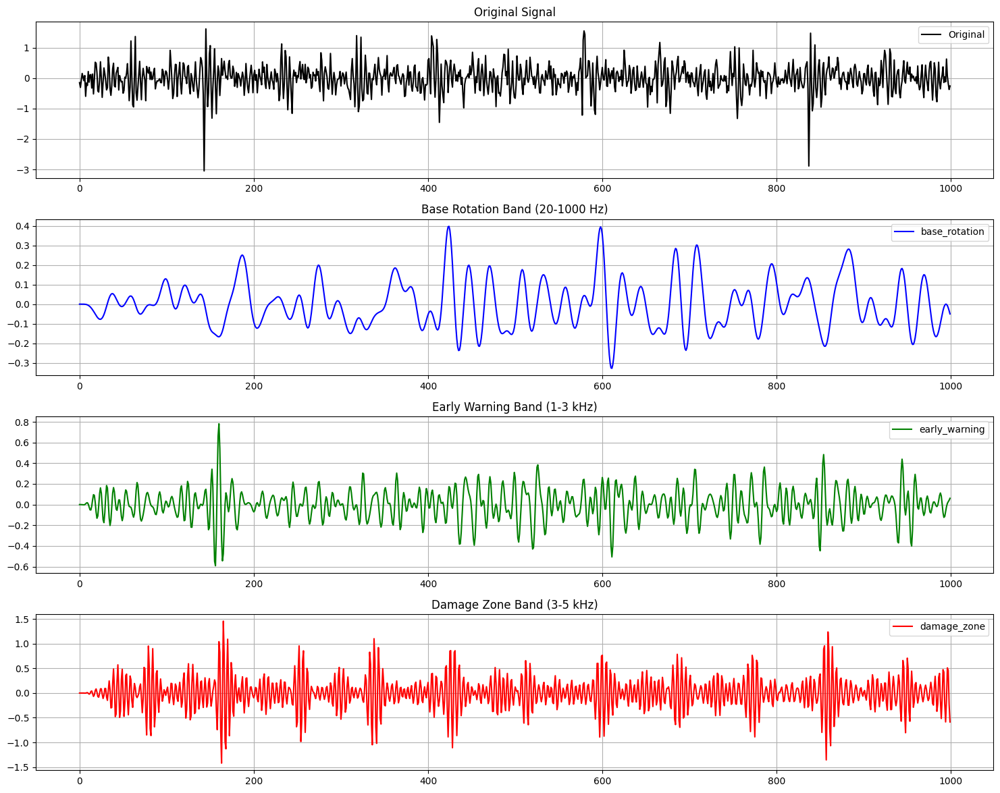

<Figure size 640x480 with 0 Axes>

In [58]:
def plot_complete_analysis(data_healthy, data_failing, channel, bearing_info):
    """
    Show both frequency bands and filtered comparison for healthy and failing states
    
    Args:
        data_healthy: healthy state data
        data_failing: failing state data
        channel: channel number to analyze
        bearing_info: string with bearing and failure type info
    """
    plt.figure(figsize=(20, 24))
    
    # Healthy State - Left Column
    plt.subplot(2, 2, 1)
    plt.title(f"{bearing_info}\nHealthy State - Frequency Bands")
    healthy_bands = analyze_frequency_bands(data_healthy, channel)
    plot_frequency_bands(data_healthy[:, channel], healthy_bands)
    
    plt.subplot(2, 2, 2)
    plt.title(f"{bearing_info}\nHealthy State - Filtered Signals")
    plot_filtered_comparison(data_healthy, channel, "")
    
    # Failing State - Right Column
    plt.subplot(2, 2, 3)
    plt.title(f"{bearing_info}\nFailing State - Frequency Bands")
    failing_bands = analyze_frequency_bands(data_failing, channel)
    plot_frequency_bands(data_failing[:, channel], failing_bands)
    
    plt.subplot(2, 2, 4)
    plt.title(f"{bearing_info}\nFailing State - Filtered Signals")
    plot_filtered_comparison(data_failing, channel, "")
    
    plt.tight_layout()
    plt.show()

# Load all the data we need
files_1 = sorted(data_path_1.glob("*"))
files_2 = sorted(data_path_2.glob("*"))
files_3 = sorted(data_path_3.glob("*"))

# Set 1 - Bearing 3 (Inner Race) Channel 5
bearing3_healthy = np.loadtxt(files_1[0])
bearing3_failing = np.loadtxt(files_1[-10])
plot_complete_analysis(bearing3_healthy, bearing3_failing, 4, 
                      "Set 1 - Bearing 3 (Inner Race Failure) - Channel 5")

# Set 1 - Bearing 3 (Inner Race) Channel 6
plot_complete_analysis(bearing3_healthy, bearing3_failing, 5, 
                      "Set 1 - Bearing 3 (Inner Race Failure) - Channel 6")

# Set 1 - Bearing 4 (Roller) Channel 7
bearing4_failing_idx = int(len(files_1) * 0.81)
bearing4_failing = np.loadtxt(files_1[bearing4_failing_idx])
plot_complete_analysis(bearing3_healthy, bearing4_failing, 6, 
                      "Set 1 - Bearing 4 (Roller Failure) - Channel 7")

# Set 1 - Bearing 4 (Roller) Channel 8
plot_complete_analysis(bearing3_healthy, bearing4_failing, 7, 
                      "Set 1 - Bearing 4 (Roller Failure) - Channel 8")

# Set 2 - Bearing 1 (Outer Race)
bearing_s2_healthy = np.loadtxt(files_2[0])
bearing_s2_failing = np.loadtxt(files_2[-10])
plot_complete_analysis(bearing_s2_healthy, bearing_s2_failing, 0, 
                      "Set 2 - Bearing 1 (Outer Race Failure)")

# Set 3 - Bearing 3 (Outer Race)
bearing_s3_healthy = np.loadtxt(files_3[0])
bearing_s3_failing = np.loadtxt(files_3[-10])
plot_complete_analysis(bearing_s3_healthy, bearing_s3_failing, 2, 
                      "Set 3 - Bearing 3 (Outer Race Failure)")